# Functions

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tsfresh import extract_features
from tsfresh.utilities.dataframe_functions import impute
from simpml.tabular.all import *

def plot_collision_distribution_by_split(df: pd.DataFrame):
    # Filter only train and test
    filtered_df = df[df['split'].isin(['train', 'test'])]
    
    # Countplot
    plt.figure(figsize=(10, 6))
    ax = sns.countplot(data=filtered_df, x='collision_label', hue='split')
    plt.title('Collision Label Distribution by Split')
    plt.xlabel('Collision Label')
    plt.ylabel('Count')
    plt.legend(title='Split')
    plt.tight_layout()

    # Add count annotations
    for p in ax.patches:
        height = int(p.get_height())
        ax.annotate(f'{height}', (p.get_x() + p.get_width() / 2., height),
                    ha='center', va='bottom', fontsize=10)

    plt.show()

def plot_time_series_by_collision_label(meta_df, df_sensor, n=5):
    # Extract unique collision labels
    unique_labels = meta_df['collision_label'].unique()
    
    # Set up subplots
    fig, axes = plt.subplots(1, len(unique_labels), figsize=(15, 5), sharey=True)
    if len(unique_labels) == 1:
        axes = [axes]  # ensure iterable

    # Loop over each label
    for ax, label in zip(axes, unique_labels):
        # Filter relevant video IDs
        relevant_ids = meta_df[meta_df['collision_label'] == label]['id'].tolist()
        # Take up to n series
        sample_ids = relevant_ids[:n]
        
        for vid in sample_ids:
            # Some sensor IDs might be prefixed with "incident-0-", clean if needed
            matching_ids = [s_id for s_id in df_sensor['id'].unique() if vid in s_id]
            if not matching_ids:
                continue
            
            sensor_id = matching_ids[0]
            data = df_sensor[df_sensor['id'] == sensor_id].copy()
            data = data.sort_values('time')
            time = data['time'] - data['time'].min()  # normalize time

            ax.plot(time, data['x'], label=f'{vid} - x', alpha=0.5)
            ax.plot(time, data['y'], label=f'{vid} - y', alpha=0.5)
            ax.plot(time, data['z'], label=f'{vid} - z', alpha=0.5)

        ax.set_title(f'Collision Label: {label}')
        ax.set_xlabel('Time (normalized)')
        ax.legend(fontsize=6)
        ax.grid(True)
        
    axes[0].set_ylabel('Sensor Value')
    plt.tight_layout()
    plt.show()

/opt/anaconda3/envs/simpml/lib/python3.9/site-packages/dask/dataframe/_pyarrow_compat.py:17: FutureWarning: Minimal version of pyarrow will soon be increased to 14.0.1. You are using 12.0.1. Please consider upgrading.
  warnings.warn(


Error importing huggingface_hub.hf_api: No module named 'filelock'


In [2]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, precision_recall_curve, average_precision_score
from sklearn.metrics import recall_score, precision_score, f1_score, roc_curve, auc
import seaborn as sns
import pandas as pd

def plot_organized_evaluation(y_true, y_prob, threshold=0.5, population_config=None, title=None):
    """
    Displays organized plots for model performance evaluation:
    Row 1: Confusion matrices (standard and normalized)
    Row 2: Precision-recall curve and precision/recall vs confidence threshold
    Row 3: Comparison of metrics before and after population adjustment and ROC curve
    
    Parameters:
    -----------
    y_true : array-like
        True labels
    y_prob : array-like
        Predicted probabilities (output from predict_proba)
    threshold : float
        Classification threshold (default: 0.5)
    population_config : dict, optional
        Dictionary with 'true_pos_population' and 'true_neg_population'
    title : str, optional
        Main title for the plot
    """
    # Ensure y_true is a numpy array
    y_true = np.array(y_true)
    
    # Handle different formats of prediction probabilities
    if len(y_prob.shape) == 1:
        # If y_prob is a vector of probabilities for the positive class only
        probs_positive = y_prob
        probs_negative = 1 - y_prob
        y_prob_matrix = np.column_stack((probs_negative, probs_positive))
    else:
        # If y_prob is a matrix of probabilities for both classes
        y_prob_matrix = y_prob
        probs_positive = y_prob_matrix[:, 1]
    
    # Create binary predictions based on threshold
    y_pred = (probs_positive >= threshold).astype(int)
    
    # Create figure with subplots
    fig = plt.figure(figsize=(18, 15))
    if title:
        plt.suptitle(title, fontsize=16, y=0.98)
    
    # ------------------------ Row 1: Confusion Matrices -------------------------
    # Standard confusion matrix
    ax1 = plt.subplot2grid((3, 2), (0, 0))
    cm = confusion_matrix(y_true, y_pred)
    classes = ['Class 0', 'Class 1']
    
    sns.heatmap(cm, annot=True, fmt='d', cmap=plt.cm.Blues, 
                xticklabels=classes, yticklabels=classes, ax=ax1)
    ax1.set_ylabel('True Label')
    ax1.set_xlabel('Predicted Label')
    ax1.set_title(f'Confusion Matrix (threshold={threshold})')
    
    # Normalized confusion matrix
    ax2 = plt.subplot2grid((3, 2), (0, 1))
    cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    
    sns.heatmap(cm_norm, annot=True, fmt='.2f', cmap=plt.cm.Blues, 
                xticklabels=classes, yticklabels=classes, ax=ax2)
    ax2.set_ylabel('True Label')
    ax2.set_xlabel('Predicted Label')
    ax2.set_title(f'Normalized Confusion Matrix (threshold={threshold})')
    
    # Calculate performance metrics
    tn, fp, fn, tp = cm.ravel()
    accuracy = (tp + tn) / (tp + tn + fp + fn)
    precision = tp / (tp + fp) if (tp + fp) > 0 else 0
    recall = tp / (tp + fn) if (tp + fn) > 0 else 0
    f1 = 2 * precision * recall / (precision + recall) if (precision + recall) > 0 else 0
    
    metrics_text = f"Accuracy: {accuracy:.4f}\nPrecision: {precision:.4f}\nRecall: {recall:.4f}\nF1 Score: {f1:.4f}"
    
    # Add performance metrics as text
    ax1.text(0.5, -0.2, metrics_text, transform=ax1.transAxes, 
             horizontalalignment='center', verticalalignment='center', fontsize=10)
    
    # ------------------------ Row 2: PR Curves and Threshold Graph -------------------------
    # Precision-Recall Curve
    ax3 = plt.subplot2grid((3, 2), (1, 0))
    
    # For class 1 (positive class)
    precision_1, recall_1, thresholds_1 = precision_recall_curve(y_true, probs_positive)
    avg_precision_1 = average_precision_score(y_true, probs_positive)
    ax3.plot(recall_1, precision_1, lw=2, label=f'Class 1 (AP = {avg_precision_1:.4f})')
    
    # For class 0 (negative class - need to invert labels)
    precision_0, recall_0, thresholds_0 = precision_recall_curve(1 - y_true, 1 - probs_positive)
    avg_precision_0 = average_precision_score(1 - y_true, 1 - probs_positive)
    ax3.plot(recall_0, precision_0, lw=2, label=f'Class 0 (AP = {avg_precision_0:.4f})')
    
    # Add iso-f1 curves
    f_scores = np.linspace(0.2, 0.8, num=4)
    for f_score in f_scores:
        x = np.linspace(0.01, 1)
        y = f_score * x / (2 * x - f_score)
        ax3.plot(x[y >= 0], y[y >= 0], color='gray', alpha=0.2)
        ax3.annotate(f'f1={f_score:.1f}', xy=(0.8, y[45] + 0.02))
    
    ax3.set_xlim([0.0, 1.0])
    ax3.set_ylim([0.0, 1.05])
    ax3.set_xlabel('Recall')
    ax3.set_ylabel('Precision')
    ax3.set_title('Precision-Recall Curve')
    ax3.legend(loc='best')
    ax3.grid(alpha=0.3)
    
    # Precision & Recall vs Confidence Threshold graph
    ax4 = plt.subplot2grid((3, 2), (1, 1))
    
    # Display options for metrics
    show_metrics = "recall"  # Options: "both", "precision", "recall"
    
    # Create test threshold values
    thresholds_test = np.linspace(0.1, 0.9, 9)
    precisions = []
    recalls = []
    
    # Calculate precision and recall for each threshold
    for thresh in thresholds_test:
        y_pred_t = (probs_positive >= thresh).astype(int)
        
        # Calculate metrics
        prec = precision_score(y_true, y_pred_t, zero_division=0)
        rec = recall_score(y_true, y_pred_t, zero_division=0)
        
        precisions.append(prec)
        recalls.append(rec)
    
    # Plot values against threshold based on show_metrics option
    if show_metrics == "both" or show_metrics == "precision":
        ax4.plot(thresholds_test, precisions, 'b-', label='Precision')
        
    if show_metrics == "both" or show_metrics == "recall":
        ax4.plot(thresholds_test, recalls, 'r-', label='Recall')
    
    # Mark current threshold
    ax4.axvline(x=threshold, color='g', linestyle='--', label=f'Current Threshold ({threshold})')
    
    # Update title based on what's shown
    if show_metrics == "both":
        title = 'Precision & Recall vs. Confidence Threshold'
    elif show_metrics == "precision":
        title = 'Precision vs. Confidence Threshold'
    else:  # show_metrics == "recall"
        title = 'Recall vs. Confidence Threshold'
    
    ax4.set_xlim([0.0, 1.0])
    ax4.set_ylim([0.0, 1.05])
    ax4.set_xlabel('Confidence Threshold')
    ax4.set_ylabel('Score')
    ax4.set_title(title)
    ax4.legend(loc='best')
    ax4.grid(alpha=0.3)
    
    # ------------------------ Row 3: Split into two graphs -------------------------
    # Create two subplots in the third row
    ax5 = plt.subplot2grid((3, 2), (2, 0))
    ax6 = plt.subplot2grid((3, 2), (2, 1))
    
    # Left graph: Bar charts for adjusted metrics
    if population_config is not None:
        true_pos_population = population_config.get('true_pos_population', 2000)
        true_neg_population = population_config.get('true_neg_population', 5000)
        
        # Calculate adjusted metrics
        fp_rate = fp / (fp + tn) if (fp + tn) > 0 else 0
        
        # Scale FP to population size
        fp_population = fp_rate * true_neg_population
        
        # Calculate adjusted precision
        tp_population = recall * true_pos_population
        precision_adj = tp_population / (tp_population + fp_population) if (tp_population + fp_population) > 0 else 0
        
        # Calculate adjusted F1
        f1_adj = 2 * (precision_adj * recall) / (precision_adj + recall) if (precision_adj + recall) > 0 else 0
        
        # Visualization
        labels = ['Recall', 'Precision', 'F1 Score']
        before_adjustment = [recall, precision, f1]
        after_adjustment = [recall, precision_adj, f1_adj]  # recall remains the same
        
        x_pos = np.arange(len(labels))
        width = 0.35
        
        bars1 = ax5.bar(x_pos - width/2, before_adjustment, width, label='Before Adjustment')
        bars2 = ax5.bar(x_pos + width/2, after_adjustment, width, label='After Adjustment')
        
        # Add value labels
        for bars in [bars1, bars2]:
            ax5.bar_label(bars, padding=3, fmt='%.2f')
        
        ax5.set_ylabel('Scores')
        ax5.set_title('Metrics Before and After Adjustment')
        ax5.set_xticks(x_pos)
        ax5.set_xticklabels(labels)
        ax5.legend()
        ax5.set_ylim(0, 1)
        
        # Add population information
        population_text = (f"Population Info:\n"
                          f"True Positive Population: {true_pos_population}\n"
                          f"True Negative Population: {true_neg_population}")
        ax5.text(0.02, 0.05, population_text, transform=ax5.transAxes, fontsize=10,
                verticalalignment='bottom', bbox=dict(boxstyle='round', alpha=0.1))
    else:
        ax5.text(0.5, 0.5, "Population configuration not provided\nCannot compute adjusted metrics",
                transform=ax5.transAxes, horizontalalignment='center',
                verticalalignment='center', fontsize=14)
    
    # Right graph: ROC Curve
    fpr, tpr, _ = roc_curve(y_true, probs_positive)
    roc_auc = auc(fpr, tpr)
    
    ax6.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.4f})')
    ax6.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--', label='Random')
    
    # Mark current threshold on ROC curve if possible
    if len(fpr) > 1 and len(tpr) > 1:
        # Find closest point to current threshold's FPR and TPR
        current_fpr = fp / (fp + tn) if (fp + tn) > 0 else 0
        current_tpr = tp / (tp + fn) if (tp + fn) > 0 else 0
        ax6.plot(current_fpr, current_tpr, 'go', markersize=8, label=f'Threshold = {threshold}')
    
    ax6.set_xlim([0.0, 1.0])
    ax6.set_ylim([0.0, 1.05])
    ax6.set_xlabel('False Positive Rate')
    ax6.set_ylabel('True Positive Rate')
    ax6.set_title('Receiver Operating Characteristic (ROC) Curve')
    ax6.legend(loc='lower right')
    ax6.grid(alpha=0.3)
    
    # Layout adjustments
    plt.tight_layout()
    plt.subplots_adjust(hspace=0.35, top=0.92 if title else 0.95)
    
    return fig

class SegmentAnalyzer:
    """
    Class for analyzing model performance across multiple segments
    with integrated configuration for thresholds and population data.
    """
    
    def __init__(self, df, segment_column):
        """
        Initialize the segment analyzer.
        
        Parameters:
        -----------
        df : pandas.DataFrame
            DataFrame containing prediction data
        segment_column : str
            Column name to use for segmentation
        """
        self.df = df
        self.segment_column = segment_column
        self.segments_config = []
        self.results = {}
    
    def add_segment(self, min_value=None, max_value=None, name=None, 
                   true_pos_population=2000, true_neg_population=5000):
        """
        Add a segment configuration.
        
        Parameters:
        -----------
        min_value : float, optional
            Minimum value for the segment (inclusive)
        max_value : float, optional
            Maximum value for the segment (exclusive)
        name : str, optional
            Custom name for the segment (generated automatically if not provided)
        true_pos_population : int
            True positive population size for adjustments
        true_neg_population : int
            True negative population size for adjustments
        """
        segment_config = {
            'min_value': min_value,
            'max_value': max_value,
            'name': name,
            'population': {
                'true_pos_population': true_pos_population,
                'true_neg_population': true_neg_population
            }
        }
        
        # Generate name if not provided
        if name is None:
            if min_value is None and max_value is not None:
                segment_config['name'] = f"{self.segment_column} < {max_value}"
            elif min_value is not None and max_value is None:
                segment_config['name'] = f"{self.segment_column} ≥ {min_value}"
            elif min_value is not None and max_value is not None:
                segment_config['name'] = f"{min_value} ≤ {self.segment_column} < {max_value}"
            else:
                segment_config['name'] = "All Data"
        
        self.segments_config.append(segment_config)
        return self
    
    def add_segments_from_thresholds(self, thresholds, population_values=None):
        """
        Add multiple segments from a list of thresholds.
        
        Parameters:
        -----------
        thresholds : list
            List of threshold values to create segments
        population_values : list of tuples, optional
            List of (true_pos_population, true_neg_population) tuples for each segment
            If not provided, defaults to (2000, 5000) for all segments
        """
        if population_values is None:
            population_values = [(2000, 5000)] * (len(thresholds) + 1)
        
        # Ensure we have enough population values
        if len(population_values) < len(thresholds) + 1:
            # Extend with default values if needed
            population_values.extend([(2000, 5000)] * (len(thresholds) + 1 - len(population_values)))
        
        # Sort thresholds
        sorted_thresholds = sorted(thresholds)
        
        # First segment: values less than first threshold
        self.add_segment(
            min_value=None, 
            max_value=sorted_thresholds[0],
            true_pos_population=population_values[0][0],
            true_neg_population=population_values[0][1]
        )
        
        # Middle segments
        for i in range(len(sorted_thresholds) - 1):
            self.add_segment(
                min_value=sorted_thresholds[i],
                max_value=sorted_thresholds[i + 1],
                true_pos_population=population_values[i + 1][0],
                true_neg_population=population_values[i + 1][1]
            )
        
        # Last segment: values greater than last threshold
        self.add_segment(
            min_value=sorted_thresholds[-1],
            max_value=None,
            true_pos_population=population_values[-1][0],
            true_neg_population=population_values[-1][1]
        )
        
        return self
    
    def analyze(self, y_true_col='y_true', y_prob_cols=None, threshold=0.5, show_plots=True):
        """
        Analyze all configured segments.
        
        Parameters:
        -----------
        y_true_col : str
            Column name for true labels
        y_prob_cols : str or list
            Column name(s) for prediction probabilities. 
            Can be a single column name (for positive class probs) or 
            a list of two column names [negative_class, positive_class]
        threshold : float
            Classification threshold
        show_plots : bool
            Whether to display plots during analysis
            
        Returns:
        --------
        dict
            Dictionary containing segment DataFrames and their metrics
        """
        if y_prob_cols is None:
            # Try to guess the probability columns
            if 'y_prob_1' in self.df.columns and 'y_prob_0' in self.df.columns:
                y_prob_cols = ['y_prob_0', 'y_prob_1']
            elif 'y_prob' in self.df.columns:
                y_prob_cols = 'y_prob'
            else:
                raise ValueError("Could not determine probability columns. Please specify y_prob_cols.")
        
        # Process each segment
        for segment_config in self.segments_config:
            min_value = segment_config['min_value']
            max_value = segment_config['max_value']
            name = segment_config['name']
            
            # Filter data for this segment
            if min_value is None and max_value is None:
                segment_df = self.df.copy()  # All data
            elif min_value is None:
                segment_df = self.df.loc[self.df[self.segment_column] < max_value]
            elif max_value is None:
                segment_df = self.df.loc[self.df[self.segment_column] >= min_value]
            else:
                segment_df = self.df.loc[(self.df[self.segment_column] >= min_value) & 
                                       (self.df[self.segment_column] < max_value)]
            
            # Store segment data
            self.results[name] = {
                'data': segment_df,
                'config': segment_config,
                'metrics': None
                
            }
            
            # Only analyze if segment has data
            if len(segment_df) > 0 and y_true_col in segment_df.columns:
                print(f"\n=== Analyzing Segment: {name} ===")
                print(f"Segment size: {len(segment_df)} samples")
                
                # Prepare prediction data
                y_true = segment_df[y_true_col].values
                
                if isinstance(y_prob_cols, list) and len(y_prob_cols) == 2:
                    y_probs = segment_df[y_prob_cols].values
                else:
                    y_probs = segment_df[y_prob_cols].values
                
                # Create binary predictions if needed
                if isinstance(y_prob_cols, list) and len(y_prob_cols) == 2:
                    y_pred = (y_probs[:, 1] >= threshold).astype(int)
                else:
                    y_pred = (y_probs >= threshold).astype(int)
                
                # Create and show plots
                if show_plots:
                    plot_organized_evaluation(
                        y_true,
                        y_probs,
                        threshold=threshold,
                        population_config=segment_config['population'],
                        title=f'Analysis for Segment: {name}'
                    )
                    plt.show()
                
                # Calculate metrics
                cm = confusion_matrix(y_true, y_pred)
                try:
                    tn, fp, fn, tp = cm.ravel()
                    
                    recall = recall_score(y_true, y_pred)
                    precision = precision_score(y_true, y_pred, zero_division=0)
                    f1 = f1_score(y_true, y_pred, zero_division=0)
                    
                    # Calculate ROC AUC
                    if isinstance(y_prob_cols, list) and len(y_prob_cols) == 2:
                        fpr, tpr, _ = roc_curve(y_true, y_probs[:, 1])
                        roc_auc = auc(fpr, tpr)
                    else:
                        fpr, tpr, _ = roc_curve(y_true, y_probs)
                        roc_auc = auc(fpr, tpr)
                    
                    # Calculate adjusted metrics
                    true_pos_population = segment_config['population']['true_pos_population']
                    true_neg_population = segment_config['population']['true_neg_population']
                    
                    fp_rate = fp / (fp + tn) if (fp + tn) > 0 else 0
                    fp_population = fp_rate * true_neg_population
                    
                    tp_population = recall * true_pos_population
                    precision_adj = tp_population / (tp_population + fp_population) if (tp_population + fp_population) > 0 else 0
                    
                    f1_adj = 2 * (precision_adj * recall) / (precision_adj + recall) if (precision_adj + recall) > 0 else 0
                    
                    metrics = {
                        "Samples": len(segment_df),
                        "TN": tn,
                        "FP": fp,
                        "FN": fn, 
                        "TP": tp,
                        "Recall": recall,
                        "Precision": precision,
                        "F1": f1,
                        "ROC_AUC": roc_auc,
                        "Precision_adj": precision_adj,
                        "F1_adj": f1_adj,
                        "Pop_TP": true_pos_population,
                        "Pop_TN": true_neg_population
                    }
                    
                    self.results[name]['metrics'] = metrics
                    
                    print(f"\nSegment: {name}")
                    print(f"True Positive Population: {true_pos_population}")
                    print(f"True Negative Population: {true_neg_population}")
                    for k, v in metrics.items():
                        if isinstance(v, float):
                            print(f"{k}: {v:.4f}")
                        else:
                            print(f"{k}: {v}")
                except Exception as e:
                    print(f"Error calculating metrics for segment {name}: {e}")
            else:
                print(f"Segment '{name}' has no data or missing true labels column.")
        
        return self.results
    
    def summary(self):
        """
        Create a summary DataFrame of all segment metrics.
        
        Returns:
        --------
        pandas.DataFrame
            Summary of metrics across all segments
        """
        metrics_list = []
        
        for name, result in self.results.items():
            if result['metrics'] is not None:
                metrics = result['metrics'].copy()
                metrics['Segment'] = name
                metrics_list.append(metrics)
        
        if not metrics_list:
            return pd.DataFrame()
        
        summary_df = pd.DataFrame(metrics_list)
        
        # Reorder columns to put Segment first
        cols = ['Segment'] + [col for col in summary_df.columns if col != 'Segment']
        summary_df = summary_df[cols]
        
        return summary_df

    def plot_segment_comparisons(self, y_true_col='y_true', y_prob_cols=None, metric_type='both', figsize=(12, 8)):
        """
        Generate comparative plots across all segments:
        1. Precision & Recall vs Confidence Threshold
        2. ROC curves for all segments
        
        Parameters:
        -----------
        y_true_col : str
            Column name for true labels
        y_prob_cols : str or list
            Column name(s) for prediction probabilities
        metric_type : str
            'precision', 'recall', or 'both' to determine which metrics to plot
        figsize : tuple
            Figure size for plots
        
        Returns:
        --------
        Tuple containing:
            - metrics_fig: Figure object for precision/recall vs threshold
            - roc_fig: Figure object for ROC curves
            - points_data: Dictionary with complete point data for all curves in metrics_fig
        """
        import matplotlib.pyplot as plt
        import numpy as np
        from sklearn.metrics import precision_recall_curve, roc_curve, auc
        
        # Create figure for metrics vs confidence plot
        metrics_fig, ax1 = plt.subplots(figsize=figsize)
        
        # Create figure for ROC curves
        roc_fig, ax_roc = plt.subplots(figsize=figsize)
        
        # Add diagonal reference line for ROC plot
        ax_roc.plot([0, 1], [0, 1], 'k--', label='Random')
        
        # Color map for multiple segments
        colors = plt.cm.tab10.colors
        
        # Dictionary to store all points data
        points_data = {}
        
        # Process each segment for plots
        for i, (name, result) in enumerate(self.results.items()):
            segment_df = result['data']
            color = colors[i % len(colors)]
            
            # Skip if no data or metrics
            if len(segment_df) == 0 or result['metrics'] is None:
                continue
                
            # Prepare prediction data
            y_true = segment_df[y_true_col].values
            
            if isinstance(y_prob_cols, list) and len(y_prob_cols) == 2:
                y_probs = segment_df[y_prob_cols[1]].values  # Positive class probabilities
            else:
                y_probs = segment_df[y_prob_cols].values
            
            # Calculate precision-recall curve
            precision, recall, thresholds = precision_recall_curve(y_true, y_probs)
            
            # Add precision curve if requested
            if metric_type in ['precision', 'both']:
                # Extend thresholds array to match precision length
                extended_thresholds = np.append(thresholds, 1.0)
                ax1.plot(extended_thresholds, precision, '-', color=color, 
                        label=f'{name} - Precision', linewidth=2)
                
                # Store points data
                points_data[f'{name}_precision'] = {
                    'thresholds': extended_thresholds.tolist(),
                    'values': precision.tolist()
                }
            
            # Add recall curve if requested
            if metric_type in ['recall', 'both']:
                # Extend thresholds array to match recall length
                extended_thresholds = np.append(thresholds, 1.0)
                ax1.plot(extended_thresholds, recall, '--', color=color, 
                        label=f'{name} - Recall', linewidth=2)
                
                # Store points data
                points_data[f'{name}_recall'] = {
                    'thresholds': extended_thresholds.tolist(),
                    'values': recall.tolist()
                }
            
            # Calculate and plot ROC curve
            fpr, tpr, roc_thresholds = roc_curve(y_true, y_probs)
            roc_auc = auc(fpr, tpr)
            ax_roc.plot(fpr, tpr, color=color, lw=2, 
                       label=f'{name} (AUC = {roc_auc:.3f})')
            
            # Store ROC points data
            points_data[f'{name}_roc'] = {
                'fpr': fpr.tolist(),
                'tpr': tpr.tolist(),
                'thresholds': roc_thresholds.tolist() if len(roc_thresholds) > 0 else []
            }
        
        # Finalize metrics vs threshold plot
        ax1.set_xlabel('Confidence Threshold')
        ax1.set_ylabel('Score')
        ax1.set_title('Precision & Recall vs. Confidence Threshold Across Segments')
        ax1.set_xlim([0.1, 0.9])
        ax1.set_ylim([0.0, 1.05])
        ax1.grid(alpha=0.3)
        ax1.legend(loc='best')
        
        # Finalize ROC curve plot
        ax_roc.set_xlabel('False Positive Rate')
        ax_roc.set_ylabel('True Positive Rate')
        ax_roc.set_title('ROC Curves Across Segments')
        ax_roc.set_xlim([0.0, 1.0])
        ax_roc.set_ylim([0.0, 1.05])
        ax_roc.grid(alpha=0.3)
        ax_roc.legend(loc='lower right')
        
        # Return both figures and the points data
        return metrics_fig, roc_fig, points_data

# Feature extraction

In [48]:
meta_df = pd.read_csv('nvidia_delivery.csv')
df_sensor = pd.read_csv('all_ts.csv')
meta_df.shape, df_sensor.shape, df_sensor.id.nunique()

((54059, 36), (57072879, 5), 54059)

In [49]:
meta_df.head()

,id,video_type,state,city,latitude,longitude,avg_speed,max_speed,course,timestamp_millis,...,g_min_y,g_max_y,g_std_y,g_amplitude_y,g_mean,g_median,g_min,g_max,g_std,g_amplitude
0,5e073a574be1698125dbcc385216291b,nv_near-collision_full_annotation,New York,Long Island City,40.770847,-73.876017,10.239510,11.348810,185.716108,1676696569000,...,0.031366,0.532561,0.070727,0.501195,0.155085,0.145984,0.031366,0.532561,0.070727,0.501195
1,70dcf840ec17848bcd97d8c4dfc4e821,nv_near-collision_full_annotation,New York,Long Island City,40.746643,-73.985862,5.895500,6.416000,208.941253,1667672323000,...,0.005301,0.552858,0.076974,0.547557,0.124326,0.105503,0.005301,0.552858,0.076974,0.547557
2,0be98616c5dba282f6396d377903131e,nv_near-collision_full_annotation,New Jersey,Weehawken,40.752043,-74.001003,1.897340,3.173140,28.692927,1675810750000,...,0.046587,0.518316,0.087512,0.471729,0.216355,0.192944,0.046587,0.518316,0.087512,0.471729
3,16bf060355d52988d4c2f59a3417fdd2,nv_near-collision_full_annotation,New York,Long Island City,40.750557,-73.974612,3.447648,5.501548,28.716207,1671048971000,...,0.007000,0.684904,0.115531,0.677904,0.094320,0.055283,0.007000,0.684904,0.115531,0.677904
4,19e853be42e7050786a5fb56cbcf2900,nv_near-collision_full_annotation,New York,Long Island City,40.753330,-73.972589,8.092189,9.413889,28.862905,1662682133000,...,0.132909,0.992395,0.102808,0.859486,0.271950,0.250495,0.132909,0.992395,0.102808,0.859486


In [50]:
meta_df['split'].value_counts(normalize=True)

split
train    0.799996
test     0.200004
Name: proportion, dtype: float64

In [51]:
meta_df['collision_label'].value_counts()

collision_label
normal       45575
collision     8484
Name: count, dtype: int64

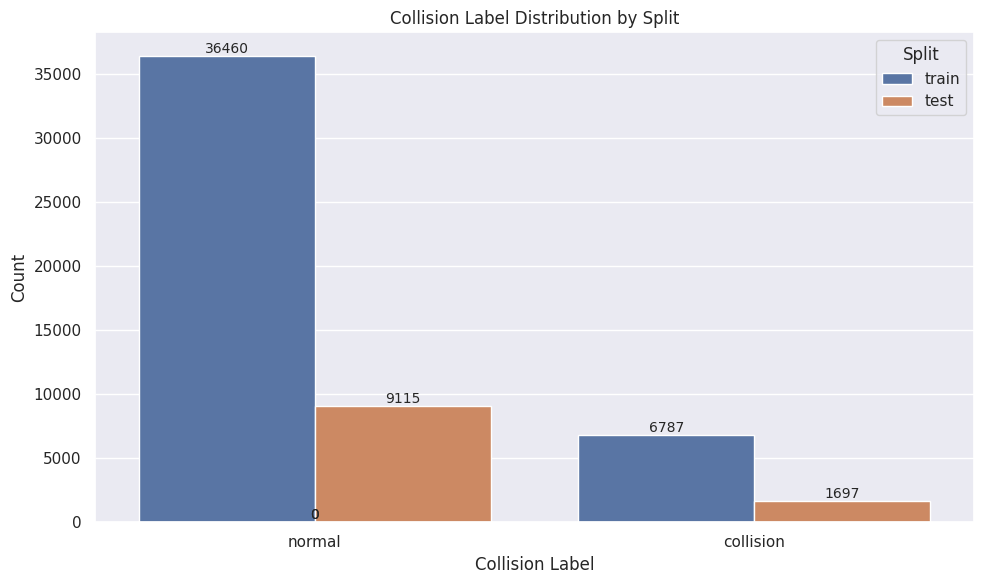

In [52]:
plot_collision_distribution_by_split(meta_df)

In [53]:
df_sensor.head()

,id,time,x,y,z
0,incident-0-19c58199-ada2-417e-b616-8e2389171bc6,1.633833e+09,0.022,1.033,-0.134
1,incident-0-19c58199-ada2-417e-b616-8e2389171bc6,1.633833e+09,0.022,1.033,-0.134
2,incident-0-19c58199-ada2-417e-b616-8e2389171bc6,1.633833e+09,0.024,1.033,-0.134
3,incident-0-19c58199-ada2-417e-b616-8e2389171bc6,1.633833e+09,0.022,1.035,-0.136
4,incident-0-19c58199-ada2-417e-b616-8e2389171bc6,1.633833e+09,0.020,1.035,-0.134


In [54]:
df_sensor.id.nunique()

54059

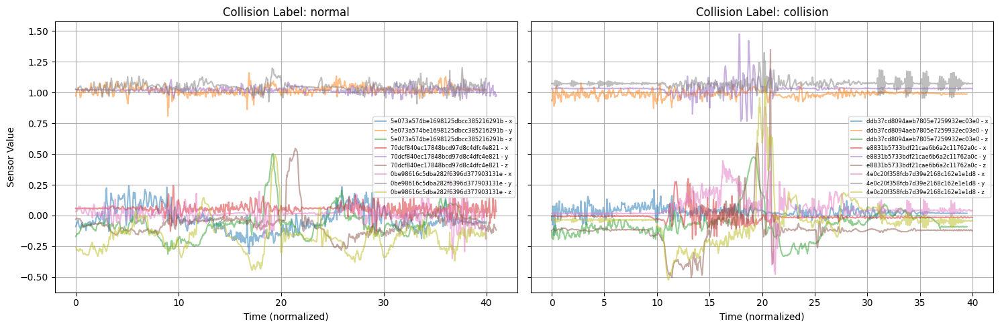

In [12]:
plot_time_series_by_collision_label(meta_df, df_sensor, n=3)

In [55]:
labels = meta_df[['id', 'collision_label']].set_index('id')
labels.head()

,collision_label
id,
5e073a574be1698125dbcc385216291b,normal
70dcf840ec17848bcd97d8c4dfc4e821,normal
0be98616c5dba282f6396d377903131e,normal
16bf060355d52988d4c2f59a3417fdd2,normal
19e853be42e7050786a5fb56cbcf2900,normal


In [66]:
labels.index[:10]

Index(['5e073a574be1698125dbcc385216291b', '70dcf840ec17848bcd97d8c4dfc4e821',
       '0be98616c5dba282f6396d377903131e', '16bf060355d52988d4c2f59a3417fdd2',
       '19e853be42e7050786a5fb56cbcf2900', '7a10af87c7f8523a9ffa68bcea68854e',
       'dd8c7ddd37ac435d190b9b7824a062a5',
       '47ff0edc-33b3-4432-90c4-f77efb029fe1',
       '6202ff75-45a4-4cf2-bb5a-1a5704e54e10',
       '874ddb36d43c469a9bef7f618fcd05ad'],
      dtype='object', name='id')

In [73]:
d = df_sensor.loc[df_sensor['id'].isin(labels.index[:100])]

In [74]:
%%time
features = extract_features(
    d,
    column_id="id",
    column_sort="time",
    impute_function=impute,
    disable_progressbar=False,
    n_jobs=10
)

features = features.merge(labels, left_index=True, right_index=True)

Feature Extraction: 100%|██████████| 50/50 [00:58<00:00,  1.17s/it]


CPU times: user 1.09 s, sys: 3.06 s, total: 4.15 s
Wall time: 1min 2s


In [75]:
62/100

0.62

In [64]:
features

,x__variance_larger_than_standard_deviation,x__has_duplicate_max,x__has_duplicate_min,x__has_duplicate,x__sum_values,x__abs_energy,x__mean_abs_change,x__mean_change,x__mean_second_derivative_central,x__median,...,z__fourier_entropy__bins_10,z__fourier_entropy__bins_100,z__permutation_entropy__dimension_3__tau_1,z__permutation_entropy__dimension_4__tau_1,z__permutation_entropy__dimension_5__tau_1,z__permutation_entropy__dimension_6__tau_1,z__permutation_entropy__dimension_7__tau_1,z__query_similarity_count__query_None__threshold_0.0,z__mean_n_absolute_max__number_of_maxima_7,collision_label
5e073a574be1698125dbcc385216291b,0.0,0.0,0.0,1.0,-31.554573,10.47352,0.022756,0.000038,0.0,-0.049863,...,0.245901,0.489533,1.705999,2.822933,4.06373,5.180323,5.896613,0.0,0.476981,normal


In [184]:
train_ids = pd.read_csv('df_train_collision.csv').id
test_ids = pd.read_csv('df_test_collision.csv').id
train_ids = train_ids[train_ids.isin(features.index)]
test_ids = test_ids[test_ids.isin(features.index)]
len(train_ids), len(test_ids)

(46901, 7147)

In [22]:
features.to_csv('extract_features_all.csv')

# Train Model IMU

In [110]:
features = pd.read_csv('extract_features_all.csv', index_col=[0])
df_audio = pd.concat([pd.read_csv('peak_audio_features_train.csv'), pd.read_csv('peak_audio_features_test.csv')]).drop('label',axis=1)
train_ids = pd.read_csv('df_train_collision.csv').id
test_ids = pd.read_csv('df_test_collision.csv').id
len(train_ids), len(test_ids)

(55693, 13923)

In [111]:
train_ids = train_ids[train_ids.isin(df_audio['video_id'])]
test_ids = test_ids[test_ids.isin(df_audio['video_id'])]
train_ids = train_ids[train_ids.isin(features.index)]
test_ids = test_ids[test_ids.isin(features.index)]
len(train_ids), len(test_ids)

(31581, 4928)

In [112]:
indexsplitter = IndexSplitter(
    split_sets = {
            Dataset.Train: train_ids, Dataset.Valid: test_ids
        }
)

data_manager = SupervisedTabularDataManager(
    data = features,
    target = 'collision_label',
    prediction_type = PredictionType.BinaryClassification,
    splitter = indexsplitter, 
)

In [113]:
data_manager.build_pipeline(
    remove_special_json_characters=False,
    step_params = {'encoding_dict': {'normal':0,'collision':1}},
    smote=False
)

Sklearn Pipeline:
MatchVariablesBefore (MatchVariables(missing_values='ignore')) ->
NanColumnDropper (NanColumnDropper()) ->
Infinity2Nan (Infinity2Nan()) ->
MinMaxScaler (MinMaxScalerWithColumnNames()) ->
AddMissingIndicator (AddMissingIndicator()) ->
NumericalImputer (MeanMedianImputer()) ->
MatchVariablesAfter (MatchVariables(missing_values='ignore'))

Target Pipeline:
LabelEncoder (DictLabelEncoder(encoding_dict={'collision': 1, 'normal': 0}))

In [114]:
X_train,y_train = data_manager.get_training_data()
X_train.shape

(31581, 2349)

In [115]:
X_val,y_val = data_manager.get_validation_data()
X_val.shape

(4928, 2349)

In [116]:
exp_mang = ExperimentManager(data_manager, optimize_metric = MetricName.AUC)

In [117]:
exp_mang.remove_models(['LightGBM', 'Support Vector Classifier','AdaBoost Classifier','Decision Tree','Gradient Boosting'])

,Name,Description,Source,Is Available
0,Random Forest,Default settings,Pool,True
1,Baseline Classification,Default settings,Pool,True
2,XGBoost,Default settings,Pool,True
3,Logistic Regression,Default settings,Pool,True
4,Support Vector Classifier,Default settings,Pool,False
5,Gradient Boosting,Default settings,Pool,False
6,AdaBoost Classifier,Default settings,Pool,False
7,Decision Tree,Default settings,Pool,False
8,LightGBM,Default settings,Pool,False


In [118]:
exp_mang.run_experiment(metrics_kwargs = {'pos_label': 1})

,Experiment ID,Experiment Description,Model,Model Description,Data Version,Data Description,Model Params,Metric Params,Accuracy,AUC,Recall,Precision,Balanced Accuracy,F1,Run Time
0,20250406165527_77e7,,Baseline Classification,Default settings,d49affcd,,"{'experiment_manager': Prediction Type: PredictionType.BinaryClassification, Metric: Metric: AUC. Description: , Random State: 0}",{'pos_label': 1},0.807630,0.504281,0.136259,0.093207,0.504281,0.110694,0:00:00
1,20250406165527_77e7,,Logistic Regression,Default settings,d49affcd,,"{'experiment_manager': Prediction Type: PredictionType.BinaryClassification, Metric: Metric: AUC. Description: , Random State: 0}",{'pos_label': 1},0.962662,0.837617,0.685912,0.860870,0.837617,0.763496,0:00:15
2,20250406165527_77e7,,Random Forest,Default settings,d49affcd,,"{'experiment_manager': Prediction Type: PredictionType.BinaryClassification, Metric: Metric: AUC. Description: , Random State: 0}",{'pos_label': 1},0.967127,0.846325,0.699769,0.904478,0.846325,0.789062,0:00:27
3,20250406165527_77e7,,XGBoost,Default settings,d49affcd,,"{'experiment_manager': Prediction Type: PredictionType.BinaryClassification, Metric: Metric: AUC. Description: , Random State: 0}",{'pos_label': 1},0.965909,0.851919,0.713626,0.875354,0.851919,0.786260,0:01:33


In [119]:
best_model = exp_mang.get_best_model()

In [120]:
best_model

Model: XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=-1, num_parallel_tree=None,
              predictor=None, random_state=42, ...), Description: Default settings

In [121]:
#best_model.export('best_model_imu_only.pkl')

In [122]:
# import pickle

# # Load pkl file
# with open("best_model_imu_only.pkl", "rb") as f:
#     best_model_imu = pickle.load(f)

In [123]:
interp = TabularInterpreterBinaryClassification(
    model = best_model,
    data_manager = data_manager,
    opt_metric = exp_mang.opt_metric,
    pos_class = {'pos_class' : 1},
    shap_timeout=300
)

 97%|=================== | 4798/4928 [00:21<00:00]         

In [125]:
fi = interp.get_feature_importance()

In [124]:
fi = fi.sort_values('feature_importance_vals', ascending=False)
fi.loc[fi['feature_importance_vals']>0.0]

,col_name,feature_importance_vals
0,x__fourier_entropy__bins_100,0.060646
1,x__approximate_entropy__m_2__r_0.9,0.045561
2,x__spkt_welch_density__coeff_2,0.042450
3,x__spkt_welch_density__coeff_8,0.035871
4,x__mean_n_absolute_max__number_of_maxima_7,0.033796
5,"z__change_quantiles__f_agg_""var""__isabs_True__qh_1.0__ql_0.8",0.030175
6,x__lempel_ziv_complexity__bins_10,0.028124
7,"y__agg_linear_trend__attr_""slope""__chunk_len_5__f_agg_""max""",0.027701
8,"z__agg_linear_trend__attr_""rvalue""__chunk_len_5__f_agg_""var""",0.027463
9,"z__agg_linear_trend__attr_""stderr""__chunk_len_5__f_agg_""var""",0.027061


In [32]:
meta_df = pd.read_csv('nvidia_delivery.csv')
meta_df.head()

,id,video_type,state,city,latitude,longitude,avg_speed,max_speed,course,timestamp_millis,...,g_min_y,g_max_y,g_std_y,g_amplitude_y,g_mean,g_median,g_min,g_max,g_std,g_amplitude
0,5e073a574be1698125dbcc385216291b,nv_near-collision_full_annotation,New York,Long Island City,40.770847,-73.876017,10.239510,11.348810,185.716108,1676696569000,...,0.031366,0.532561,0.070727,0.501195,0.155085,0.145984,0.031366,0.532561,0.070727,0.501195
1,70dcf840ec17848bcd97d8c4dfc4e821,nv_near-collision_full_annotation,New York,Long Island City,40.746643,-73.985862,5.895500,6.416000,208.941253,1667672323000,...,0.005301,0.552858,0.076974,0.547557,0.124326,0.105503,0.005301,0.552858,0.076974,0.547557
2,0be98616c5dba282f6396d377903131e,nv_near-collision_full_annotation,New Jersey,Weehawken,40.752043,-74.001003,1.897340,3.173140,28.692927,1675810750000,...,0.046587,0.518316,0.087512,0.471729,0.216355,0.192944,0.046587,0.518316,0.087512,0.471729
3,16bf060355d52988d4c2f59a3417fdd2,nv_near-collision_full_annotation,New York,Long Island City,40.750557,-73.974612,3.447648,5.501548,28.716207,1671048971000,...,0.007000,0.684904,0.115531,0.677904,0.094320,0.055283,0.007000,0.684904,0.115531,0.677904
4,19e853be42e7050786a5fb56cbcf2900,nv_near-collision_full_annotation,New York,Long Island City,40.753330,-73.972589,8.092189,9.413889,28.862905,1662682133000,...,0.132909,0.992395,0.102808,0.859486,0.271950,0.250495,0.132909,0.992395,0.102808,0.859486


In [100]:
X, y = data_manager.get_validation_data()

y_pred = best_model_imu.model.predict(X)
y_prod = best_model_imu.model.predict_proba(X)

preds = pd.DataFrame({
    'id': X.index,
    'y_pred': y_pred,
    'y_true': y,
    'y_prob_0': y_prod[:, 0],
    'y_prob_1': y_prod[:, 1]
})

preds = preds.merge(meta_df[['id', 'g_max']], on='id', how='left')
preds.head()

,id,y_pred,y_true,y_prob_0,y_prob_1,g_max
0,6a08ff3918e6118930d4cfc92af29b40,0,0,0.995506,0.004494,0.544604
1,6e35f6a3af98736625def05e41613587,0,0,0.999166,0.000834,0.990723
2,7b26e7daa15b5c7088369d39c5f09026,0,0,0.999947,0.000053,0.910070
3,5d603c7fedaa293fba02ac9e16c4cbfa,0,0,0.890126,0.109874,1.144686
4,178968770e47cf68437d2afbcfd2f89c,0,0,0.999891,0.000109,0.789226



=== Analyzing Segment: g_max < 1.0 ===
Segment size: 3965 samples


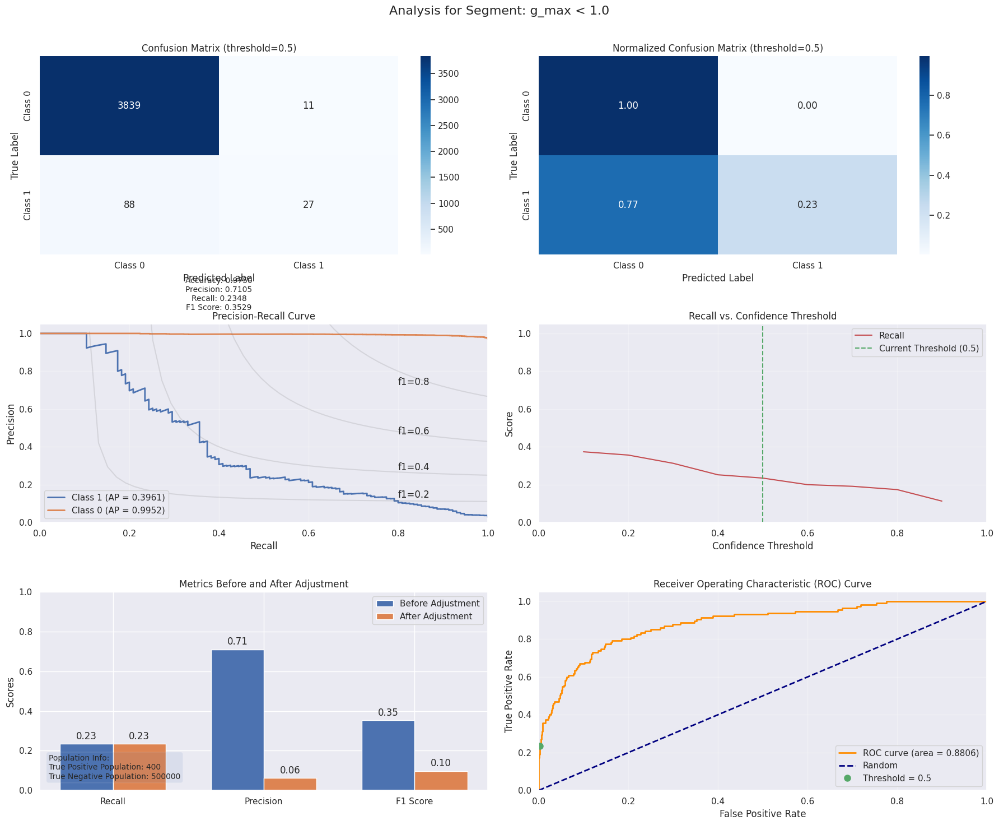


Segment: g_max < 1.0
True Positive Population: 400
True Negative Population: 500000
Samples: 3965
TN: 3839
FP: 11
FN: 88
TP: 27
Recall: 0.2348
Precision: 0.7105
F1: 0.3529
ROC_AUC: 0.8806
Precision_adj: 0.0617
F1_adj: 0.0977
Pop_TP: 400
Pop_TN: 500000

=== Analyzing Segment: 1.0 ≤ g_max < 1.4 ===
Segment size: 587 samples


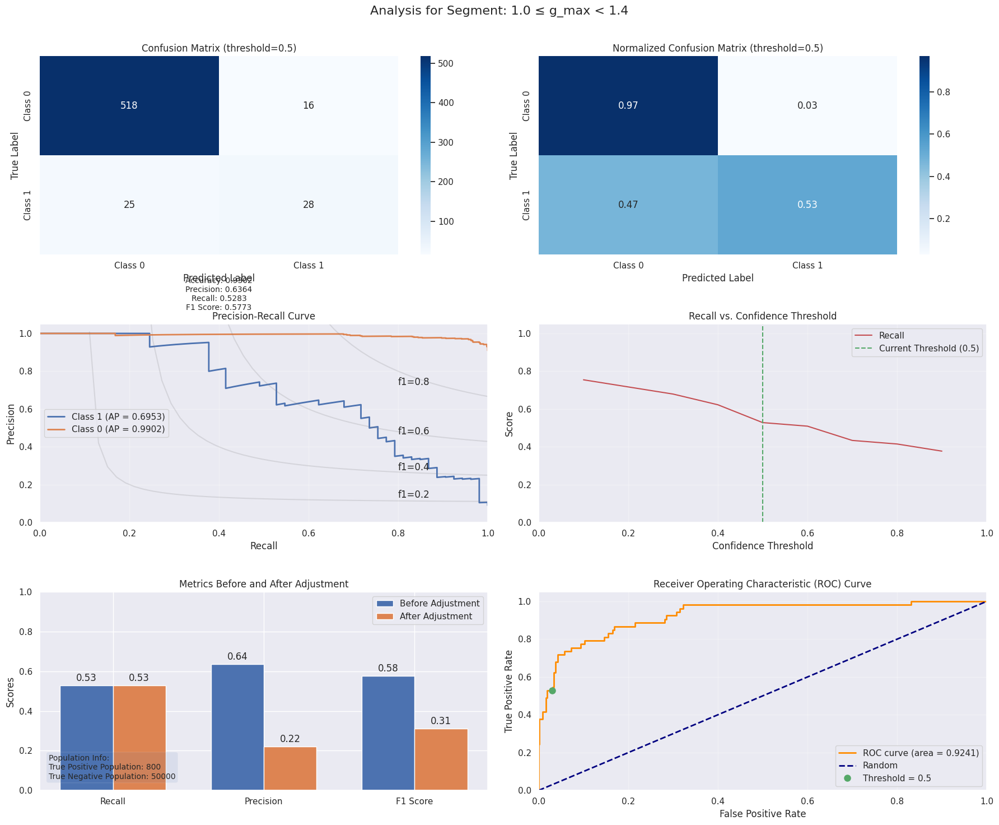


Segment: 1.0 ≤ g_max < 1.4
True Positive Population: 800
True Negative Population: 50000
Samples: 587
TN: 518
FP: 16
FN: 25
TP: 28
Recall: 0.5283
Precision: 0.6364
F1: 0.5773
ROC_AUC: 0.9241
Precision_adj: 0.2200
F1_adj: 0.3107
Pop_TP: 800
Pop_TN: 50000

=== Analyzing Segment: g_max ≥ 1.4 ===
Segment size: 376 samples


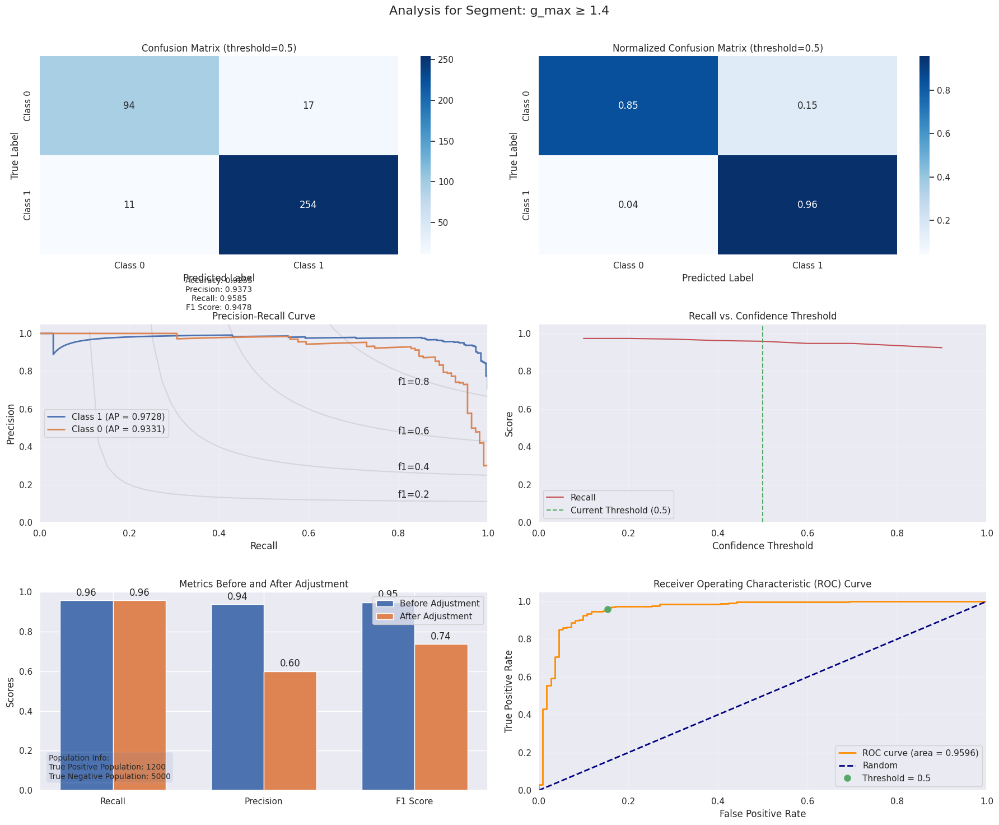


Segment: g_max ≥ 1.4
True Positive Population: 1200
True Negative Population: 5000
Samples: 376
TN: 94
FP: 17
FN: 11
TP: 254
Recall: 0.9585
Precision: 0.9373
F1: 0.9478
ROC_AUC: 0.9596
Precision_adj: 0.6003
F1_adj: 0.7383
Pop_TP: 1200
Pop_TN: 5000


In [101]:
analyzer_imu = SegmentAnalyzer(preds, 'g_max')
analyzer_imu.add_segment(None, 1.0, true_pos_population=400, true_neg_population=500000)
analyzer_imu.add_segment(1.0, 1.4, true_pos_population=800, true_neg_population=50000)
analyzer_imu.add_segment(1.4, None, true_pos_population=1200, true_neg_population=5000)
results = analyzer_imu.analyze(y_true_col='y_true', y_prob_cols=['y_prob_0', 'y_prob_1'])
summary_df = analyzer_imu.summary()

In [102]:
summary_df

,Segment,Samples,TN,FP,FN,TP,Recall,Precision,F1,ROC_AUC,Precision_adj,F1_adj,Pop_TP,Pop_TN
0,g_max < 1.0,3965,3839,11,88,27,0.234783,0.710526,0.352941,0.880603,0.061684,0.097700,400,500000
1,1.0 ≤ g_max < 1.4,587,518,16,25,28,0.528302,0.636364,0.577320,0.924140,0.220038,0.310678,800,50000
2,g_max ≥ 1.4,376,94,17,11,254,0.958491,0.937269,0.947761,0.959578,0.600322,0.738258,1200,5000


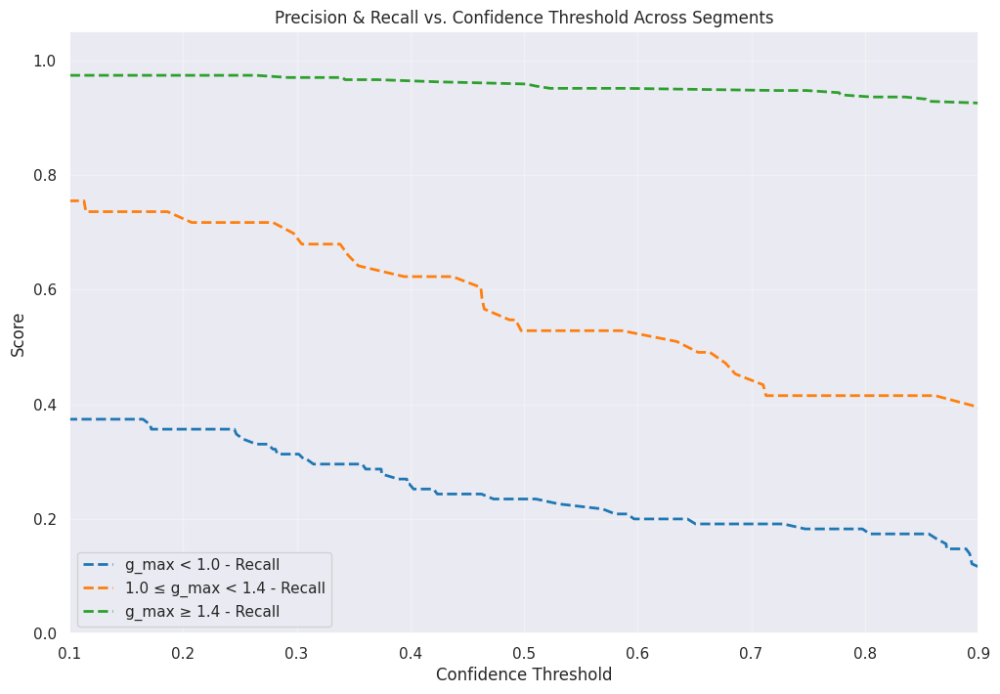

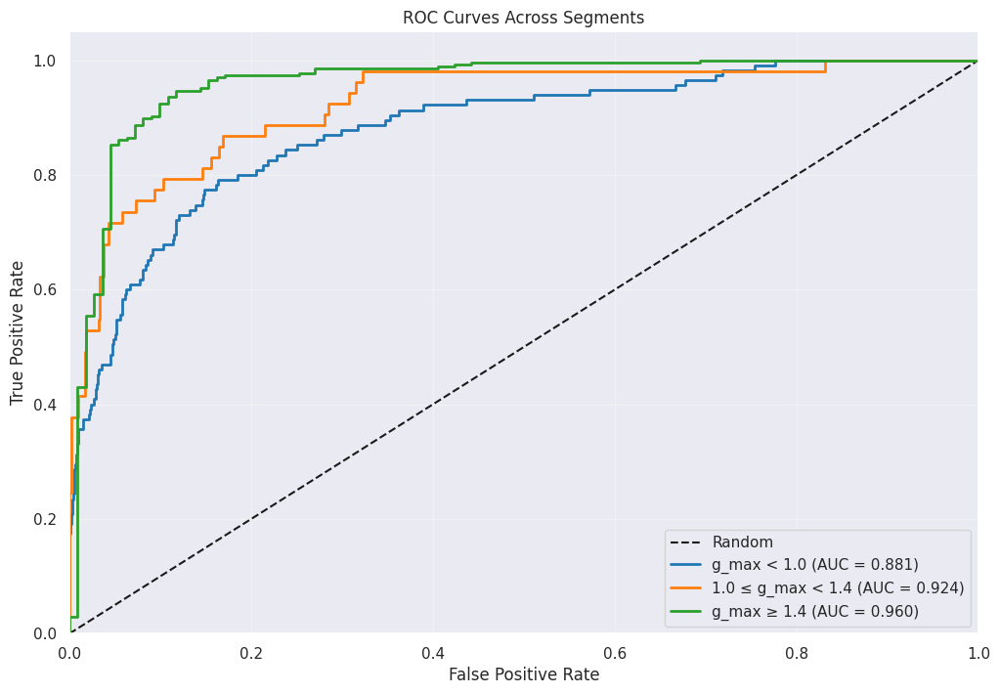

In [104]:
metrics_fig, pop_fig, data_point_imu = analyzer_imu.plot_segment_comparisons(
    y_true_col='y_true',
    y_prob_cols=['y_prob_0', 'y_prob_1'],
    metric_type='recall'
)

# Train Audio 

In [29]:
df_audio = pd.concat([pd.read_csv('peak_audio_features_train.csv'), pd.read_csv('peak_audio_features_test.csv')]).set_index('video_id')
df_audio.head()

,label,peak_score,peak_time,mfcc_0,mfcc_1,mfcc_2,mfcc_3,mfcc_4,mfcc_5,mfcc_6,...,mfcc_16,mfcc_17,mfcc_18,mfcc_19,mfcc_20,mfcc_21,mfcc_22,mfcc_23,mfcc_24,mfcc_25
video_id,,,,,,,,,,,,,,,,,,,,,
367891ae6af8b24f1bfb8e96ca35d9a1,0,0.441727,3.5,-343.58260,197.390470,-19.490360,50.986347,11.965891,7.569995,30.386732,...,8.607631,8.639522,7.143905,6.556616,7.330706,8.263148,4.119110,4.448355,4.080565,5.918246
937208edd45511ca256f5d4dc3351263,0,0.550961,6.0,-330.80490,128.400310,33.331810,24.615595,32.670550,20.528950,16.334747,...,3.796680,5.945155,5.643942,4.687701,3.395254,3.721667,4.263657,5.730717,3.231461,4.126030
7f1aed3ab04eeba8de79ee2ff22d8c15,0,0.357839,2.5,-312.00336,191.771640,5.177242,45.191963,24.067986,11.284945,33.438942,...,6.461418,4.237480,3.564466,5.162788,2.527646,4.623303,2.166859,3.754076,3.668180,3.690948
06d514b16995ac9abc2b931b7ec8a001,0,0.420454,6.0,-225.10440,24.061531,-51.257584,-8.542057,-20.967262,10.665850,-2.895970,...,7.368121,6.447991,6.530146,8.719337,5.405024,4.476828,9.261132,5.169406,7.666062,4.159723
0ffccb09edfa12b1dd4d5d910324f1f8,0,0.388285,6.0,-279.26215,190.128300,-26.101332,57.418625,11.839854,8.999070,33.438430,...,10.101876,11.988842,5.414701,6.020075,4.017281,8.210844,5.137022,4.896503,5.781711,4.242820


In [30]:
train_ids = pd.read_csv('df_train_collision.csv').id
test_ids = pd.read_csv('df_test_collision.csv').id
train_ids = train_ids[train_ids.isin(df_audio.index)]
test_ids = test_ids[test_ids.isin(df_audio.index)]
len(train_ids), len(test_ids)

(37638, 9325)

,Experiment ID,Experiment Description,Model,Model Description,Data Version,Data Description,Model Params,Metric Params,Accuracy,AUC,Recall,Precision,Balanced Accuracy,F1,Run Time
0,20250331063733_3e19,,Baseline Classification,Default settings,2ffe5cca,,"{'experiment_manager': Prediction Type: PredictionType.BinaryClassification, Metric: Metric: AUC. Description: , Random State: 0}",{'pos_label': 1},0.748204,0.501947,0.151734,0.151734,0.501947,0.151734,0:00:00
1,20250331063733_3e19,,Logistic Regression,Default settings,2ffe5cca,,"{'experiment_manager': Prediction Type: PredictionType.BinaryClassification, Metric: Metric: AUC. Description: , Random State: 0}",{'pos_label': 1},0.923217,0.798604,0.621387,0.817490,0.798604,0.706076,0:00:05
2,20250331063733_3e19,,Random Forest,Default settings,2ffe5cca,,"{'experiment_manager': Prediction Type: PredictionType.BinaryClassification, Metric: Metric: AUC. Description: , Random State: 0}",{'pos_label': 1},0.929330,0.790559,0.593208,0.895311,0.790559,0.713603,0:00:01
3,20250331063733_3e19,,XGBoost,Default settings,2ffe5cca,,"{'experiment_manager': Prediction Type: PredictionType.BinaryClassification, Metric: Metric: AUC. Description: , Random State: 0}",{'pos_label': 1},0.927292,0.798312,0.614884,0.854418,0.798312,0.715126,0:00:01



=== Analyzing Segment: g_max < 1.0 ===
Segment size: 3965 samples


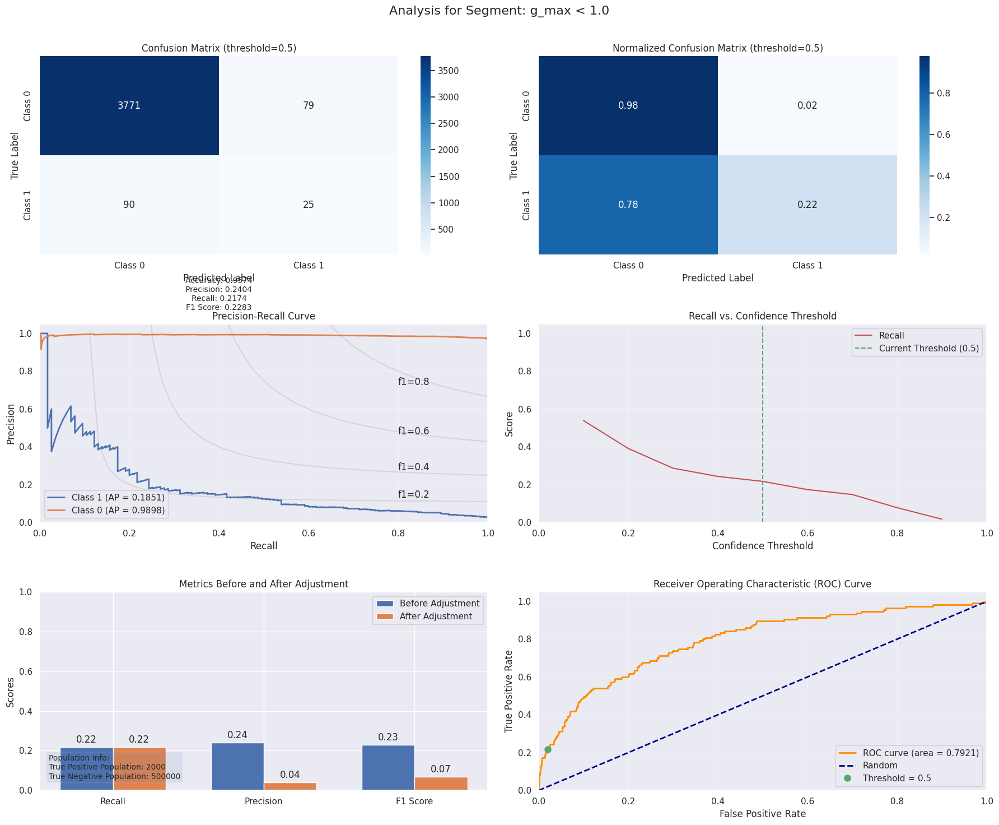


Segment: g_max < 1.0
True Positive Population: 2000
True Negative Population: 500000
Samples: 3965
TN: 3771
FP: 79
FN: 90
TP: 25
Recall: 0.2174
Precision: 0.2404
F1: 0.2283
ROC_AUC: 0.7921
Precision_adj: 0.0407
F1_adj: 0.0685
Pop_TP: 2000
Pop_TN: 500000

=== Analyzing Segment: 1.0 ≤ g_max < 1.4 ===
Segment size: 587 samples


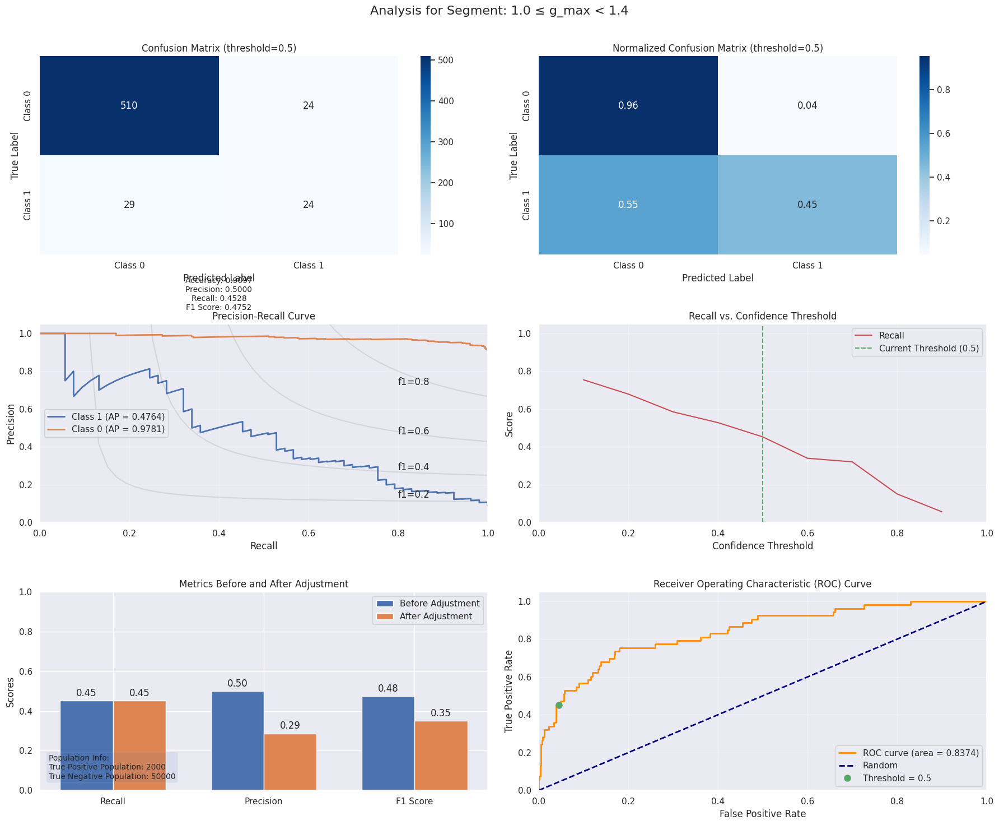


Segment: 1.0 ≤ g_max < 1.4
True Positive Population: 2000
True Negative Population: 50000
Samples: 587
TN: 510
FP: 24
FN: 29
TP: 24
Recall: 0.4528
Precision: 0.5000
F1: 0.4752
ROC_AUC: 0.8374
Precision_adj: 0.2873
F1_adj: 0.3515
Pop_TP: 2000
Pop_TN: 50000

=== Analyzing Segment: g_max ≥ 1.4 ===
Segment size: 376 samples


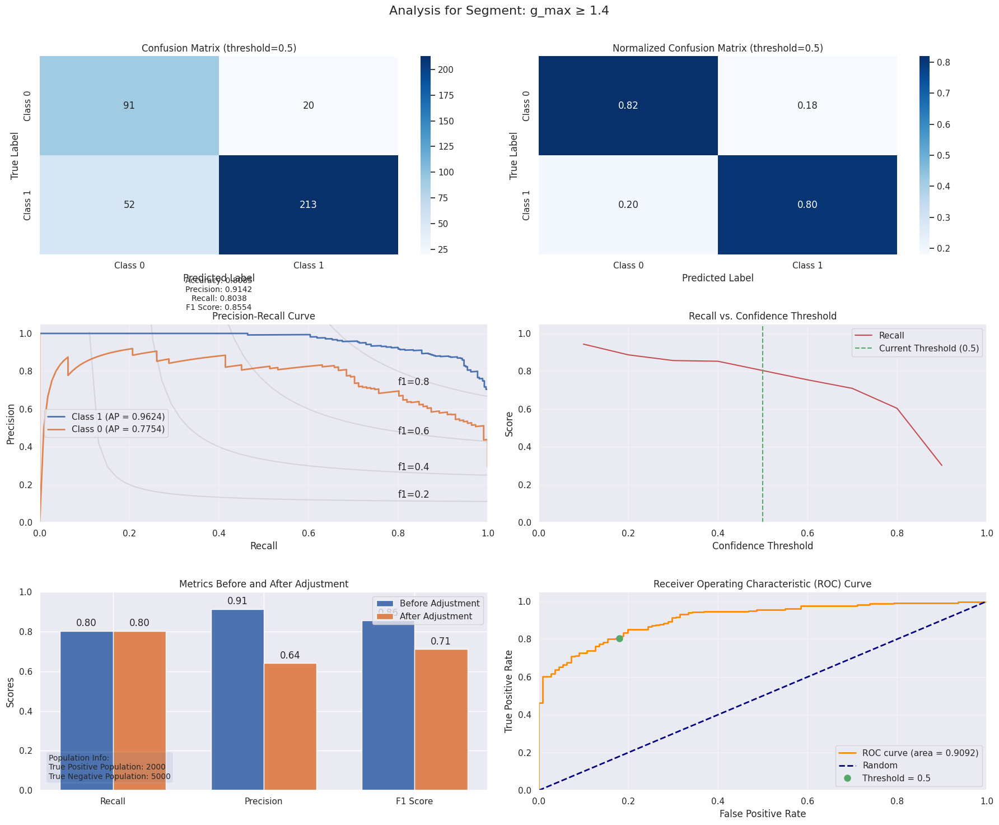


Segment: g_max ≥ 1.4
True Positive Population: 2000
True Negative Population: 5000
Samples: 376
TN: 91
FP: 20
FN: 52
TP: 213
Recall: 0.8038
Precision: 0.9142
F1: 0.8554
ROC_AUC: 0.9092
Precision_adj: 0.6409
F1_adj: 0.7131
Pop_TP: 2000
Pop_TN: 5000


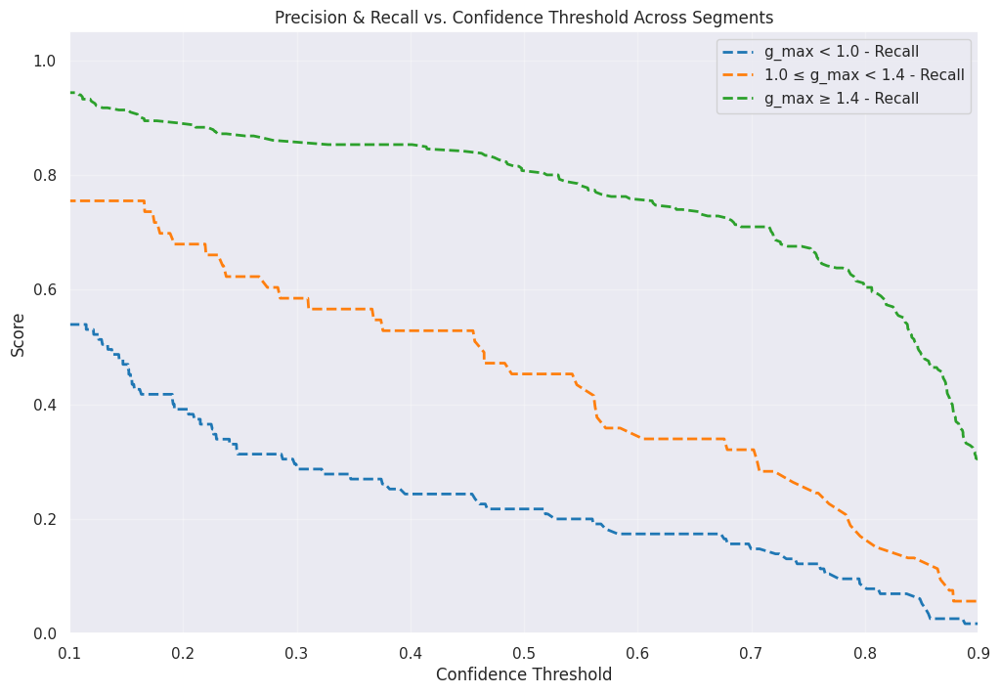

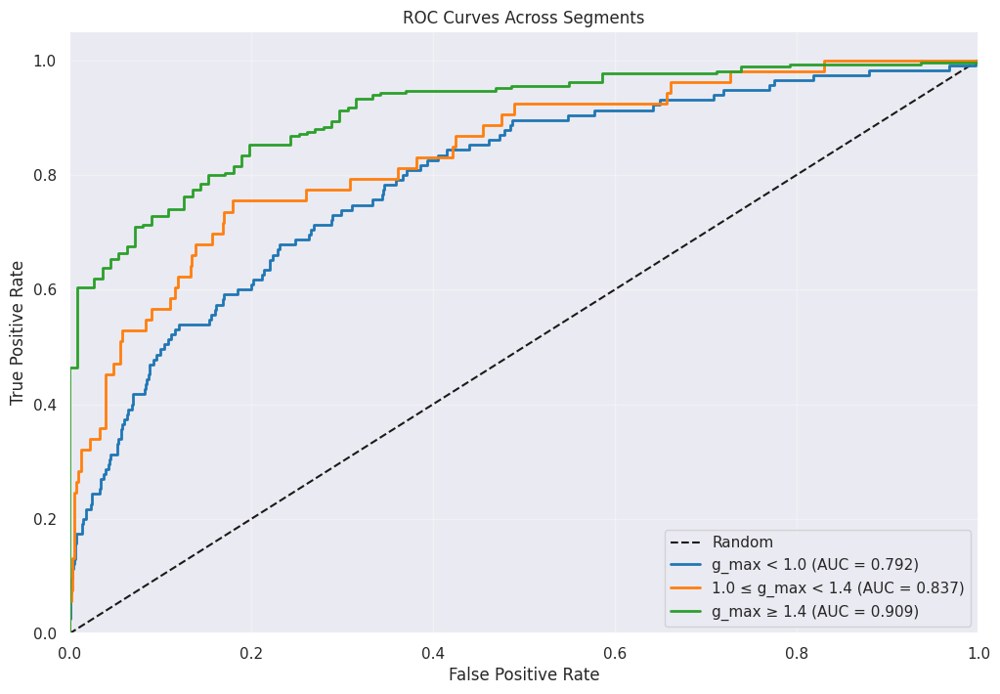

In [31]:
from simpml.tabular.all import *

indexsplitter = IndexSplitter(
    split_sets = {
            Dataset.Train: train_ids, Dataset.Valid: test_ids
        }
)

data_manager = SupervisedTabularDataManager(
    data = df_audio,
    target = 'label',
    prediction_type = PredictionType.BinaryClassification,
    splitter = indexsplitter
)


data_manager.build_pipeline(
    remove_special_json_characters=False,
    smote=False
)

exp_mang = ExperimentManager(data_manager, optimize_metric = MetricName.AUC)
exp_mang.remove_models(['LightGBM', 'Support Vector Classifier','AdaBoost Classifier','Decision Tree','Gradient Boosting'])
exp_mang.run_experiment(metrics_kwargs = {'pos_label': 1})

best_model = exp_mang.get_best_model()
best_model.export('best_model_audio.pkl')

X, y = data_manager.get_validation_data()

y_pred = best_model.model.predict(X)
y_prob = best_model.model.predict_proba(X)

preds = pd.DataFrame({
    'id': X.index,
    'y_pred': y_pred,
    'y_true': y,
    'y_prob_0': y_prob[:, 0],
    'y_prob_1': y_prob[:, 1]
})

preds = preds.merge(meta_df[['id', 'g_max']], on='id', how='left')

analyzer = SegmentAnalyzer(preds, 'g_max')
analyzer.add_segment(None, 1.0, true_pos_population=2000, true_neg_population=500000)
analyzer.add_segment(1.0, 1.4, true_pos_population=2000, true_neg_population=50000)
analyzer.add_segment(1.4, None, true_pos_population=2000, true_neg_population=5000)
results = analyzer.analyze(y_true_col='y_true', y_prob_cols=['y_prob_0', 'y_prob_1'])
summary_df = analyzer.summary()

metrics_fig, pop_fig, data_points = analyzer.plot_segment_comparisons(
    y_true_col='y_true',
    y_prob_cols=['y_prob_0', 'y_prob_1'],
    metric_type='recall'
)

# Train IMU + Audio

In [22]:
df_audio = pd.concat([pd.read_csv('peak_audio_features_train.csv'), pd.read_csv('peak_audio_features_test.csv')]).drop('label',axis=1)
df_audio.head()

,peak_score,peak_time,mfcc_0,mfcc_1,mfcc_2,mfcc_3,mfcc_4,mfcc_5,mfcc_6,mfcc_7,...,mfcc_16,mfcc_17,mfcc_18,mfcc_19,mfcc_20,mfcc_21,mfcc_22,mfcc_23,mfcc_24,mfcc_25
video_id,,,,,,,,,,,,,,,,,,,,,
367891ae6af8b24f1bfb8e96ca35d9a1,0.441727,3.5,-343.58260,197.390470,-19.490360,50.986347,11.965891,7.569995,30.386732,1.850265,...,8.607631,8.639522,7.143905,6.556616,7.330706,8.263148,4.119110,4.448355,4.080565,5.918246
937208edd45511ca256f5d4dc3351263,0.550961,6.0,-330.80490,128.400310,33.331810,24.615595,32.670550,20.528950,16.334747,15.476773,...,3.796680,5.945155,5.643942,4.687701,3.395254,3.721667,4.263657,5.730717,3.231461,4.126030
7f1aed3ab04eeba8de79ee2ff22d8c15,0.357839,2.5,-312.00336,191.771640,5.177242,45.191963,24.067986,11.284945,33.438942,15.550726,...,6.461418,4.237480,3.564466,5.162788,2.527646,4.623303,2.166859,3.754076,3.668180,3.690948
06d514b16995ac9abc2b931b7ec8a001,0.420454,6.0,-225.10440,24.061531,-51.257584,-8.542057,-20.967262,10.665850,-2.895970,3.567673,...,7.368121,6.447991,6.530146,8.719337,5.405024,4.476828,9.261132,5.169406,7.666062,4.159723
0ffccb09edfa12b1dd4d5d910324f1f8,0.388285,6.0,-279.26215,190.128300,-26.101332,57.418625,11.839854,8.999070,33.438430,-3.143236,...,10.101876,11.988842,5.414701,6.020075,4.017281,8.210844,5.137022,4.896503,5.781711,4.242820


In [72]:
df_features_with_audio = df_audio.merge(features.reset_index(), left_on="video_id", right_on="index", how="inner")
df_features_with_audio = df_features_with_audio.set_index('video_id').drop('index', axis=1)
df_features_with_audio.head()

,peak_score,peak_time,mfcc_0,mfcc_1,mfcc_2,mfcc_3,mfcc_4,mfcc_5,mfcc_6,mfcc_7,...,z__fourier_entropy__bins_10,z__fourier_entropy__bins_100,z__permutation_entropy__dimension_3__tau_1,z__permutation_entropy__dimension_4__tau_1,z__permutation_entropy__dimension_5__tau_1,z__permutation_entropy__dimension_6__tau_1,z__permutation_entropy__dimension_7__tau_1,z__query_similarity_count__query_None__threshold_0.0,z__mean_n_absolute_max__number_of_maxima_7,collision_label
video_id,,,,,,,,,,,,,,,,,,,,,
367891ae6af8b24f1bfb8e96ca35d9a1,0.441727,3.5,-343.58260,197.39047,-19.490360,50.986347,11.965891,7.569995,30.386732,1.850265,...,0.260704,0.890343,1.746162,2.935483,4.262229,5.487431,6.206823,0.0,0.497108,normal
937208edd45511ca256f5d4dc3351263,0.550961,6.0,-330.80490,128.40031,33.331810,24.615595,32.670550,20.528950,16.334747,15.476773,...,0.260704,0.512138,1.626209,2.616283,3.766742,4.814379,5.538534,0.0,0.569120,normal
7f1aed3ab04eeba8de79ee2ff22d8c15,0.357839,2.5,-312.00336,191.77164,5.177242,45.191963,24.067986,11.284945,33.438942,15.550726,...,0.200814,0.812632,1.716523,2.914953,4.305156,5.608641,6.476660,0.0,0.657746,normal
0ffccb09edfa12b1dd4d5d910324f1f8,0.388285,6.0,-279.26215,190.12830,-26.101332,57.418625,11.839854,8.999070,33.438430,-3.143236,...,0.260704,0.698539,1.535722,2.491592,3.630413,4.646145,5.476823,0.0,0.731370,normal
547a9d69d1e251d2bcc74b164b18b33e,0.381722,0.5,-262.43878,164.61203,35.562640,27.613102,-7.194649,11.934116,25.803160,-5.770697,...,0.215617,0.433549,1.732690,2.973563,4.352403,5.607504,6.339373,0.0,0.693735,normal


In [73]:
df_features_with_audio.shape

(36509, 2378)

In [74]:
train_ids = pd.read_csv('df_train_collision.csv').id
test_ids = pd.read_csv('df_test_collision.csv').id
train_ids = train_ids[train_ids.isin(df_features_with_audio.index)]
test_ids = test_ids[test_ids.isin(df_features_with_audio.index)]
len(train_ids), len(test_ids)

(31581, 4928)

In [77]:
from simpml.tabular.all import *

indexsplitter = IndexSplitter(
    split_sets = {
            Dataset.Train: train_ids, Dataset.Valid: test_ids
        }
)

data_manager = SupervisedTabularDataManager(
    data = df_features_with_audio,
    target = 'collision_label',
    prediction_type = PredictionType.BinaryClassification,
    splitter = indexsplitter
)


data_manager.build_pipeline(
    remove_special_json_characters=False,
    step_params = {'encoding_dict': {'normal':0,'collision':1}},
    smote=False
)

Sklearn Pipeline:
MatchVariablesBefore (MatchVariables(missing_values='ignore')) ->
NanColumnDropper (NanColumnDropper()) ->
Infinity2Nan (Infinity2Nan()) ->
MinMaxScaler (MinMaxScalerWithColumnNames()) ->
AddMissingIndicator (AddMissingIndicator()) ->
NumericalImputer (MeanMedianImputer()) ->
MatchVariablesAfter (MatchVariables(missing_values='ignore'))

Target Pipeline:
LabelEncoder (DictLabelEncoder(encoding_dict={'collision': 1, 'normal': 0}))

In [147]:
exp_mang = ExperimentManager(data_manager, optimize_metric = MetricName.AUC)
exp_mang.remove_models(['LightGBM', 'Support Vector Classifier','AdaBoost Classifier','Decision Tree','Gradient Boosting'])
exp_mang.run_experiment(metrics_kwargs = {'pos_label': 1})

,Experiment ID,Experiment Description,Model,Model Description,Data Version,Data Description,Model Params,Metric Params,Accuracy,AUC,Recall,Precision,Balanced Accuracy,F1,Run Time
0,20250330125236_90c3,,Baseline Classification,Default settings,f511f37e,,"{'experiment_manager': Prediction Type: PredictionType.BinaryClassification, Metric: Metric: AUC. Description: , Random State: 0}",{'pos_label': 1},0.795657,0.506066,0.154734,0.094633,0.506066,0.117441,0:00:43
1,20250330125236_90c3,,Logistic Regression,Default settings,f511f37e,,"{'experiment_manager': Prediction Type: PredictionType.BinaryClassification, Metric: Metric: AUC. Description: , Random State: 0}",{'pos_label': 1},0.965300,0.858889,0.729792,0.854054,0.858889,0.787049,0:00:25
2,20250330125236_90c3,,Random Forest,Default settings,f511f37e,,"{'experiment_manager': Prediction Type: PredictionType.BinaryClassification, Metric: Metric: AUC. Description: , Random State: 0}",{'pos_label': 1},0.967735,0.847702,0.702079,0.910180,0.847702,0.792699,0:00:37
3,20250330125236_90c3,,XGBoost,Default settings,f511f37e,,"{'experiment_manager': Prediction Type: PredictionType.BinaryClassification, Metric: Metric: AUC. Description: , Random State: 0}",{'pos_label': 1},0.968953,0.866109,0.741339,0.886740,0.866109,0.807547,0:02:38


In [148]:
best_model = exp_mang.get_best_model()
best_model.export('best_model_imu_and_audio.pkl')

In [149]:
interp = TabularInterpreterBinaryClassification(
    model = best_model,
    data_manager = data_manager,
    opt_metric = exp_mang.opt_metric,
    pos_class = {'pos_class' : 1},
    shap_timeout=300
)
fi = interp.get_feature_importance()
fi = fi.sort_values('feature_importance_vals', ascending=False)
fi.loc[fi['feature_importance_vals']>0.001]

 98%|===================| 4814/4928 [00:30<00:00]          

,col_name,feature_importance_vals
0,peak_score,0.047396
1,x__spkt_welch_density__coeff_2,0.011212
2,"z__change_quantiles__f_agg_""var""__isabs_True__qh_1.0__ql_0.8",0.009545
3,z__lempel_ziv_complexity__bins_10,0.009078
4,x__fourier_entropy__bins_100,0.008439
...,...,...
233,"y__fft_coefficient__attr_""abs""__coeff_24",0.001006
234,"y__fft_coefficient__attr_""imag""__coeff_93",0.001003
235,y__ar_coefficient__coeff_10__k_10,0.001002
236,"x__fft_coefficient__attr_""abs""__coeff_18",0.001001


In [69]:
with open("best_model_imu_and_audio.pkl", "rb") as f:
    best_model = pickle.load(f)

In [79]:
X, y = data_manager.get_training_data()

In [80]:
X, y = data_manager.get_validation_data()

y_pred = best_model.model.predict(X)
y_prob = best_model.model.predict_proba(X)

preds = pd.DataFrame({
    'id': X.index,
    'y_pred': y_pred,
    'y_true': y,
    'y_prob_0': y_prob[:, 0],
    'y_prob_1': y_prob[:, 1]
})

preds = preds.merge(meta_df[['id', 'g_max']], on='id', how='left')
preds.head()

,id,y_pred,y_true,y_prob_0,y_prob_1,g_max
0,6a08ff3918e6118930d4cfc92af29b40,0,0,0.999538,0.000462,0.544604
1,6e35f6a3af98736625def05e41613587,0,0,0.999917,0.000083,0.990723
2,7b26e7daa15b5c7088369d39c5f09026,0,0,0.999955,0.000045,0.910070
3,5d603c7fedaa293fba02ac9e16c4cbfa,0,0,0.989532,0.010468,1.144686
4,178968770e47cf68437d2afbcfd2f89c,0,0,0.999934,0.000066,0.789226



=== Analyzing Segment: g_max < 1.0 ===
Segment size: 3965 samples


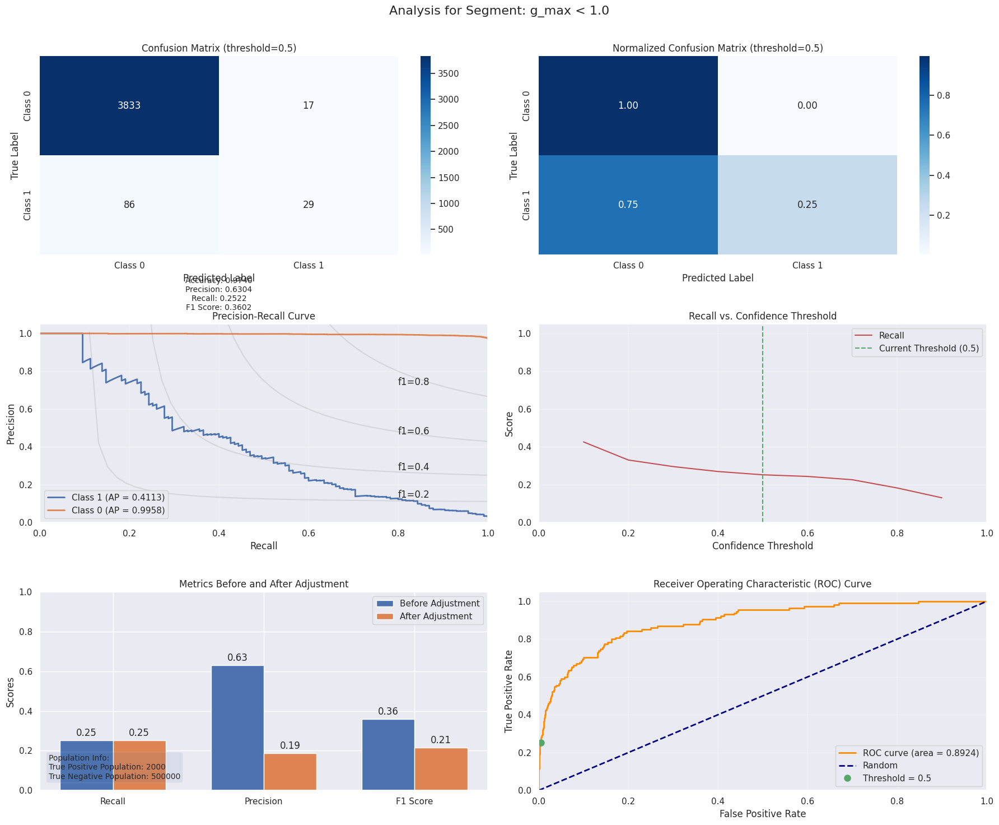


Segment: g_max < 1.0
True Positive Population: 2000
True Negative Population: 500000
Samples: 3965
TN: 3833
FP: 17
FN: 86
TP: 29
Recall: 0.2522
Precision: 0.6304
F1: 0.3602
ROC_AUC: 0.8924
Precision_adj: 0.1860
F1_adj: 0.2141
Pop_TP: 2000
Pop_TN: 500000

=== Analyzing Segment: 1.0 ≤ g_max < 1.4 ===
Segment size: 587 samples


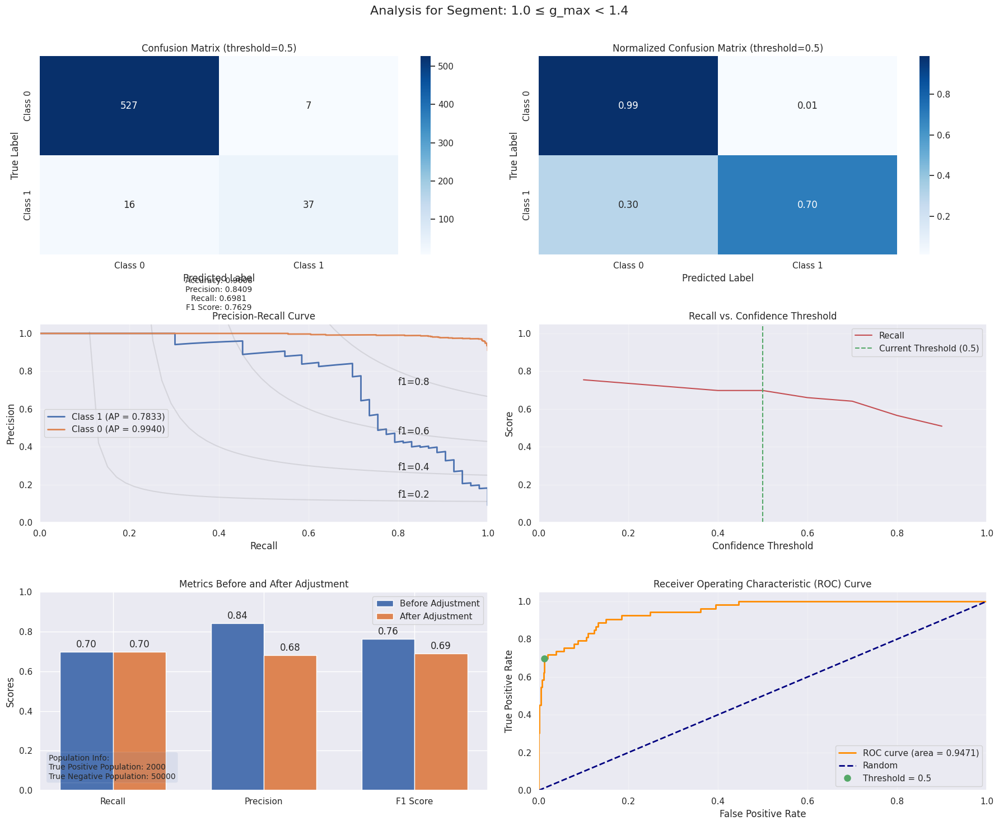


Segment: 1.0 ≤ g_max < 1.4
True Positive Population: 2000
True Negative Population: 50000
Samples: 587
TN: 527
FP: 7
FN: 16
TP: 37
Recall: 0.6981
Precision: 0.8409
F1: 0.7629
ROC_AUC: 0.9471
Precision_adj: 0.6805
F1_adj: 0.6892
Pop_TP: 2000
Pop_TN: 50000

=== Analyzing Segment: g_max ≥ 1.4 ===
Segment size: 376 samples


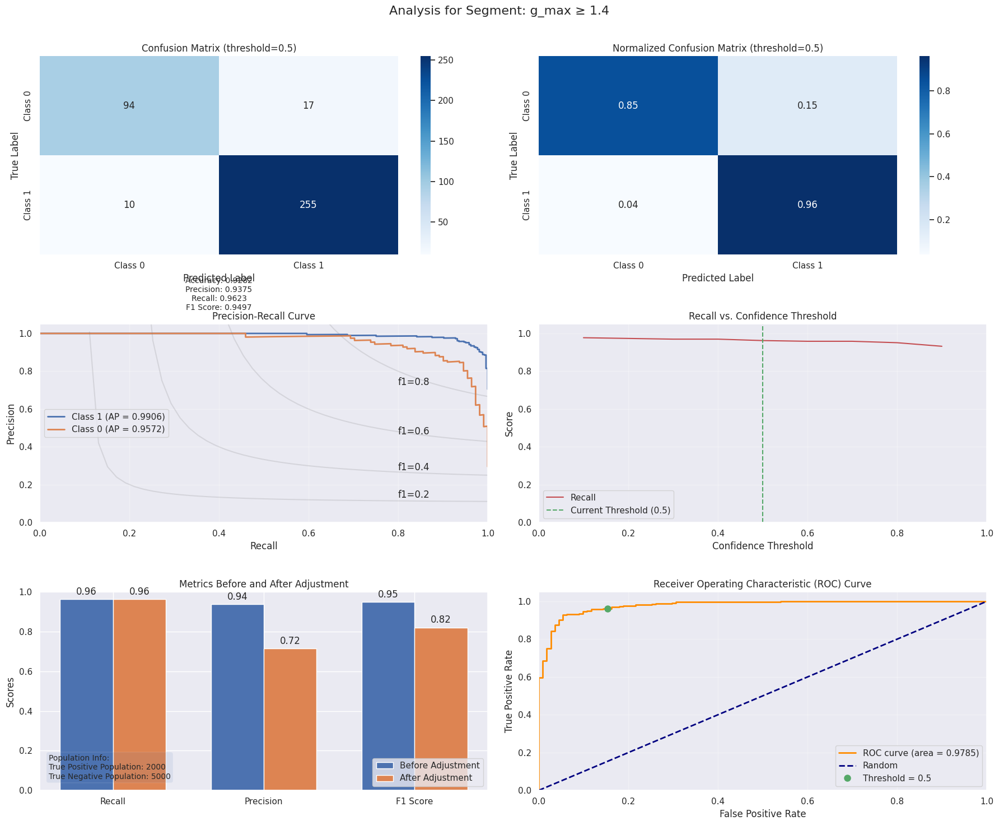


Segment: g_max ≥ 1.4
True Positive Population: 2000
True Negative Population: 5000
Samples: 376
TN: 94
FP: 17
FN: 10
TP: 255
Recall: 0.9623
Precision: 0.9375
F1: 0.9497
ROC_AUC: 0.9785
Precision_adj: 0.7154
F1_adj: 0.8206
Pop_TP: 2000
Pop_TN: 5000


In [85]:
analyzer = SegmentAnalyzer(preds, 'g_max')
analyzer.add_segment(None, 1.0, true_pos_population=2000, true_neg_population=500000)
analyzer.add_segment(1.0, 1.4, true_pos_population=2000, true_neg_population=50000)
analyzer.add_segment(1.4, None, true_pos_population=2000, true_neg_population=5000)
results = analyzer.analyze(y_true_col='y_true', y_prob_cols=['y_prob_0', 'y_prob_1'])
summary_df = analyzer.summary()

In [86]:
summary_df

,Segment,Samples,TN,FP,FN,TP,Recall,Precision,F1,ROC_AUC,Precision_adj,F1_adj,Pop_TP,Pop_TN
0,g_max < 1.0,3965,3833,17,86,29,0.252174,0.630435,0.360248,0.892420,0.185959,0.214063,2000,500000
1,1.0 ≤ g_max < 1.4,587,527,7,16,37,0.698113,0.840909,0.762887,0.947106,0.680536,0.689213,2000,50000
2,g_max ≥ 1.4,376,94,17,10,255,0.962264,0.937500,0.949721,0.978514,0.715360,0.820643,2000,5000


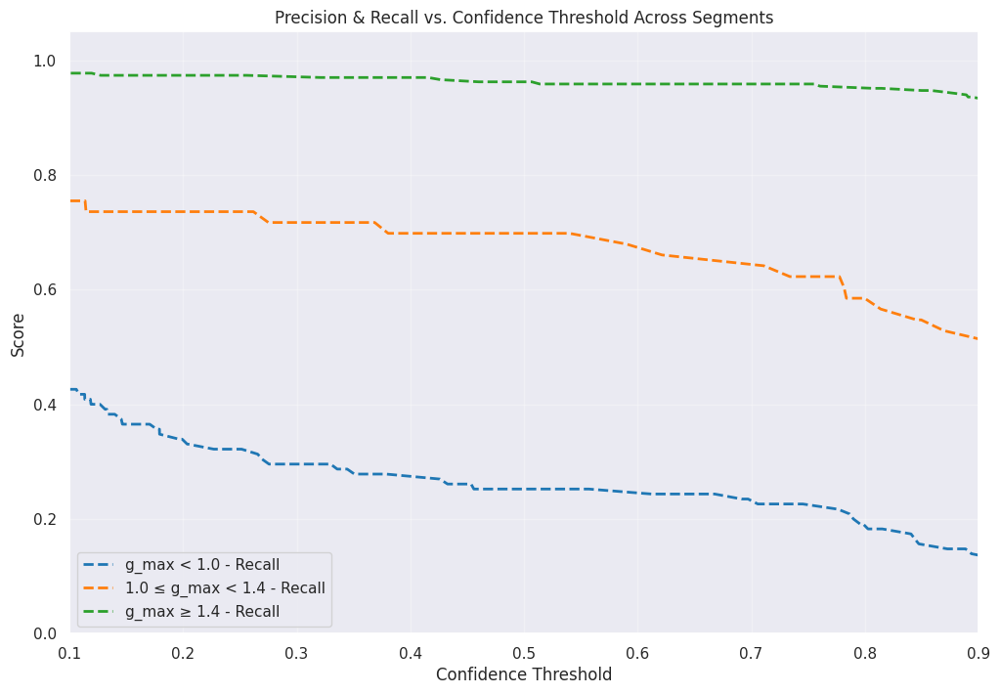

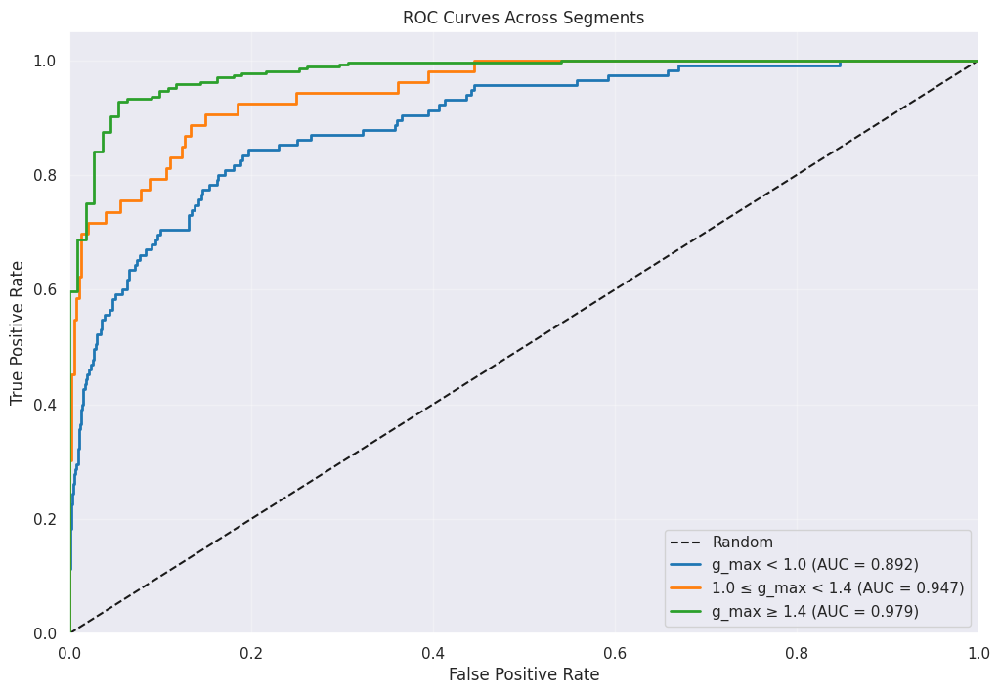

In [88]:
metrics_fig, pop_fig, data_points = analyzer.plot_segment_comparisons(
    y_true_col='y_true',
    y_prob_cols=['y_prob_0', 'y_prob_1'],
    metric_type='recall'
)

In [90]:
data_points.keys()

dict_keys(['g_max < 1.0_recall', 'g_max < 1.0_roc', '1.0 ≤ g_max < 1.4_recall', '1.0 ≤ g_max < 1.4_roc', 'g_max ≥ 1.4_recall', 'g_max ≥ 1.4_roc'])

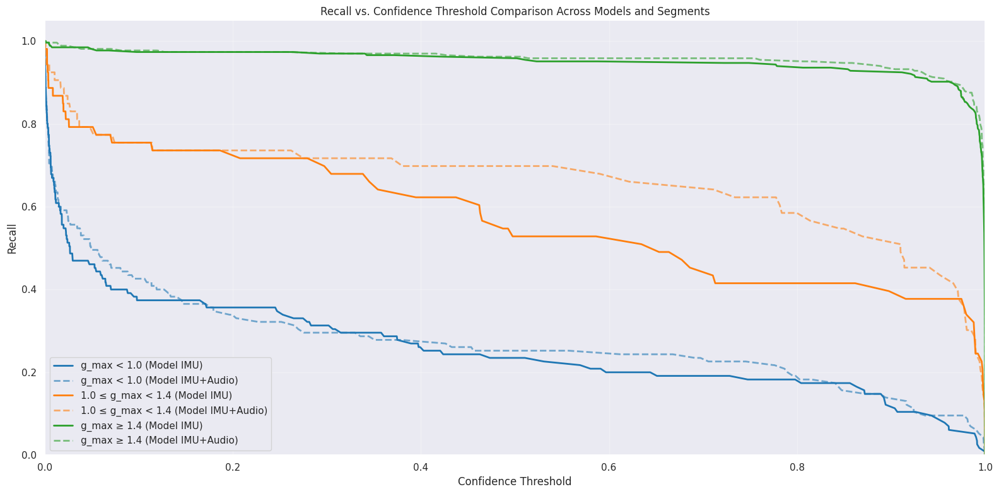

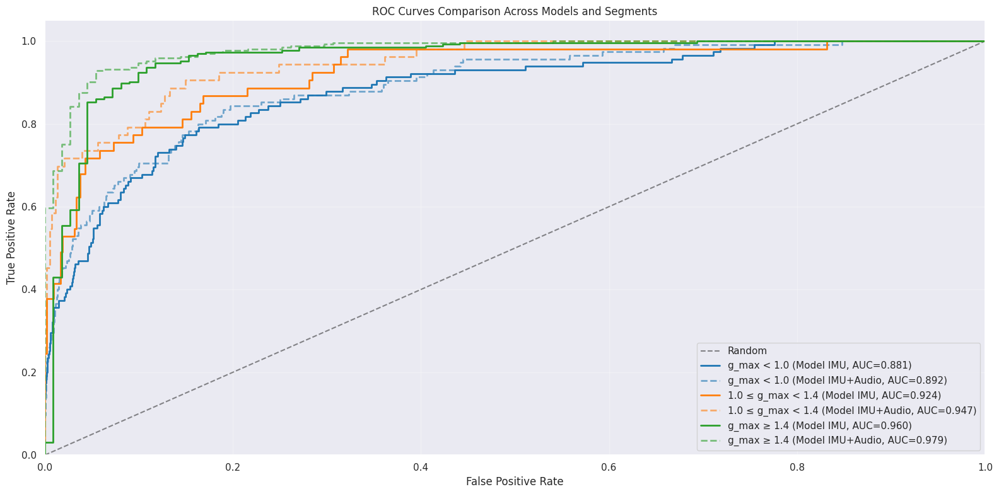

In [106]:
def compare_model_curves(data_points_dict, segment_names=None, figsize=(16, 8)):
    """
    Compare ROC and Recall curves for different models across segments.
    
    Parameters:
    -----------
    data_points_dict : dict
        Dictionary where keys are model names and values are data_points dictionaries
        with keys like '{segment_name}_{curve_type}' (e.g., 'g_max < 1.0_recall')
    segment_names : list, optional
        List of segment names to include in the comparison (if None, all segments are used)
    figsize : tuple, optional
        Figure size for the plots
        
    Returns:
    --------
    tuple: (fig_recall, fig_roc)
        Figures for recall curves and ROC curves comparison
    """
    import matplotlib.pyplot as plt
    import numpy as np
    from matplotlib.colors import to_rgba
    
    # Extract unique segment names from the keys
    all_segments = set()
    for model_name, data_points in data_points_dict.items():
        for key in data_points.keys():
            if '_recall' in key:
                segment = key.replace('_recall', '')
                all_segments.add(segment)
            elif '_roc' in key:
                segment = key.replace('_roc', '')
                all_segments.add(segment)
    
    # Filter segments if specified
    segments_to_use = segment_names if segment_names else all_segments
    
    # Base colors for segments (10 colors)
    base_colors = plt.cm.tab10.colors
    
    # Create two figures: one for recall curves, one for ROC curves
    fig_recall, ax_recall = plt.subplots(figsize=figsize)
    fig_roc, ax_roc = plt.subplots(figsize=figsize)
    
    # Add diagonal reference line for ROC plot
    ax_roc.plot([0, 1], [0, 1], 'k--', alpha=0.5, label='Random')
    
    # Track legend entries to avoid duplicates
    legend_entries_recall = set()
    legend_entries_roc = set()
    
    # Plot each segment's curves
    for i, segment in enumerate(segments_to_use):
        base_color = base_colors[i % len(base_colors)]
        
        # Plot each model's data for this segment
        for j, (model_name, data_points) in enumerate(data_points_dict.items()):
            # Adjust color transparency/saturation based on model index
            if j == 0:  # First model: solid color
                color = base_color
                alpha = 1.0
                linestyle = '-'
            else:  # Second model: semi-transparent color
                color = base_color
                alpha = 0.6
                linestyle = '--'
            
            rgba_color = to_rgba(color, alpha)
            
            # Plot recall curve for this segment if it exists
            recall_key = f"{segment}_recall"
            if recall_key in data_points:
                recall_data = data_points[recall_key]
                thresholds = recall_data['thresholds']
                values = recall_data['values']
                
                legend_label = f"{segment} ({model_name})"
                ax_recall.plot(thresholds, values, color=rgba_color, 
                              linestyle=linestyle, linewidth=2, 
                              label=legend_label if legend_label not in legend_entries_recall else "")
                legend_entries_recall.add(legend_label)
            
            # Plot ROC curve for this segment if it exists
            roc_key = f"{segment}_roc"
            if roc_key in data_points:
                roc_data = data_points[roc_key]
                fpr = roc_data['fpr']
                tpr = roc_data['tpr']
                
                # Calculate AUC if possible
                if len(fpr) > 1 and len(tpr) > 1:
                    # Simple trapezoidal approximation for AUC
                    auc_value = np.trapz(y=tpr, x=fpr)
                    legend_label = f"{segment} ({model_name}, AUC={auc_value:.3f})"
                else:
                    legend_label = f"{segment} ({model_name})"
                
                ax_roc.plot(fpr, tpr, color=rgba_color, 
                           linestyle=linestyle, linewidth=2,
                           label=legend_label if legend_label not in legend_entries_roc else "")
                legend_entries_roc.add(legend_label)
    
    # Finalize recall curve plot
    ax_recall.set_xlabel('Confidence Threshold')
    ax_recall.set_ylabel('Recall')
    ax_recall.set_title('Recall vs. Confidence Threshold Comparison Across Models and Segments')
    ax_recall.set_xlim([0.0, 1.0])
    ax_recall.set_ylim([0.0, 1.05])
    ax_recall.grid(alpha=0.3)
    ax_recall.legend(loc='best')
    
    # Finalize ROC curve plot
    ax_roc.set_xlabel('False Positive Rate')
    ax_roc.set_ylabel('True Positive Rate')
    ax_roc.set_title('ROC Curves Comparison Across Models and Segments')
    ax_roc.set_xlim([0.0, 1.0])
    ax_roc.set_ylim([0.0, 1.05])
    ax_roc.grid(alpha=0.3)
    ax_roc.legend(loc='lower right')
    
    # Adjust layout
    fig_recall.tight_layout()
    fig_roc.tight_layout()
    
    return fig_recall, fig_roc


# Compare the models
data_points_dict = {
    'Model IMU': data_point_imu,
    'Model IMU+Audio': data_points
}

# Generate comparison plots
fig_recall, fig_roc = compare_model_curves(data_points_dict)
plt.show()

# Train Vision

In [7]:
meta_df = pd.read_csv('nvidia_delivery.csv')

In [3]:
series_df_vision = pd.read_csv('/srv/jupyterhub/research/dderazne/series_df.csv')

In [4]:
series_df_vision.head()

,id,time,general_magnitudes,horizontals,verticals
0,e8f8f096efcda22504ba57e036d15ffa,0,0.045192,-0.034712,0.018149
1,e8f8f096efcda22504ba57e036d15ffa,1,0.032410,-0.024097,-0.010110
2,e8f8f096efcda22504ba57e036d15ffa,2,-0.081685,0.038066,-0.029624
3,e8f8f096efcda22504ba57e036d15ffa,3,0.009855,0.099740,-0.015060
4,e8f8f096efcda22504ba57e036d15ffa,4,-0.011656,-0.017247,0.000521


In [5]:
series_df_vision.id.nunique()

67612

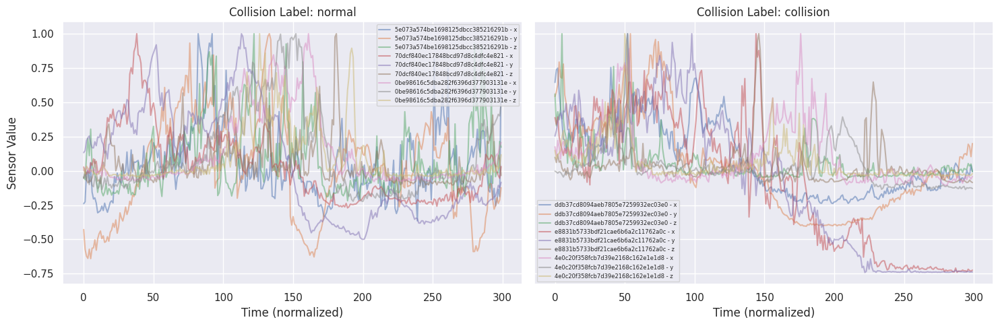

In [8]:
plot_time_series_by_collision_label(
    meta_df, 
    series_df_vision.rename(
        columns={
            'general_magnitudes': 'x', 
            'horizontals':'y', 
            'verticals':'z'
        }
    ), 
    n=3
)

In [9]:
%%time
features_vision = extract_features(
    series_df_vision,
    column_id="id",
    column_sort="time",
    impute_function=impute,
    disable_progressbar=False
)

features_vision.to_csv('features_vision.csv')

Feature Extraction: 100%|██████████| 50/50 [48:30<00:00, 58.20s/it]   


CPU times: user 10min 49s, sys: 47 s, total: 11min 36s
Wall time: 56min 25s


In [10]:
features_vision

,verticals__variance_larger_than_standard_deviation,verticals__has_duplicate_max,verticals__has_duplicate_min,verticals__has_duplicate,verticals__sum_values,verticals__abs_energy,verticals__mean_abs_change,verticals__mean_change,verticals__mean_second_derivative_central,verticals__median,...,horizontals__fourier_entropy__bins_5,horizontals__fourier_entropy__bins_10,horizontals__fourier_entropy__bins_100,horizontals__permutation_entropy__dimension_3__tau_1,horizontals__permutation_entropy__dimension_4__tau_1,horizontals__permutation_entropy__dimension_5__tau_1,horizontals__permutation_entropy__dimension_6__tau_1,horizontals__permutation_entropy__dimension_7__tau_1,horizontals__query_similarity_count__query_None__threshold_0.0,horizontals__mean_n_absolute_max__number_of_maxima_7
000049dd8b9406d24fb225d3cac9cbcf,0.0,0.0,0.0,0.0,18.868001,14.357841,0.097246,-0.000017,0.000173,0.000000e+00,...,0.288307,0.475843,1.606817,1.707929,2.905168,4.116818,4.916485,5.349623,0.0,0.795336
000147cc5fca05f5b9b7992981190242,0.0,0.0,0.0,0.0,26.387861,11.367232,0.057613,-0.000589,-0.000103,0.000000e+00,...,0.170467,0.170467,0.424293,1.653964,2.749395,3.804683,4.524273,4.940953,0.0,0.976290
0001beb8085197d17d48a1ea461c86d3,0.0,0.0,0.0,0.0,27.805756,13.374769,0.062695,-0.001143,-0.000323,0.000000e+00,...,0.136002,0.181214,0.271451,1.646361,2.677667,3.703297,4.338673,4.671007,0.0,0.961254
0001ee227361e6ea1c9534a1d4e10415,0.0,0.0,0.0,0.0,17.037198,9.483656,0.082372,-0.002923,0.001095,2.810000e-09,...,0.090729,0.136002,0.617993,1.770077,3.093666,4.471653,5.271632,5.555019,0.0,0.586284
00025101c58e65246dbd3dd615e2ef14,0.0,0.0,0.0,0.0,7.336250,2.957973,0.030604,-0.000170,-0.000002,0.000000e+00,...,0.090729,0.136002,0.433549,1.746448,3.007056,4.276938,5.076007,5.411310,0.0,0.782908
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
incident-ffc34587056b733e6df70b7691883bd3,0.0,0.0,0.0,0.0,5.597533,1.655930,0.018083,0.000032,0.000011,-1.855000e-10,...,0.125256,0.215617,1.514005,1.784949,3.134226,4.562798,5.417871,5.655288,0.0,0.759645
incident-ffe012f8fb9c971ce98796b12ebd6af3,0.0,0.0,0.0,0.0,2.586536,1.265268,0.012090,0.000001,-0.000002,1.050000e-10,...,0.204871,0.388782,1.173151,1.731599,2.964605,4.210537,5.060792,5.460089,0.0,0.847337
incident-fff753450b3a9e0abb9cea89e5800728,0.0,0.0,0.0,0.0,22.554754,12.431614,0.070355,-0.001477,0.000135,5.120000e-09,...,0.079983,0.243347,2.247903,1.784621,3.147245,4.611686,5.490756,5.660003,0.0,0.705102
incident-fff8ec8ac15e37a5dbb12a98198f2cc1,0.0,0.0,0.0,0.0,7.111594,3.568539,0.026172,-0.000010,-0.000004,0.000000e+00,...,0.170467,0.215617,0.531534,1.752603,3.027958,4.290037,5.121740,5.421896,0.0,0.912392


In [11]:
labels = meta_df[['id', 'collision_label']].set_index('id')
labels.head()

,collision_label
id,
5e073a574be1698125dbcc385216291b,normal
70dcf840ec17848bcd97d8c4dfc4e821,normal
0be98616c5dba282f6396d377903131e,normal
16bf060355d52988d4c2f59a3417fdd2,normal
19e853be42e7050786a5fb56cbcf2900,normal


In [12]:
features_vision = features_vision.merge(labels, left_index=True, right_index=True)
features_vision.shape

(50772, 2350)

In [13]:
train_ids = pd.read_csv('df_train_collision.csv').id
test_ids = pd.read_csv('df_test_collision.csv').id
train_ids = train_ids[train_ids.isin(features_vision.index)]
test_ids = test_ids[test_ids.isin(features_vision.index)]
len(train_ids), len(test_ids)

(44043, 6718)

In [15]:
from simpml.tabular.all import *

indexsplitter = IndexSplitter(
    split_sets = {
            Dataset.Train: train_ids, Dataset.Valid: test_ids
        }
)

data_manager = SupervisedTabularDataManager(
    data = features_vision,
    target = 'collision_label',
    prediction_type = PredictionType.BinaryClassification,
    splitter = indexsplitter
)


data_manager.build_pipeline(
    remove_special_json_characters=False,
    step_params = {'encoding_dict': {'normal':0,'collision':1}},
    smote=False
)

Sklearn Pipeline:
MatchVariablesBefore (MatchVariables(missing_values='ignore')) ->
NanColumnDropper (NanColumnDropper()) ->
Infinity2Nan (Infinity2Nan()) ->
MinMaxScaler (MinMaxScalerWithColumnNames()) ->
AddMissingIndicator (AddMissingIndicator()) ->
NumericalImputer (MeanMedianImputer()) ->
MatchVariablesAfter (MatchVariables(missing_values='ignore'))

Target Pipeline:
LabelEncoder (DictLabelEncoder(encoding_dict={'collision': 1, 'normal': 0}))

In [16]:
exp_mang = ExperimentManager(data_manager, optimize_metric = MetricName.AUC)
exp_mang.remove_models(['LightGBM', 'Support Vector Classifier','AdaBoost Classifier','Decision Tree','Gradient Boosting'])
exp_mang.run_experiment(metrics_kwargs = {'pos_label': 1})

,Experiment ID,Experiment Description,Model,Model Description,Data Version,Data Description,Model Params,Metric Params,Accuracy,AUC,Recall,Precision,Balanced Accuracy,F1,Run Time
0,20250331062834_51aa,,Baseline Classification,Default settings,a0207e7e,,"{'experiment_manager': Prediction Type: PredictionType.BinaryClassification, Metric: Metric: AUC. Description: , Random State: 0}",{'pos_label': 1},0.848913,0.504407,0.128571,0.044610,0.504407,0.066237,0:00:14
1,20250331062834_51aa,,Logistic Regression,Default settings,a0207e7e,,"{'experiment_manager': Prediction Type: PredictionType.BinaryClassification, Metric: Metric: AUC. Description: , Random State: 0}",{'pos_label': 1},0.956237,0.717543,0.457143,0.474074,0.717543,0.465455,0:00:25
2,20250331062834_51aa,,Random Forest,Default settings,a0207e7e,,"{'experiment_manager': Prediction Type: PredictionType.BinaryClassification, Metric: Metric: AUC. Description: , Random State: 0}",{'pos_label': 1},0.961000,0.663663,0.339286,0.552326,0.663663,0.420354,0:00:42
3,20250331062834_51aa,,XGBoost,Default settings,a0207e7e,,"{'experiment_manager': Prediction Type: PredictionType.BinaryClassification, Metric: Metric: AUC. Description: , Random State: 0}",{'pos_label': 1},0.960554,0.707839,0.432143,0.533040,0.707839,0.477318,0:02:30



=== Analyzing Segment: g_max < 1.0 ===
Segment size: 5609 samples


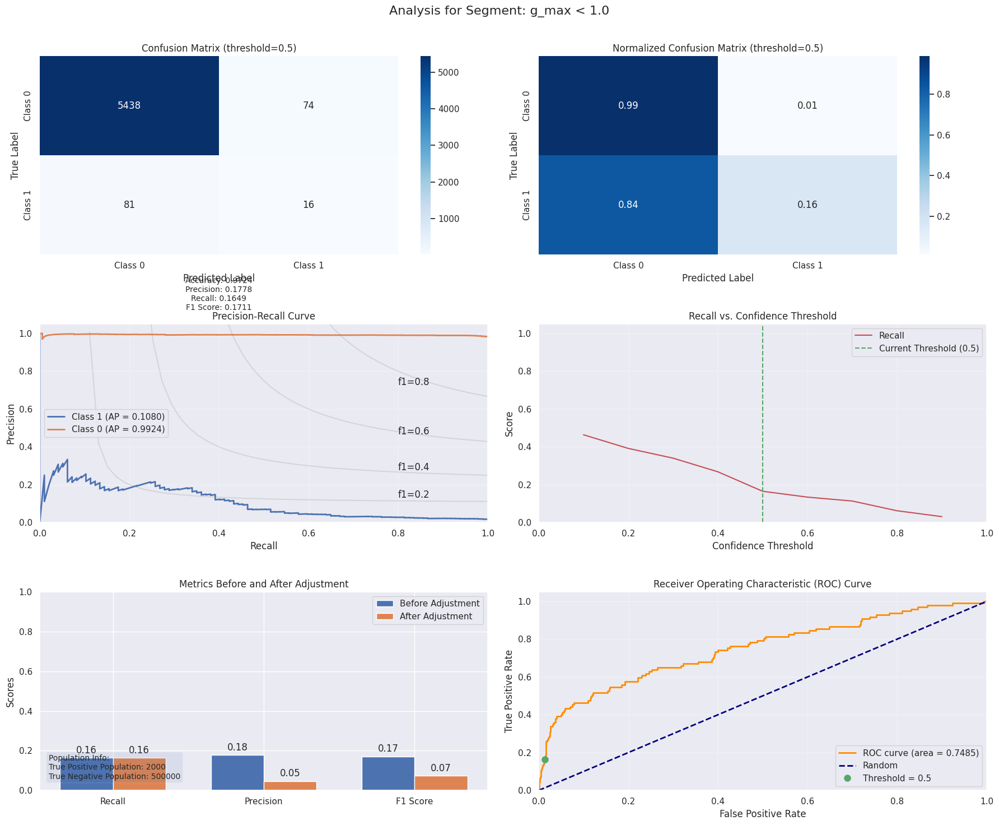


Segment: g_max < 1.0
True Positive Population: 2000
True Negative Population: 500000
Samples: 5609
TN: 5438
FP: 74
FN: 81
TP: 16
Recall: 0.1649
Precision: 0.1778
F1: 0.1711
ROC_AUC: 0.7485
Precision_adj: 0.0468
F1_adj: 0.0730
Pop_TP: 2000
Pop_TN: 500000

=== Analyzing Segment: 1.0 ≤ g_max < 1.4 ===
Segment size: 810 samples


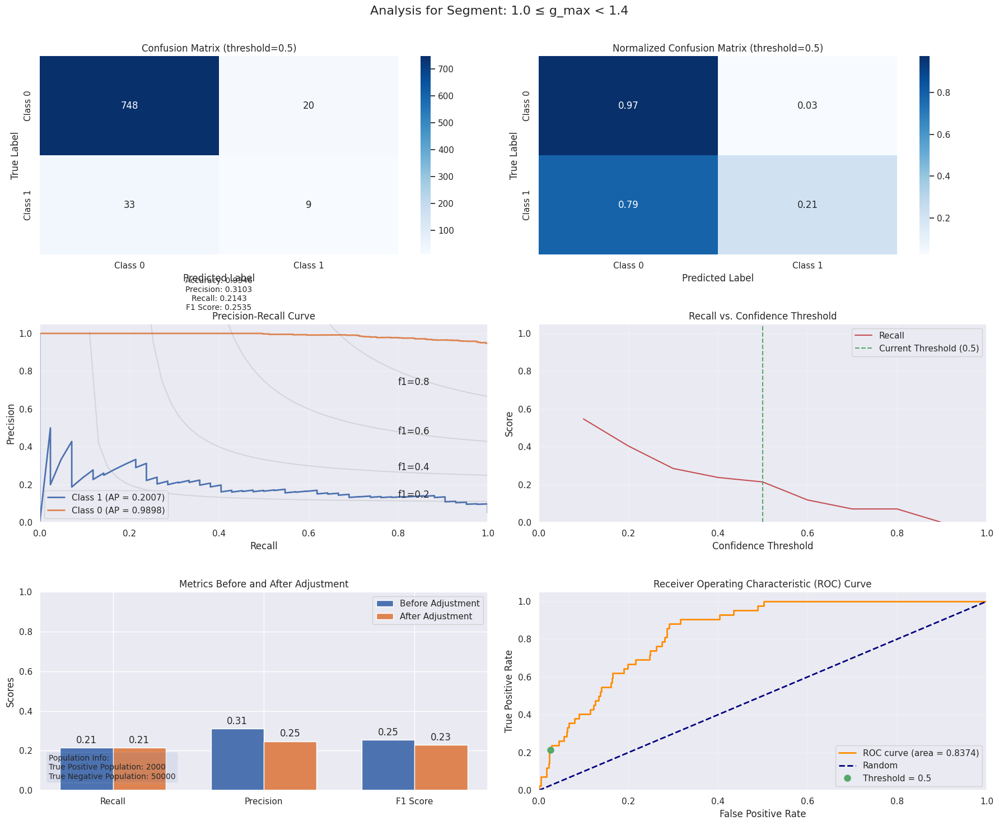


Segment: 1.0 ≤ g_max < 1.4
True Positive Population: 2000
True Negative Population: 50000
Samples: 810
TN: 748
FP: 20
FN: 33
TP: 9
Recall: 0.2143
Precision: 0.3103
F1: 0.2535
ROC_AUC: 0.8374
Precision_adj: 0.2476
F1_adj: 0.2298
Pop_TP: 2000
Pop_TN: 50000

=== Analyzing Segment: g_max ≥ 1.4 ===
Segment size: 299 samples


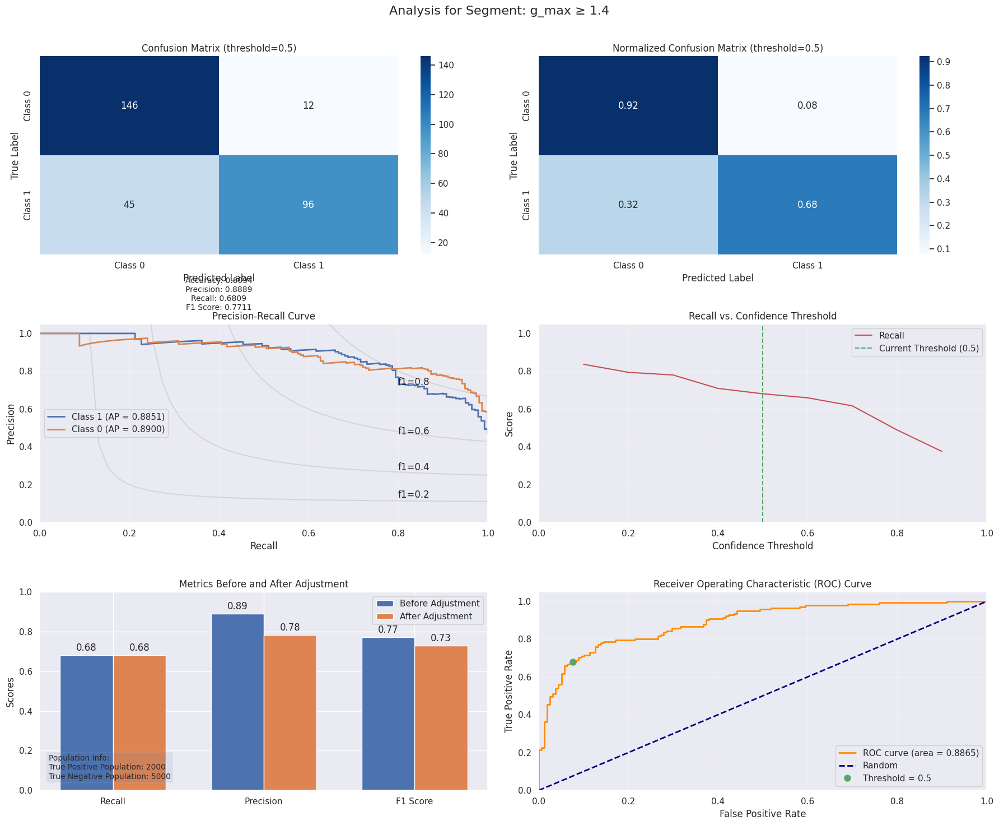


Segment: g_max ≥ 1.4
True Positive Population: 2000
True Negative Population: 5000
Samples: 299
TN: 146
FP: 12
FN: 45
TP: 96
Recall: 0.6809
Precision: 0.8889
F1: 0.7711
ROC_AUC: 0.8865
Precision_adj: 0.7819
F1_adj: 0.7279
Pop_TP: 2000
Pop_TN: 5000


In [17]:
best_model = exp_mang.get_model('XGBoost', '20250331062834_51aa')
best_model.export('best_model_vision.pkl')

X, y = data_manager.get_validation_data()

y_pred = best_model.model.predict(X)
y_prob = best_model.model.predict_proba(X)

preds = pd.DataFrame({
    'id': X.index,
    'y_pred': y_pred,
    'y_true': y,
    'y_prob_0': y_prob[:, 0],
    'y_prob_1': y_prob[:, 1]
})

preds = preds.merge(meta_df[['id', 'g_max']], on='id', how='left')
preds.head()

analyzer = SegmentAnalyzer(preds, 'g_max')
analyzer.add_segment(None, 1.0, true_pos_population=2000, true_neg_population=500000)
analyzer.add_segment(1.0, 1.4, true_pos_population=2000, true_neg_population=50000)
analyzer.add_segment(1.4, None, true_pos_population=2000, true_neg_population=5000)
results = analyzer.analyze(y_true_col='y_true', y_prob_cols=['y_prob_0', 'y_prob_1'])
summary_df = analyzer.summary()

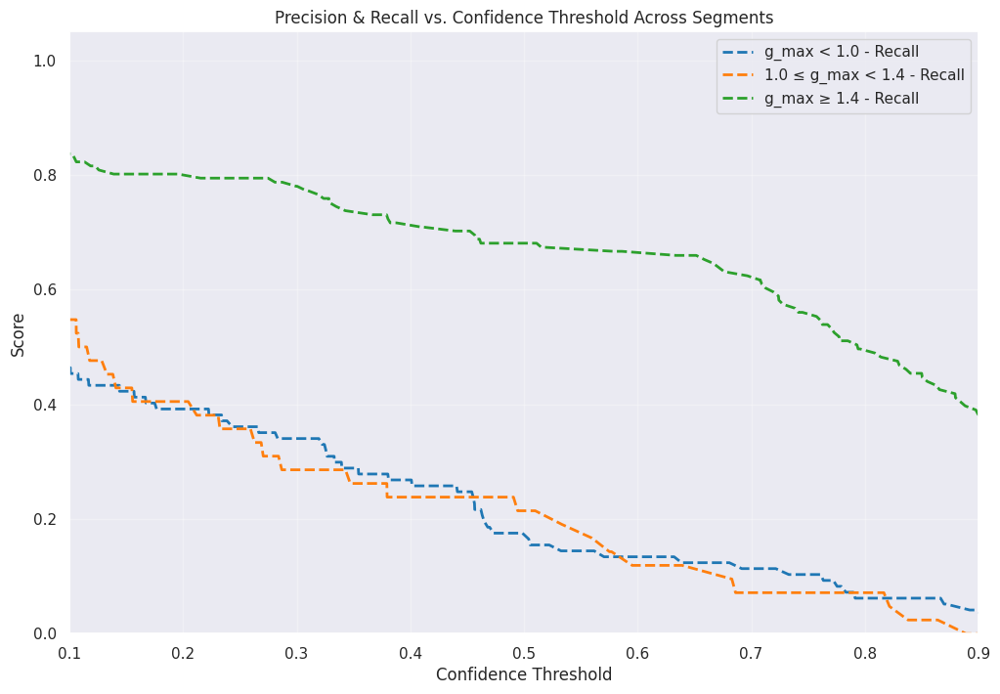

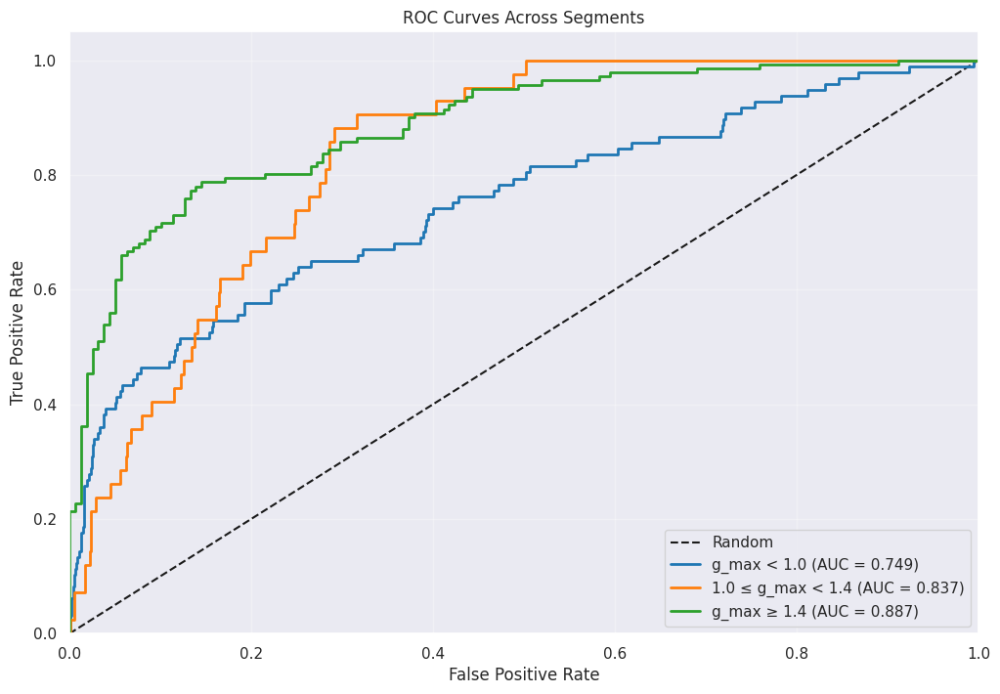

In [19]:
metrics_fig, pop_fig, data_points = analyzer.plot_segment_comparisons(
    y_true_col='y_true',
    y_prob_cols=['y_prob_0', 'y_prob_1'],
    metric_type='recall'
)

# Train IMU + Audio + Vision

In [39]:
features = pd.read_csv('extract_features_all.csv', index_col=[0])
df_audio = pd.concat([pd.read_csv('peak_audio_features_train.csv'), pd.read_csv('peak_audio_features_test.csv')]).drop('label',axis=1)
df_vision = pd.read_csv('features_vision.csv', index_col = [0])
df_features_with_audio = df_audio.merge(features.reset_index(), left_on="video_id", right_on="index", how="inner")
df_features_with_audio = df_features_with_audio.set_index('video_id').drop('index', axis=1)
df_imu_audio_vision = df_features_with_audio.merge(df_vision.reset_index(), left_on="video_id", right_on="index", how="inner").set_index('index')

train_ids = pd.read_csv('df_train_collision.csv').id
test_ids = pd.read_csv('df_test_collision.csv').id
train_ids = train_ids[train_ids.isin(df_imu_audio_vision.index)]
test_ids = test_ids[test_ids.isin(df_imu_audio_vision.index)]
len(train_ids), len(test_ids)

(29905, 4676)

In [44]:
df_imu_audio_vision.head()

,peak_score,peak_time,mfcc_0,mfcc_1,mfcc_2,mfcc_3,mfcc_4,mfcc_5,mfcc_6,mfcc_7,...,horizontals__fourier_entropy__bins_5,horizontals__fourier_entropy__bins_10,horizontals__fourier_entropy__bins_100,horizontals__permutation_entropy__dimension_3__tau_1,horizontals__permutation_entropy__dimension_4__tau_1,horizontals__permutation_entropy__dimension_5__tau_1,horizontals__permutation_entropy__dimension_6__tau_1,horizontals__permutation_entropy__dimension_7__tau_1,horizontals__query_similarity_count__query_None__threshold_0.0,horizontals__mean_n_absolute_max__number_of_maxima_7
index,,,,,,,,,,,,,,,,,,,,,
367891ae6af8b24f1bfb8e96ca35d9a1,0.441727,3.5,-343.58260,197.39047,-19.490360,50.986347,11.965891,7.569995,30.386732,1.850265,...,0.170467,0.226363,0.316475,1.702989,2.912113,4.044631,4.720742,5.011208,0.0,0.977596
937208edd45511ca256f5d4dc3351263,0.550961,6.0,-330.80490,128.40031,33.331810,24.615595,32.670550,20.528950,16.334747,15.476773,...,0.090729,0.090729,0.350689,1.763248,3.086328,4.445066,5.290429,5.579219,0.0,0.896301
7f1aed3ab04eeba8de79ee2ff22d8c15,0.357839,2.5,-312.00336,191.77164,5.177242,45.191963,24.067986,11.284945,33.438942,15.550726,...,0.125256,0.136002,0.226363,1.686171,2.773246,3.757290,4.487610,4.959409,0.0,0.790236
0ffccb09edfa12b1dd4d5d910324f1f8,0.388285,6.0,-279.26215,190.12830,-26.101332,57.418625,11.839854,8.999070,33.438430,-3.143236,...,0.045395,0.155665,0.510201,1.738851,2.969208,4.196827,5.000307,5.341958,0.0,0.857768
547a9d69d1e251d2bcc74b164b18b33e,0.381722,0.5,-262.43878,164.61203,35.562640,27.613102,-7.194649,11.934116,25.803160,-5.770697,...,0.090729,0.090729,0.136002,1.771331,3.063007,4.387111,5.211071,5.595145,0.0,0.787826


,Experiment ID,Experiment Description,Model,Model Description,Data Version,Data Description,Model Params,Metric Params,Accuracy,AUC,Recall,Precision,Balanced Accuracy,F1,Run Time
0,20250331064821_e5c0,,Baseline Classification,Default settings,79d46826,,"{'experiment_manager': Prediction Type: PredictionType.BinaryClassification, Metric: Metric: AUC. Description: , Random State: 0}",{'pos_label': 1},0.881737,0.505057,0.091787,0.049479,0.505057,0.064298,0:00:20
1,20250331064821_e5c0,,Logistic Regression,Default settings,79d46826,,"{'experiment_manager': Prediction Type: PredictionType.BinaryClassification, Metric: Metric: AUC. Description: , Random State: 0}",{'pos_label': 1},0.970701,0.814207,0.642512,0.678571,0.814207,0.660050,0:00:31
2,20250331064821_e5c0,,Random Forest,Default settings,79d46826,,"{'experiment_manager': Prediction Type: PredictionType.BinaryClassification, Metric: Metric: AUC. Description: , Random State: 0}",{'pos_label': 1},0.977545,0.790145,0.584541,0.864286,0.790145,0.697406,0:00:44
3,20250331064821_e5c0,,XGBoost,Default settings,79d46826,,"{'experiment_manager': Prediction Type: PredictionType.BinaryClassification, Metric: Metric: AUC. Description: , Random State: 0}",{'pos_label': 1},0.976689,0.808126,0.623188,0.806250,0.808126,0.702997,0:02:48



=== Analyzing Segment: g_max < 1.0 ===
Segment size: 3899 samples


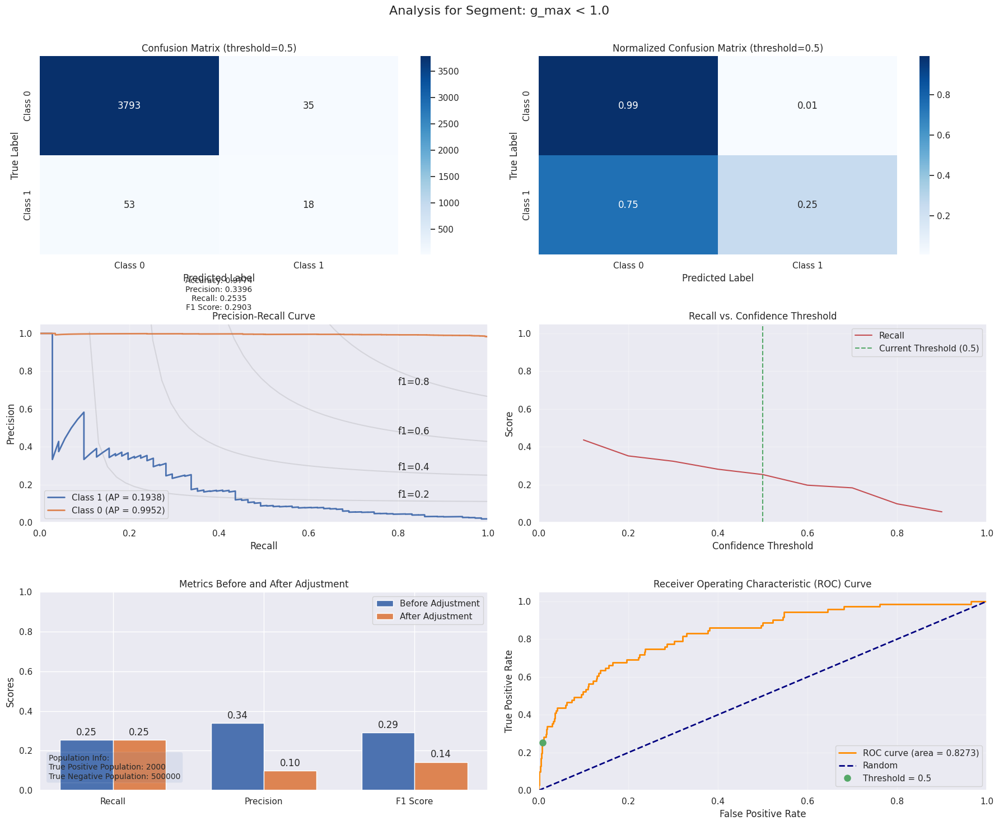


Segment: g_max < 1.0
True Positive Population: 2000
True Negative Population: 500000
Samples: 3899
TN: 3793
FP: 35
FN: 53
TP: 18
Recall: 0.2535
Precision: 0.3396
F1: 0.2903
ROC_AUC: 0.8273
Precision_adj: 0.0998
F1_adj: 0.1433
Pop_TP: 2000
Pop_TN: 500000

=== Analyzing Segment: 1.0 ≤ g_max < 1.4 ===
Segment size: 564 samples


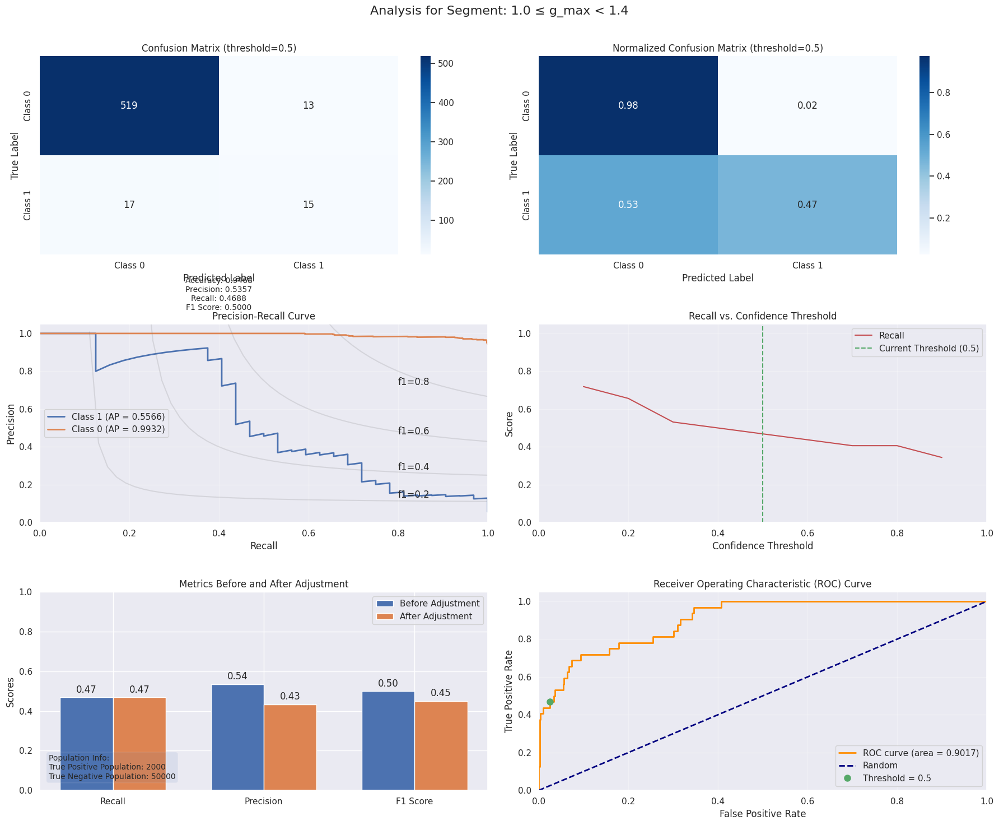


Segment: 1.0 ≤ g_max < 1.4
True Positive Population: 2000
True Negative Population: 50000
Samples: 564
TN: 519
FP: 13
FN: 17
TP: 15
Recall: 0.4688
Precision: 0.5357
F1: 0.5000
ROC_AUC: 0.9017
Precision_adj: 0.4342
F1_adj: 0.4508
Pop_TP: 2000
Pop_TN: 50000

=== Analyzing Segment: g_max ≥ 1.4 ===
Segment size: 213 samples


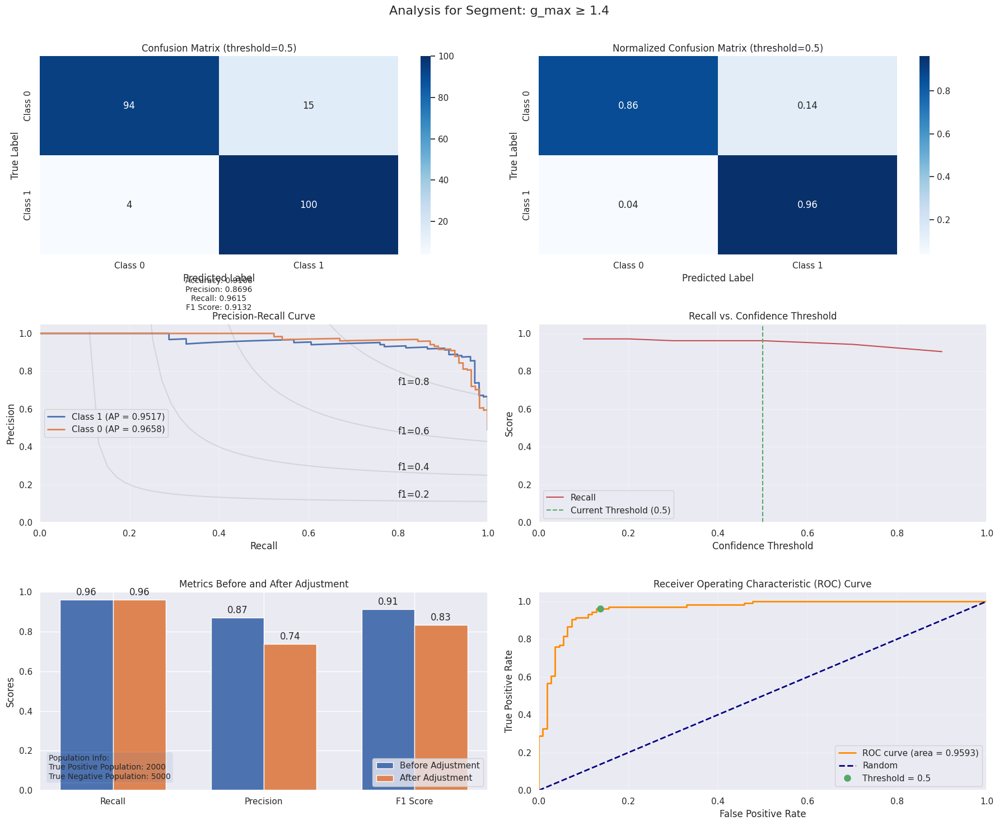


Segment: g_max ≥ 1.4
True Positive Population: 2000
True Negative Population: 5000
Samples: 213
TN: 94
FP: 15
FN: 4
TP: 100
Recall: 0.9615
Precision: 0.8696
F1: 0.9132
ROC_AUC: 0.9593
Precision_adj: 0.7365
F1_adj: 0.8341
Pop_TP: 2000
Pop_TN: 5000


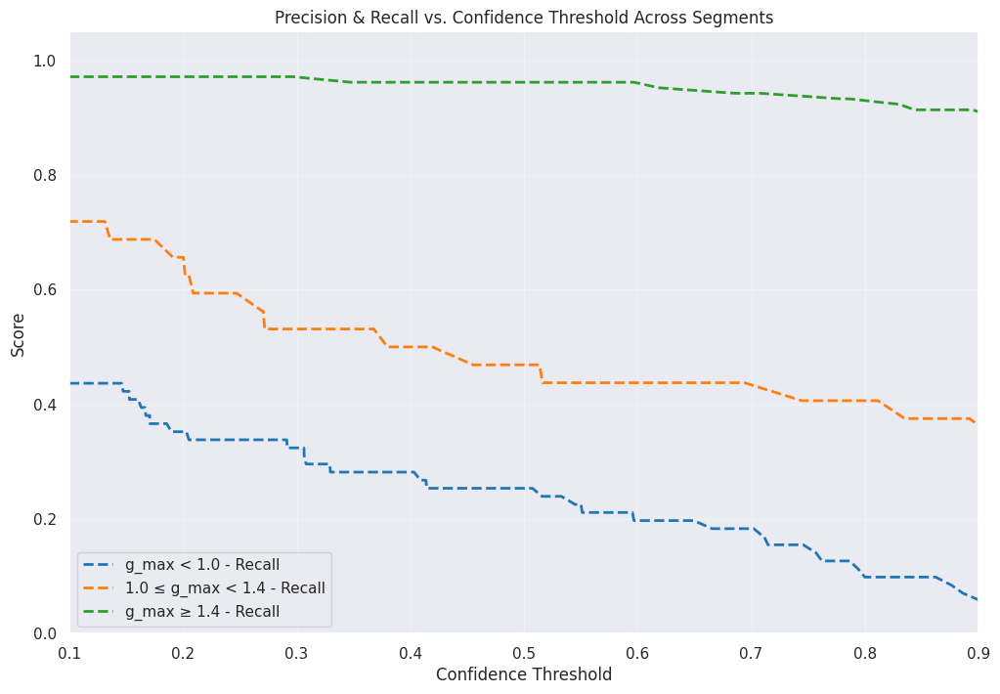

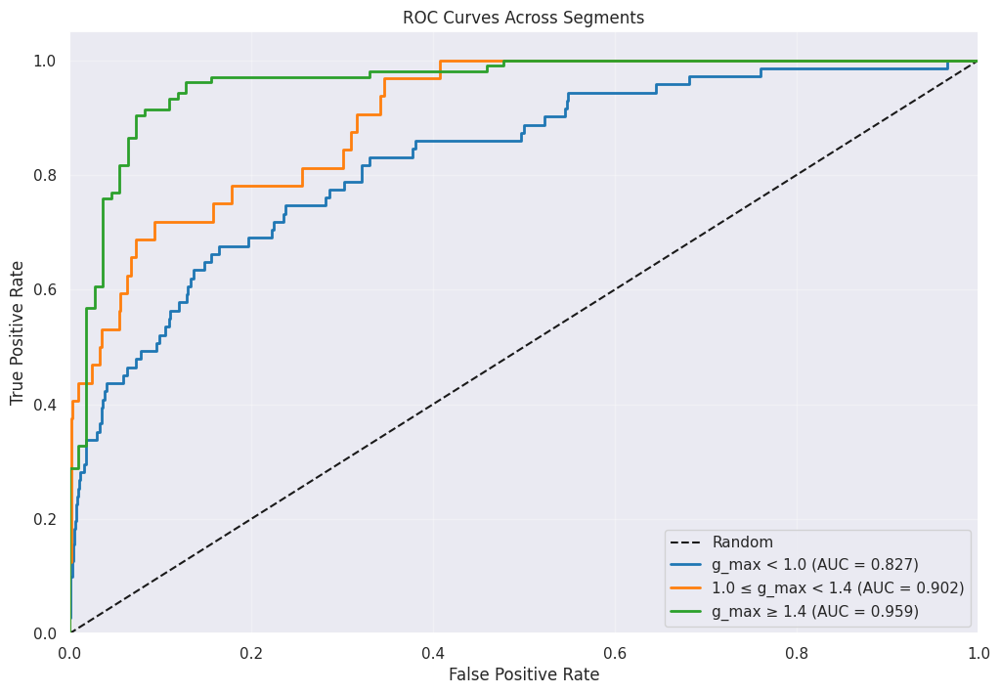

In [47]:
from simpml.tabular.all import *

indexsplitter = IndexSplitter(
    split_sets = {
            Dataset.Train: train_ids, Dataset.Valid: test_ids
        }
)

data_manager = SupervisedTabularDataManager(
    data = df_imu_audio_vision,
    target = 'collision_label',
    prediction_type = PredictionType.BinaryClassification,
    splitter = indexsplitter
)


data_manager.build_pipeline(
    remove_special_json_characters=False,
    step_params = {'encoding_dict': {'normal':0,'collision':1}},
    smote=False
)

exp_mang = ExperimentManager(data_manager, optimize_metric = MetricName.AUC)
exp_mang.remove_models(['LightGBM', 'Support Vector Classifier','AdaBoost Classifier','Decision Tree','Gradient Boosting'])
exp_mang.run_experiment(metrics_kwargs = {'pos_label': 1})

best_model = exp_mang.get_best_model()
best_model.export('best_model_imu_audio_vision.pkl')

X, y = data_manager.get_validation_data()

y_pred = best_model.model.predict(X)
y_prob = best_model.model.predict_proba(X)

preds = pd.DataFrame({
    'id': X.index,
    'y_pred': y_pred,
    'y_true': y,
    'y_prob_0': y_prob[:, 0],
    'y_prob_1': y_prob[:, 1]
})

preds = preds.merge(meta_df[['id', 'g_max']], on='id', how='left')

analyzer = SegmentAnalyzer(preds, 'g_max')
analyzer.add_segment(None, 1.0, true_pos_population=2000, true_neg_population=500000)
analyzer.add_segment(1.0, 1.4, true_pos_population=2000, true_neg_population=50000)
analyzer.add_segment(1.4, None, true_pos_population=2000, true_neg_population=5000)
results = analyzer.analyze(y_true_col='y_true', y_prob_cols=['y_prob_0', 'y_prob_1'])
summary_df = analyzer.summary()

metrics_fig, pop_fig, data_points = analyzer.plot_segment_comparisons(
    y_true_col='y_true',
    y_prob_cols=['y_prob_0', 'y_prob_1'],
    metric_type='recall'
)

# Reduce the number of features

In [3]:
df_sensor = pd.read_csv('all_ts.csv')

In [7]:
import json
with open("feature_importance.json", "r") as f:
    fi_list = json.load(f)

In [8]:
len(fi_list)

45

In [10]:
import tsfresh
tsfresh.feature_extraction.settings.from_columns(fi_list)

from tsfresh.feature_extraction.settings import from_columns
from tsfresh import extract_features
from tsfresh.utilities.dataframe_functions import impute
import pandas as pd

fc_settings = from_columns(fi_list)
df_long = pd.melt(df_sensor, 
                 id_vars=['id', 'time'], 
                 value_vars=['x', 'y', 'z'],
                 var_name='kind', 
                 value_name='value')

features = extract_features(
    df_long,
    column_id="id",
    column_sort="time",
    column_kind="kind",
    column_value="value",
    kind_to_fc_parameters=fc_settings,
    impute_function=impute,
    disable_progressbar=False
)

Feature Extraction: 100%|██████████| 50/50 [22:44<00:00, 27.30s/it]  


In [11]:
meta_df = pd.read_csv('nvidia_delivery.csv')
labels = meta_df[['id', 'collision_label']].set_index('id')
features = features.merge(labels, left_index=True, right_index=True)
features.head()

,x__fourier_entropy__bins_100,x__lempel_ziv_complexity__bins_10,x__lempel_ziv_complexity__bins_3,x__lempel_ziv_complexity__bins_5,x__last_location_of_maximum,x__mean_n_absolute_max__number_of_maxima_7,x__first_location_of_minimum,x__large_standard_deviation__r_0.1,x__kurtosis,"x__agg_linear_trend__attr_""stderr""__chunk_len_5__f_agg_""var""",...,z__percentage_of_reoccurring_datapoints_to_all_datapoints,z__skewness,z__energy_ratio_by_chunks__num_segments_10__segment_focus_4,z__autocorrelation__lag_2,z__autocorrelation__lag_8,z__partial_autocorrelation__lag_3,"z__fft_coefficient__attr_""imag""__coeff_3","z__fft_coefficient__attr_""abs""__coeff_95",z__ratio_value_number_to_time_series_length,collision_label
000049dd8b9406d24fb225d3cac9cbcf,0.680587,0.252725,0.131814,0.163528,0.887017,0.517589,0.265610,1.0,3.962107,0.000003,...,0.662042,0.202662,0.111303,0.978902,0.900845,-0.083467,77.274328,2.664145,0.569871,normal
000147cc5fca05f5b9b7992981190242,0.988152,0.167164,0.078358,0.109701,0.582090,0.931268,0.377612,1.0,4.372893,0.000023,...,0.964179,1.105499,0.436990,0.873825,0.713733,-0.039369,-2.385399,3.857171,0.198507,normal
0001beb8085197d17d48a1ea461c86d3,0.226363,0.187755,0.075510,0.121429,0.502041,1.061117,0.596939,1.0,5.070300,0.000002,...,0.741837,-0.562633,0.039875,0.972948,0.823435,-0.269440,-40.481303,1.755040,0.488776,normal
0001ee227361e6ea1c9534a1d4e10415,1.593889,0.185671,0.075681,0.106963,0.127144,0.508463,0.371342,0.0,5.501113,0.000006,...,0.613522,0.692609,0.094038,0.957845,0.801872,-0.167378,8.445210,3.111492,0.622603,normal
00025101c58e65246dbd3dd615e2ef14,3.477181,0.179588,0.083415,0.125613,0.425908,0.188138,0.394504,0.0,6.211052,0.000002,...,0.876349,1.409004,0.112880,0.989660,0.933913,-0.148567,53.163807,0.575131,0.292444,normal


In [13]:
df_audio = pd.concat([pd.read_csv('peak_audio_features_train.csv'), pd.read_csv('peak_audio_features_test.csv')]).drop('label',axis=1)
df_features_with_audio = df_audio.merge(features.reset_index(), left_on="video_id", right_on="index", how="inner")
df_features_with_audio = df_features_with_audio.set_index('video_id').drop('index', axis=1)

train_ids = pd.read_csv('df_train_collision.csv').id
test_ids = pd.read_csv('df_test_collision.csv').id
train_ids = train_ids[train_ids.isin(df_features_with_audio.index)]
test_ids = test_ids[test_ids.isin(df_features_with_audio.index)]
len(train_ids), len(test_ids)

(31581, 4928)

,Experiment ID,Experiment Description,Model,Model Description,Data Version,Data Description,Model Params,Metric Params,Accuracy,AUC,Recall,Precision,Balanced Accuracy,F1,Run Time
0,20250406164715_aefe,,Baseline Classification,Default settings,8ff3fa0b,,"{'experiment_manager': Prediction Type: PredictionType.BinaryClassification, Metric: Metric: AUC. Description: , Random State: 0}",{'pos_label': 1},0.815747,0.520208,0.161663,0.113821,0.520208,0.133588,0:00:00
1,20250406164715_aefe,,Logistic Regression,Default settings,8ff3fa0b,,"{'experiment_manager': Prediction Type: PredictionType.BinaryClassification, Metric: Metric: AUC. Description: , Random State: 0}",{'pos_label': 1},0.961242,0.828490,0.667436,0.860119,0.828490,0.751625,0:00:01
2,20250406164715_aefe,,Random Forest,Default settings,8ff3fa0b,,"{'experiment_manager': Prediction Type: PredictionType.BinaryClassification, Metric: Metric: AUC. Description: , Random State: 0}",{'pos_label': 1},0.964692,0.843947,0.697460,0.875362,0.843947,0.776350,0:00:01
3,20250406164715_aefe,,XGBoost,Default settings,8ff3fa0b,,"{'experiment_manager': Prediction Type: PredictionType.BinaryClassification, Metric: Metric: AUC. Description: , Random State: 0}",{'pos_label': 1},0.960836,0.846007,0.706697,0.822581,0.846007,0.760248,0:00:02



=== Analyzing Segment: g_max < 1.0 ===
Segment size: 3965 samples


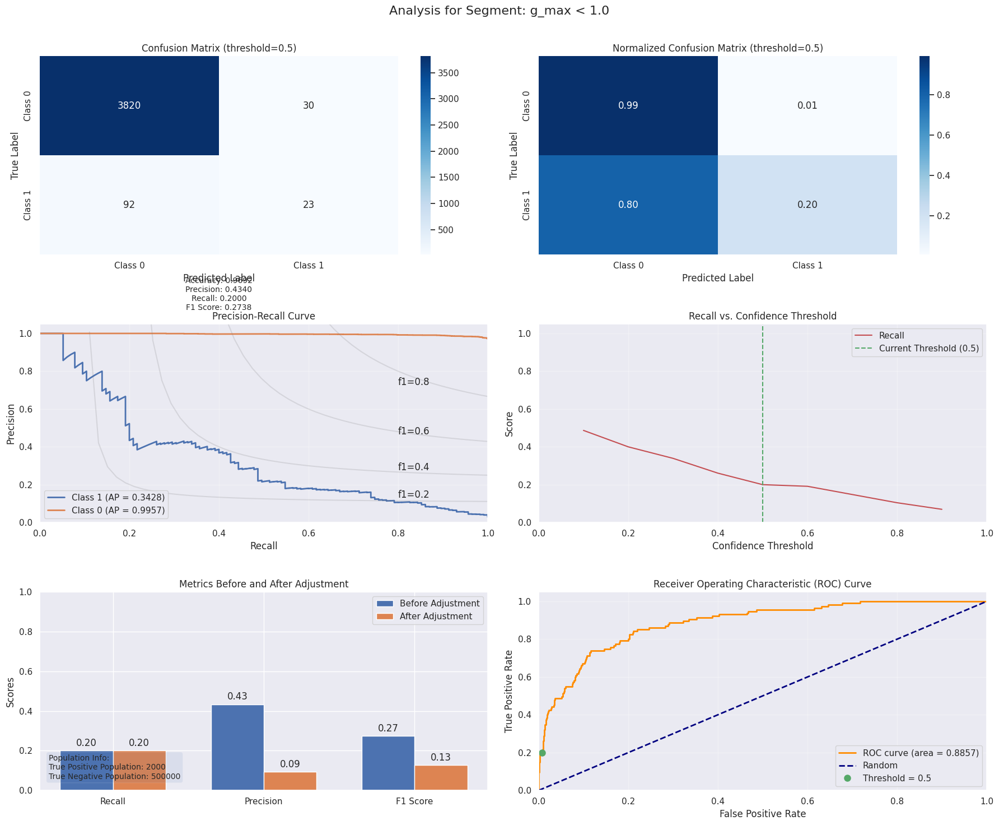


Segment: g_max < 1.0
True Positive Population: 2000
True Negative Population: 500000
Samples: 3965
TN: 3820
FP: 30
FN: 92
TP: 23
Recall: 0.2000
Precision: 0.4340
F1: 0.2738
ROC_AUC: 0.8857
Precision_adj: 0.0931
F1_adj: 0.1271
Pop_TP: 2000
Pop_TN: 500000

=== Analyzing Segment: 1.0 ≤ g_max < 1.4 ===
Segment size: 587 samples


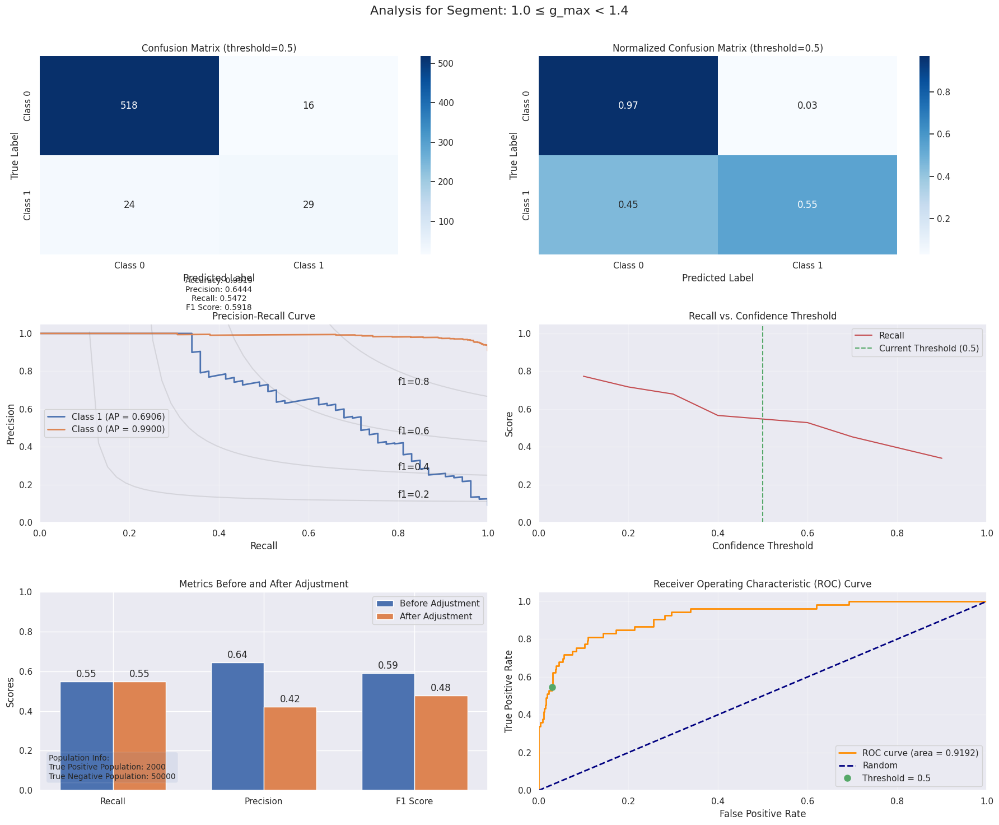


Segment: 1.0 ≤ g_max < 1.4
True Positive Population: 2000
True Negative Population: 50000
Samples: 587
TN: 518
FP: 16
FN: 24
TP: 29
Recall: 0.5472
Precision: 0.6444
F1: 0.5918
ROC_AUC: 0.9192
Precision_adj: 0.4221
F1_adj: 0.4766
Pop_TP: 2000
Pop_TN: 50000

=== Analyzing Segment: g_max ≥ 1.4 ===
Segment size: 376 samples


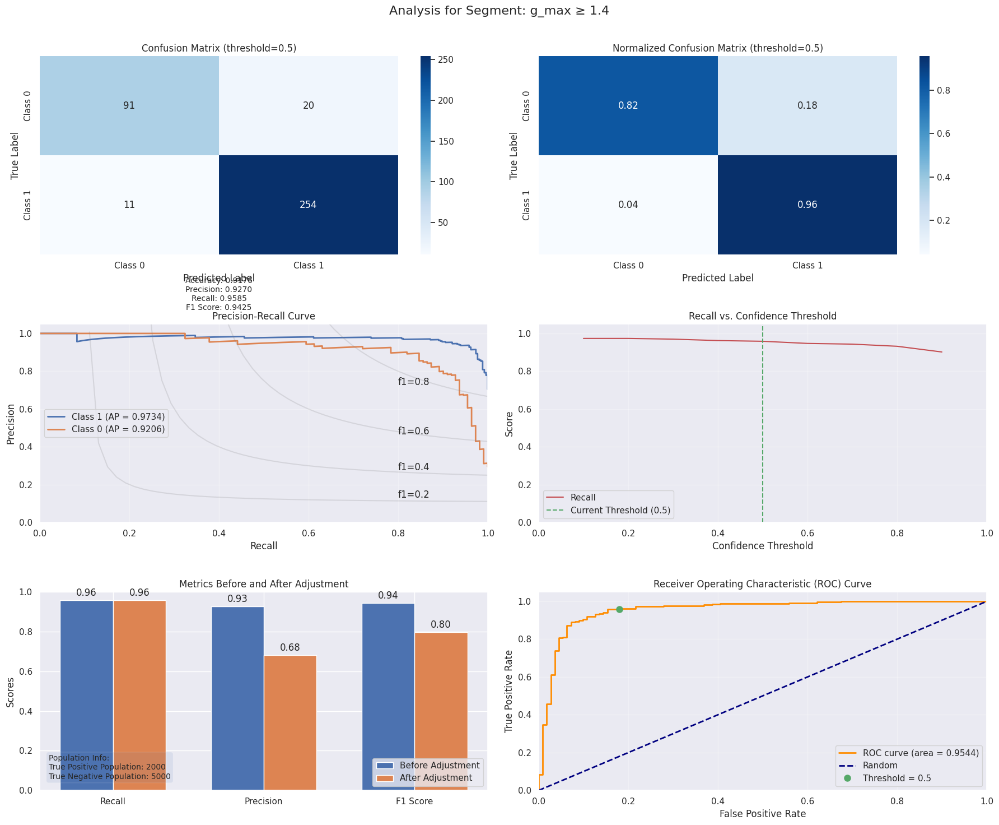


Segment: g_max ≥ 1.4
True Positive Population: 2000
True Negative Population: 5000
Samples: 376
TN: 91
FP: 20
FN: 11
TP: 254
Recall: 0.9585
Precision: 0.9270
F1: 0.9425
ROC_AUC: 0.9544
Precision_adj: 0.6803
F1_adj: 0.7958
Pop_TP: 2000
Pop_TN: 5000

=== Analyzing Segment: All Data ===
Segment size: 4928 samples


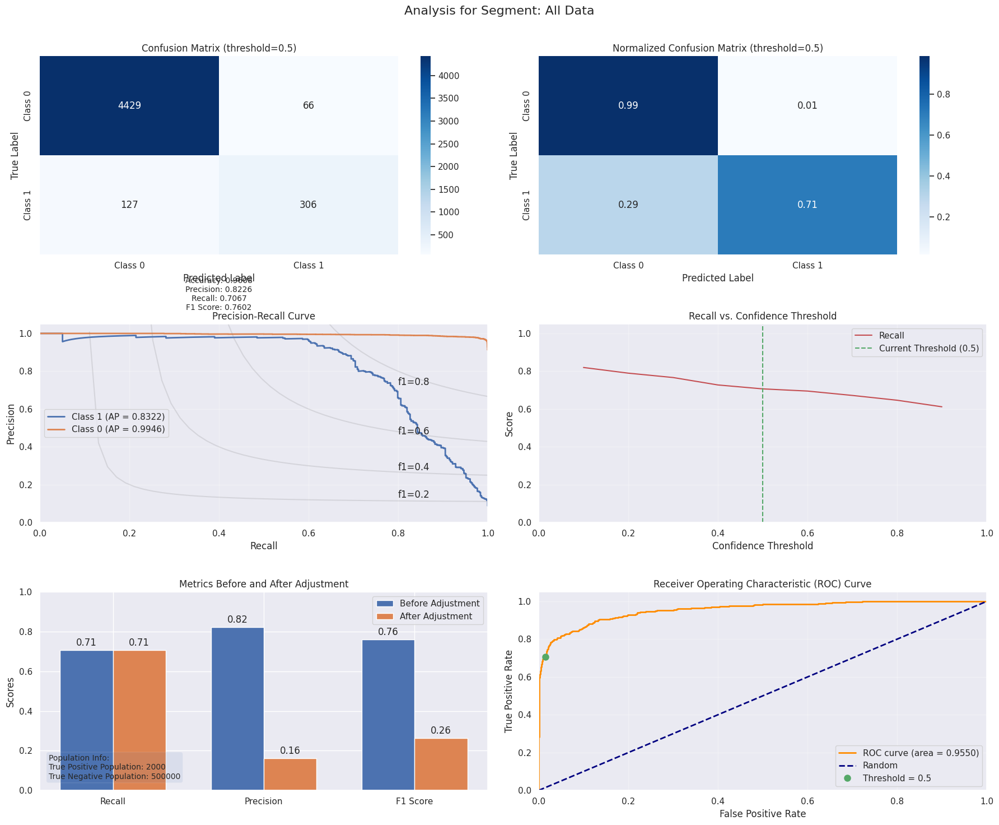


Segment: All Data
True Positive Population: 2000
True Negative Population: 500000
Samples: 4928
TN: 4429
FP: 66
FN: 127
TP: 306
Recall: 0.7067
Precision: 0.8226
F1: 0.7602
ROC_AUC: 0.9550
Precision_adj: 0.1614
F1_adj: 0.2628
Pop_TP: 2000
Pop_TN: 500000


100%|===================| 4911/4928 [00:16<00:00]          

,col_name,feature_importance_vals
0,x__fourier_entropy__bins_100,0.060646
1,x__approximate_entropy__m_2__r_0.9,0.045561
2,x__spkt_welch_density__coeff_2,0.042450
3,x__spkt_welch_density__coeff_8,0.035871
4,x__mean_n_absolute_max__number_of_maxima_7,0.033796
5,"z__change_quantiles__f_agg_""var""__isabs_True__qh_1.0__ql_0.8",0.030175
6,x__lempel_ziv_complexity__bins_10,0.028124
7,"y__agg_linear_trend__attr_""slope""__chunk_len_5__f_agg_""max""",0.027701
8,"z__agg_linear_trend__attr_""rvalue""__chunk_len_5__f_agg_""var""",0.027463
9,"z__agg_linear_trend__attr_""stderr""__chunk_len_5__f_agg_""var""",0.027061


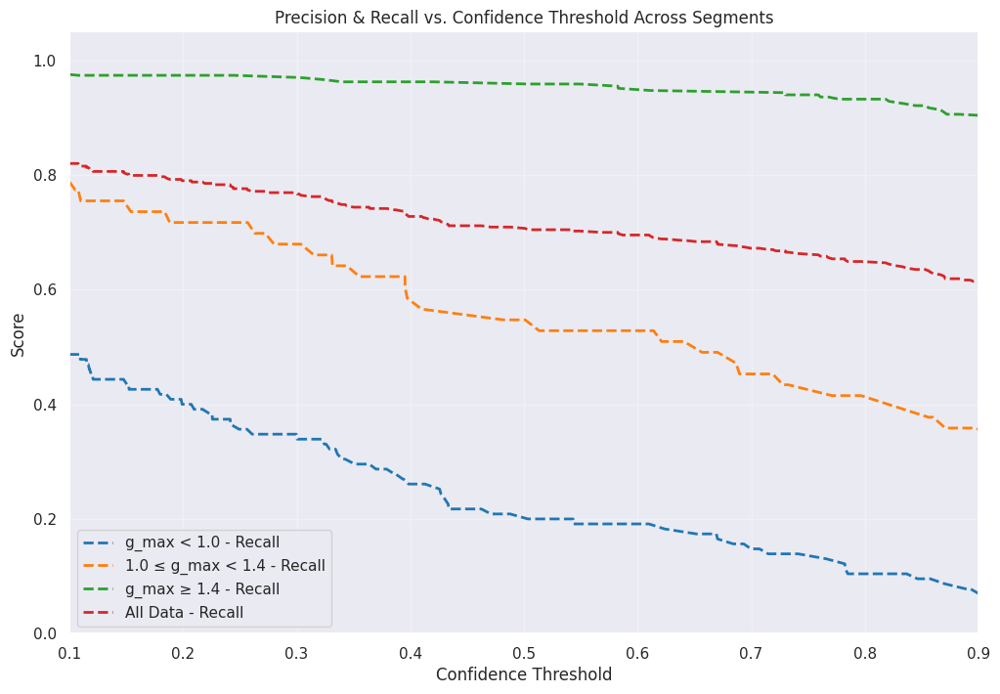

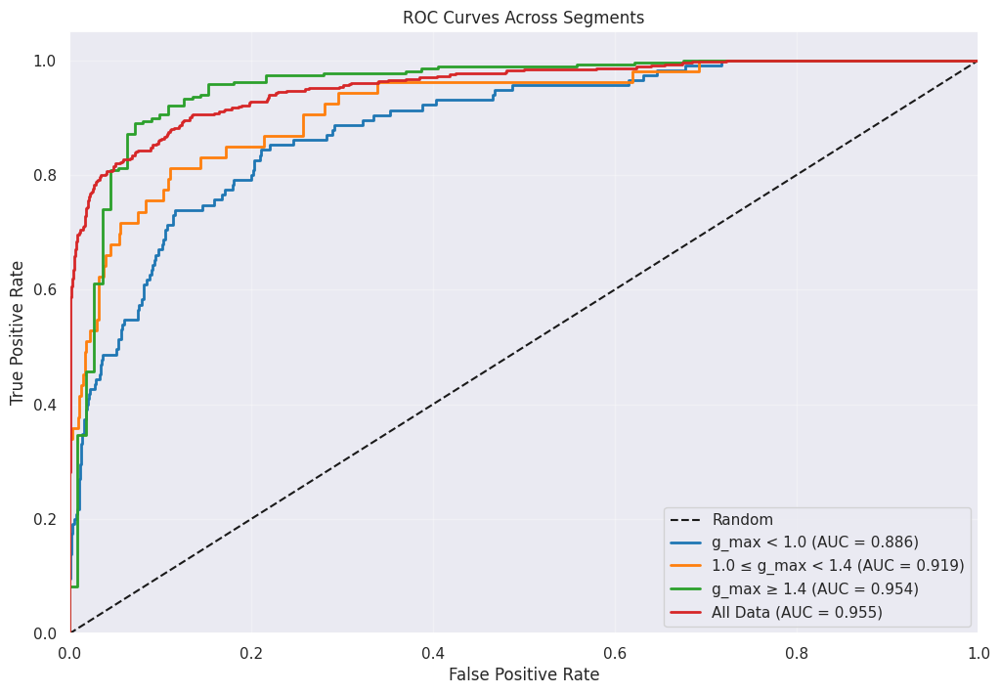

In [108]:
from simpml.tabular.all import *

indexsplitter = IndexSplitter(
    split_sets = {
            Dataset.Train: train_ids, Dataset.Valid: test_ids
        }
)

data_manager = SupervisedTabularDataManager(
    data = features,
    target = 'collision_label',
    prediction_type = PredictionType.BinaryClassification,
    splitter = indexsplitter
)


data_manager.build_pipeline(
    remove_special_json_characters=False,
    step_params = {'encoding_dict': {'normal':0,'collision':1}},
    smote=False
)

exp_mang = ExperimentManager(data_manager, optimize_metric = MetricName.AUC)
exp_mang.remove_models(['LightGBM', 'Support Vector Classifier','AdaBoost Classifier','Decision Tree','Gradient Boosting'])
exp_mang.run_experiment(metrics_kwargs = {'pos_label': 1})

best_model = exp_mang.get_best_model()
#best_model.export('best_model_imu_fi.pkl')

X, y = data_manager.get_validation_data()

y_pred = best_model.model.predict(X)
y_prob = best_model.model.predict_proba(X)

preds = pd.DataFrame({
    'id': X.index,
    'y_pred': y_pred,
    'y_true': y,
    'y_prob_0': y_prob[:, 0],
    'y_prob_1': y_prob[:, 1]
})

preds = preds.merge(meta_df[['id', 'g_max']], on='id', how='left')

analyzer = SegmentAnalyzer(preds, 'g_max')
analyzer.add_segment(None, 1.0, true_pos_population=2000, true_neg_population=500000)
analyzer.add_segment(1.0, 1.4, true_pos_population=2000, true_neg_population=50000)
analyzer.add_segment(1.4, None, true_pos_population=2000, true_neg_population=5000)
analyzer.add_segment(None, None, true_pos_population=2000, true_neg_population=500000)

results = analyzer.analyze(y_true_col='y_true', y_prob_cols=['y_prob_0', 'y_prob_1'])
summary_df = analyzer.summary()

metrics_fig, pop_fig, data_points_imu = analyzer.plot_segment_comparisons(
    y_true_col='y_true',
    y_prob_cols=['y_prob_0', 'y_prob_1'],
    metric_type='recall'
)

interp = TabularInterpreterBinaryClassification(
    model = best_model,
    data_manager = data_manager,
    opt_metric = exp_mang.opt_metric,
    pos_class = {'pos_class' : 1},
    shap_timeout=300
)
fi = interp.get_feature_importance()
fi = fi.sort_values('feature_importance_vals', ascending=False)
fi.loc[fi['feature_importance_vals']>0.003][:15]

In [ ]:
inference_manager = TabularInferenceManager(data_manager, best_model)

In [ ]:
#inference_manager.export('inference_manager_imu_fi.pkl')

In [ ]:
inference_manager.predict(features)

## +Audio

In [69]:
df_features_with_audio = df_audio.reset_index().drop('label',axis=1).merge(features.reset_index(), left_on="video_id", right_on="index", how="inner").set_index('index').set_index('video_id')

In [70]:
df_features_with_audio.head()

,peak_score,peak_time,mfcc_0,mfcc_1,mfcc_2,mfcc_3,mfcc_4,mfcc_5,mfcc_6,mfcc_7,...,z__percentage_of_reoccurring_datapoints_to_all_datapoints,z__skewness,z__energy_ratio_by_chunks__num_segments_10__segment_focus_4,z__autocorrelation__lag_2,z__autocorrelation__lag_8,z__partial_autocorrelation__lag_3,"z__fft_coefficient__attr_""imag""__coeff_3","z__fft_coefficient__attr_""abs""__coeff_95",z__ratio_value_number_to_time_series_length,collision_label
video_id,,,,,,,,,,,,,,,,,,,,,
367891ae6af8b24f1bfb8e96ca35d9a1,0.441727,3.5,-343.58260,197.39047,-19.490360,50.986347,11.965891,7.569995,30.386732,1.850265,...,0.827653,-0.537058,0.280326,0.946813,0.825315,-0.242810,3.926687,1.817288,0.363194,normal
937208edd45511ca256f5d4dc3351263,0.550961,6.0,-330.80490,128.40031,33.331810,24.615595,32.670550,20.528950,16.334747,15.476773,...,0.882412,3.070976,0.239130,0.980698,0.865535,-0.186643,1.842168,0.613940,0.215075,normal
7f1aed3ab04eeba8de79ee2ff22d8c15,0.357839,2.5,-312.00336,191.77164,5.177242,45.191963,24.067986,11.284945,33.438942,15.550726,...,0.867399,-1.662599,0.073272,0.953482,0.879284,0.046962,30.571136,2.594503,0.320147,normal
0ffccb09edfa12b1dd4d5d910324f1f8,0.388285,6.0,-279.26215,190.12830,-26.101332,57.418625,11.839854,8.999070,33.438430,-3.143236,...,0.891972,2.364662,0.232440,0.971910,0.803958,-0.081373,25.870213,2.114017,0.240833,normal
547a9d69d1e251d2bcc74b164b18b33e,0.381722,0.5,-262.43878,164.61203,35.562640,27.613102,-7.194649,11.934116,25.803160,-5.770697,...,0.850541,2.638319,0.136526,0.972054,0.891536,-0.071497,-6.945234,1.854544,0.374631,normal


,Experiment ID,Experiment Description,Model,Model Description,Data Version,Data Description,Model Params,Metric Params,Accuracy,AUC,Recall,Precision,Balanced Accuracy,F1,Run Time
0,20250406163448_ad9f,,Baseline Classification,Default settings,9bd3d46f,,"{'experiment_manager': Prediction Type: PredictionType.BinaryClassification, Metric: Metric: AUC. Description: , Random State: 0}",{'pos_label': 1},0.807021,0.497686,0.122402,0.084936,0.497686,0.100284,0:00:00
1,20250406163448_ad9f,,Logistic Regression,Default settings,9bd3d46f,,"{'experiment_manager': Prediction Type: PredictionType.BinaryClassification, Metric: Metric: AUC. Description: , Random State: 0}",{'pos_label': 1},0.965097,0.858778,0.729792,0.851752,0.858778,0.786070,0:00:01
2,20250406163448_ad9f,,Random Forest,Default settings,9bd3d46f,,"{'experiment_manager': Prediction Type: PredictionType.BinaryClassification, Metric: Metric: AUC. Description: , Random State: 0}",{'pos_label': 1},0.966924,0.853518,0.715935,0.885714,0.853518,0.791826,0:00:02
3,20250406163448_ad9f,,XGBoost,Default settings,9bd3d46f,,"{'experiment_manager': Prediction Type: PredictionType.BinaryClassification, Metric: Metric: AUC. Description: , Random State: 0}",{'pos_label': 1},0.966518,0.859557,0.729792,0.868132,0.859557,0.792974,0:00:03



=== Analyzing Segment: g_max < 1.0 ===
Segment size: 3965 samples


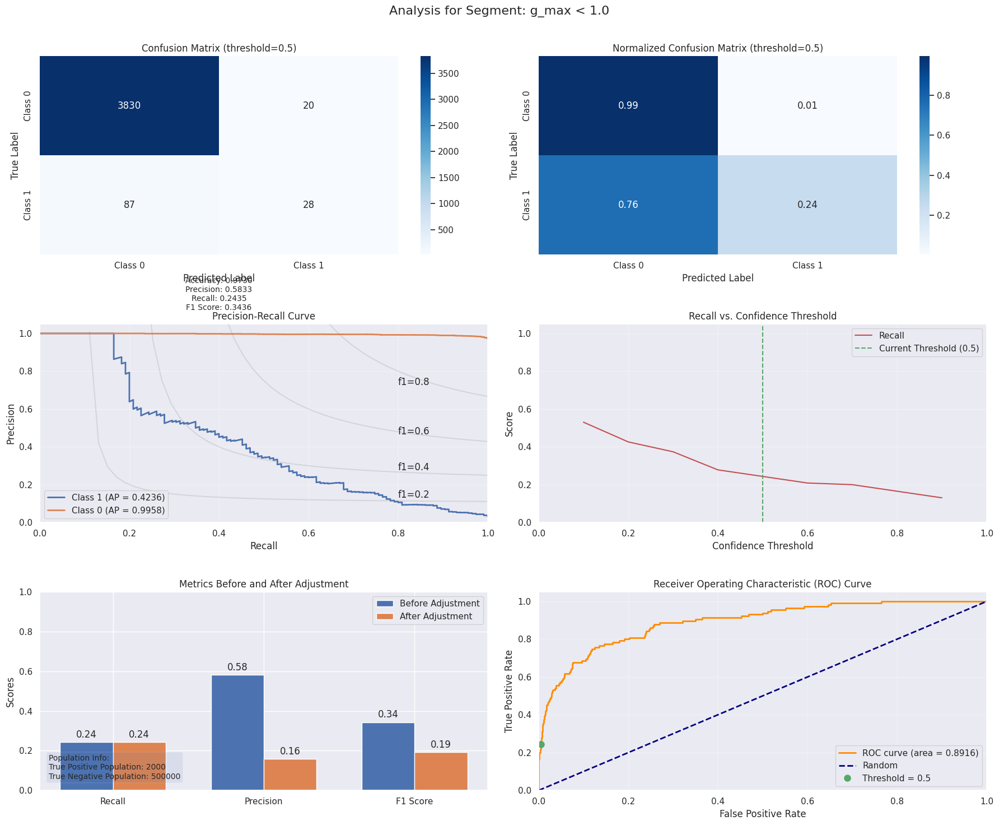


Segment: g_max < 1.0
True Positive Population: 2000
True Negative Population: 500000
Samples: 3965
TN: 3830
FP: 20
FN: 87
TP: 28
Recall: 0.2435
Precision: 0.5833
F1: 0.3436
ROC_AUC: 0.8916
Precision_adj: 0.1579
F1_adj: 0.1916
Pop_TP: 2000
Pop_TN: 500000

=== Analyzing Segment: 1.0 ≤ g_max < 1.4 ===
Segment size: 587 samples


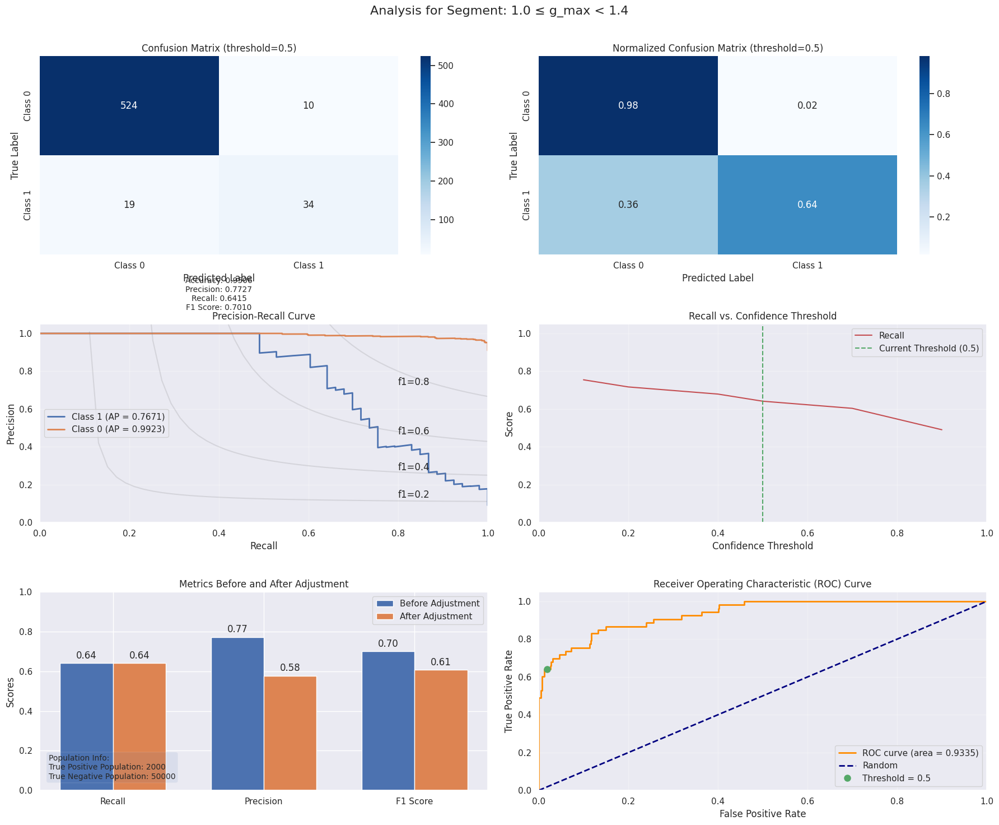


Segment: 1.0 ≤ g_max < 1.4
True Positive Population: 2000
True Negative Population: 50000
Samples: 587
TN: 524
FP: 10
FN: 19
TP: 34
Recall: 0.6415
Precision: 0.7727
F1: 0.7010
ROC_AUC: 0.9335
Precision_adj: 0.5781
F1_adj: 0.6082
Pop_TP: 2000
Pop_TN: 50000

=== Analyzing Segment: g_max ≥ 1.4 ===
Segment size: 376 samples


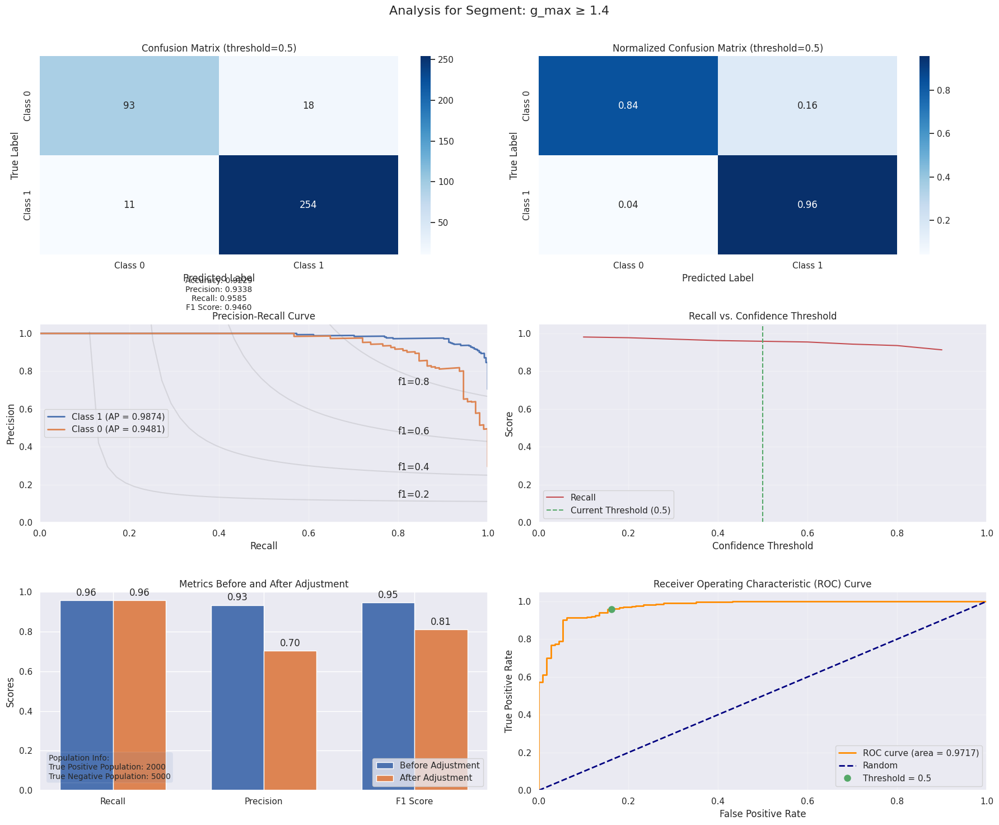


Segment: g_max ≥ 1.4
True Positive Population: 2000
True Negative Population: 5000
Samples: 376
TN: 93
FP: 18
FN: 11
TP: 254
Recall: 0.9585
Precision: 0.9338
F1: 0.9460
ROC_AUC: 0.9717
Precision_adj: 0.7028
F1_adj: 0.8109
Pop_TP: 2000
Pop_TN: 5000

=== Analyzing Segment: All Data ===
Segment size: 4928 samples


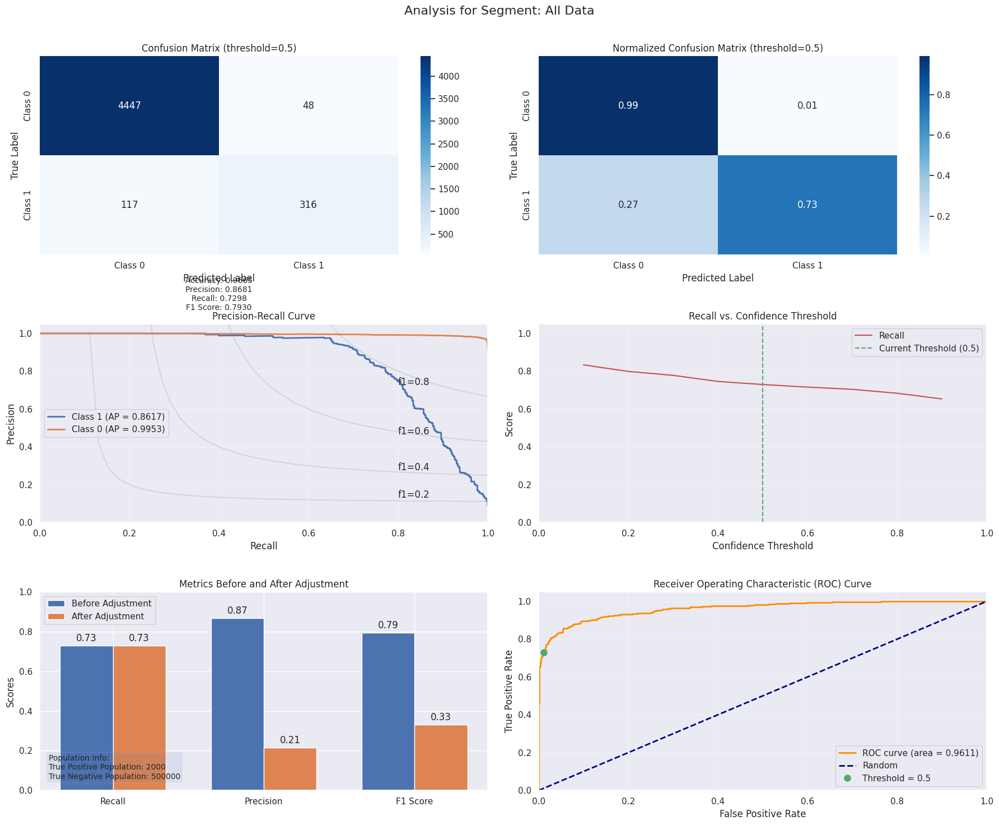


Segment: All Data
True Positive Population: 2000
True Negative Population: 500000
Samples: 4928
TN: 4447
FP: 48
FN: 117
TP: 316
Recall: 0.7298
Precision: 0.8681
F1: 0.7930
ROC_AUC: 0.9611
Precision_adj: 0.2147
F1_adj: 0.3318
Pop_TP: 2000
Pop_TN: 500000


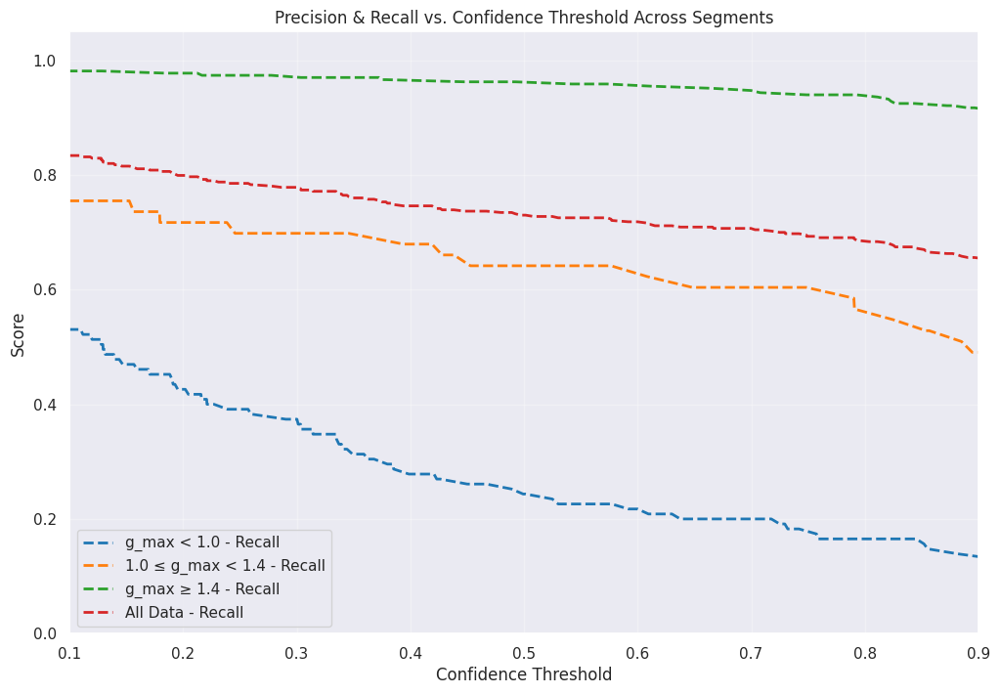

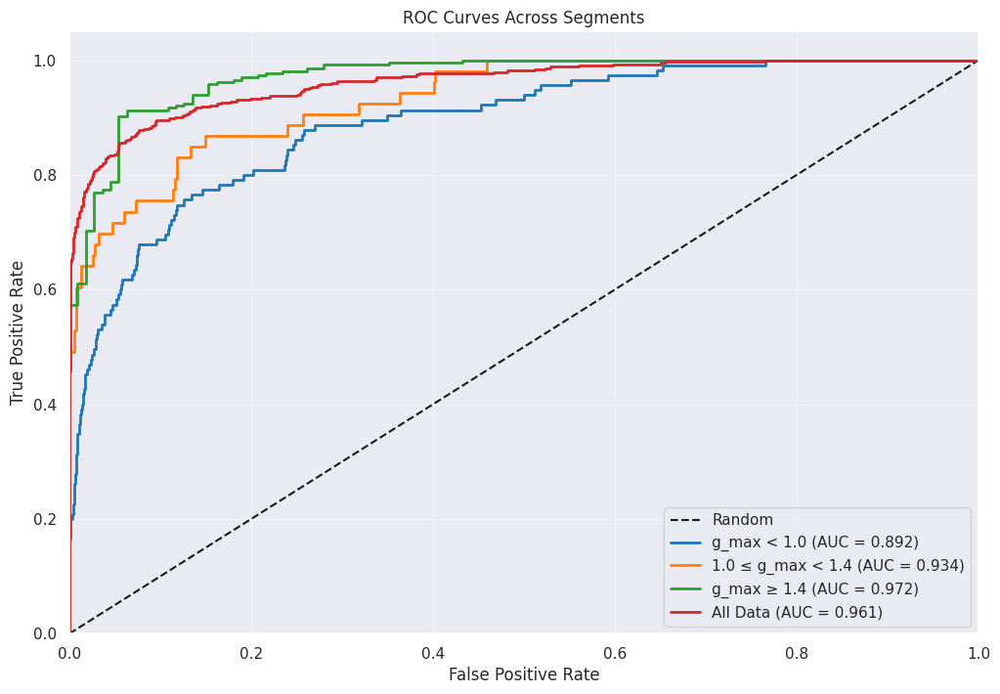

In [104]:
from simpml.tabular.all import *

indexsplitter = IndexSplitter(
    split_sets = {
            Dataset.Train: train_ids, Dataset.Valid: test_ids
        }
)

data_manager = SupervisedTabularDataManager(
    data = df_features_with_audio,
    target = 'collision_label',
    prediction_type = PredictionType.BinaryClassification,
    splitter = indexsplitter
)


data_manager.build_pipeline(
    remove_special_json_characters=False,
    step_params = {'encoding_dict': {'normal':0,'collision':1}},
    smote=False
)

exp_mang = ExperimentManager(data_manager, optimize_metric = MetricName.AUC)
exp_mang.remove_models(['LightGBM', 'Support Vector Classifier','AdaBoost Classifier','Decision Tree','Gradient Boosting'])
exp_mang.run_experiment(metrics_kwargs = {'pos_label': 1})

best_model = exp_mang.get_best_model()
#best_model.export('best_model_imu_fi.pkl')

X, y = data_manager.get_validation_data()

y_pred = best_model.model.predict(X)
y_prob = best_model.model.predict_proba(X)

preds = pd.DataFrame({
    'id': X.index,
    'y_pred': y_pred,
    'y_true': y,
    'y_prob_0': y_prob[:, 0],
    'y_prob_1': y_prob[:, 1]
})

preds = preds.merge(meta_df[['id', 'g_max']], on='id', how='left')

analyzer = SegmentAnalyzer(preds, 'g_max')
analyzer.add_segment(None, 1.0, true_pos_population=2000, true_neg_population=500000)
analyzer.add_segment(1.0, 1.4, true_pos_population=2000, true_neg_population=50000)
analyzer.add_segment(1.4, None, true_pos_population=2000, true_neg_population=5000)
analyzer.add_segment(None, None, true_pos_population=2000, true_neg_population=500000)

results = analyzer.analyze(y_true_col='y_true', y_prob_cols=['y_prob_0', 'y_prob_1'])
summary_df = analyzer.summary()

metrics_fig, pop_fig, data_points_imu_audio = analyzer.plot_segment_comparisons(
    y_true_col='y_true',
    y_prob_cols=['y_prob_0', 'y_prob_1'],
    metric_type='recall'
)

,Experiment ID,Experiment Description,Model,Model Description,Data Version,Data Description,Model Params,Metric Params,Accuracy,AUC,Recall,Precision,Balanced Accuracy,F1,Run Time
0,20250406161415_17bd,,Baseline Classification,Default settings,518d697c,,"{'experiment_manager': Prediction Type: PredictionType.BinaryClassification, Metric: Metric: AUC. Description: , Random State: 0}",{'pos_label': 1},0.802760,0.479697,0.087760,0.061789,0.479697,0.072519,0:00:00
1,20250406161415_17bd,,Logistic Regression,Default settings,518d697c,,"{'experiment_manager': Prediction Type: PredictionType.BinaryClassification, Metric: Metric: AUC. Description: , Random State: 0}",{'pos_label': 1},0.943588,0.793769,0.612009,0.706667,0.793769,0.655941,0:00:00
2,20250406161415_17bd,,Random Forest,Default settings,518d697c,,"{'experiment_manager': Prediction Type: PredictionType.BinaryClassification, Metric: Metric: AUC. Description: , Random State: 0}",{'pos_label': 1},0.947240,0.771771,0.558891,0.778135,0.771771,0.650538,0:00:01
3,20250406161415_17bd,,XGBoost,Default settings,518d697c,,"{'experiment_manager': Prediction Type: PredictionType.BinaryClassification, Metric: Metric: AUC. Description: , Random State: 0}",{'pos_label': 1},0.945211,0.783180,0.586605,0.736232,0.783180,0.652956,0:00:01



=== Analyzing Segment: g_max < 1.0 ===
Segment size: 3965 samples


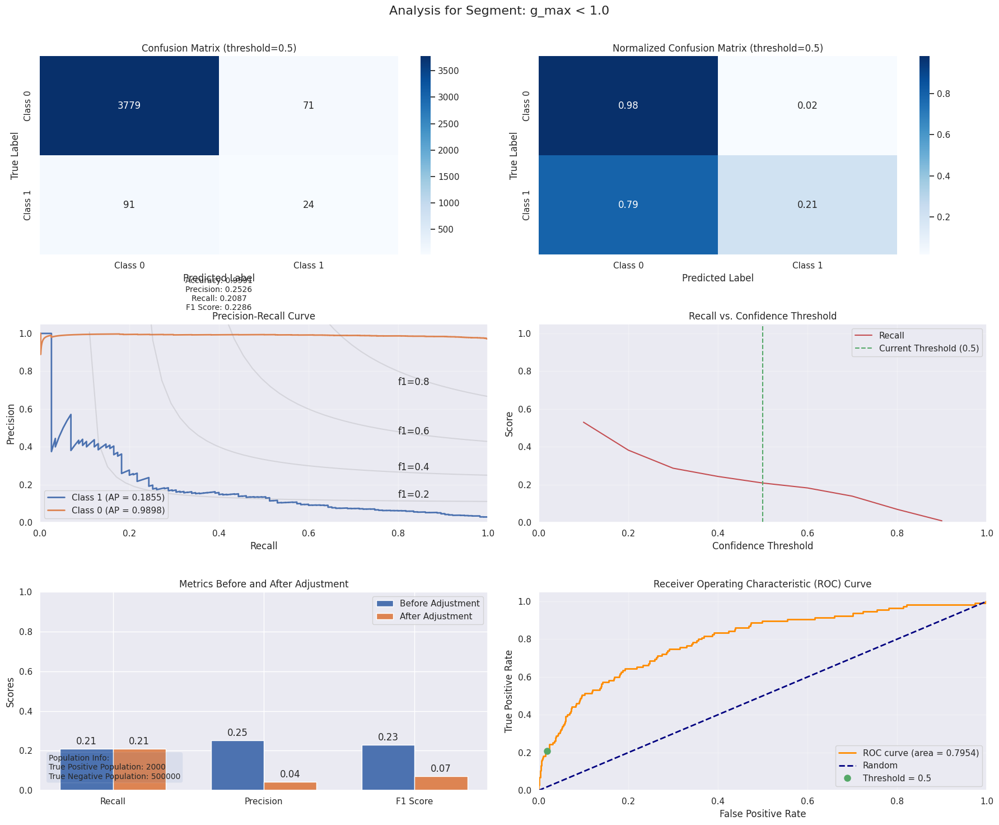


Segment: g_max < 1.0
True Positive Population: 2000
True Negative Population: 500000
Samples: 3965
TN: 3779
FP: 71
FN: 91
TP: 24
Recall: 0.2087
Precision: 0.2526
F1: 0.2286
ROC_AUC: 0.7954
Precision_adj: 0.0433
F1_adj: 0.0717
Pop_TP: 2000
Pop_TN: 500000

=== Analyzing Segment: 1.0 ≤ g_max < 1.4 ===
Segment size: 587 samples


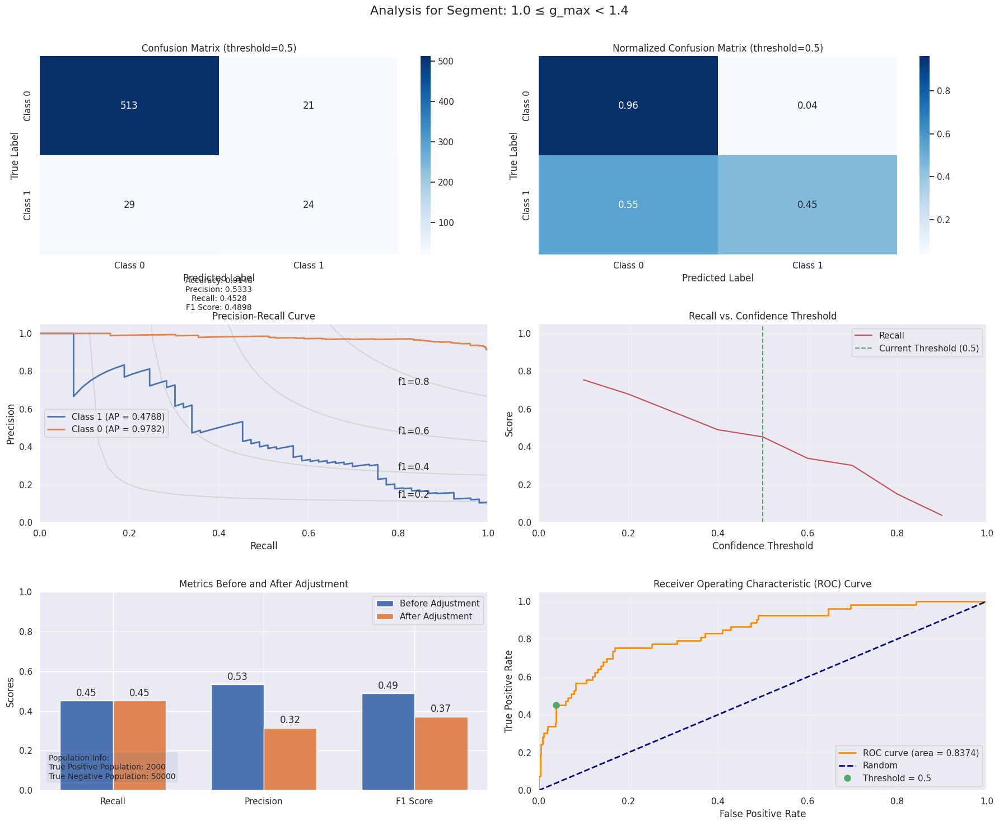


Segment: 1.0 ≤ g_max < 1.4
True Positive Population: 2000
True Negative Population: 50000
Samples: 587
TN: 513
FP: 21
FN: 29
TP: 24
Recall: 0.4528
Precision: 0.5333
F1: 0.4898
ROC_AUC: 0.8374
Precision_adj: 0.3153
F1_adj: 0.3718
Pop_TP: 2000
Pop_TN: 50000

=== Analyzing Segment: g_max ≥ 1.4 ===
Segment size: 376 samples


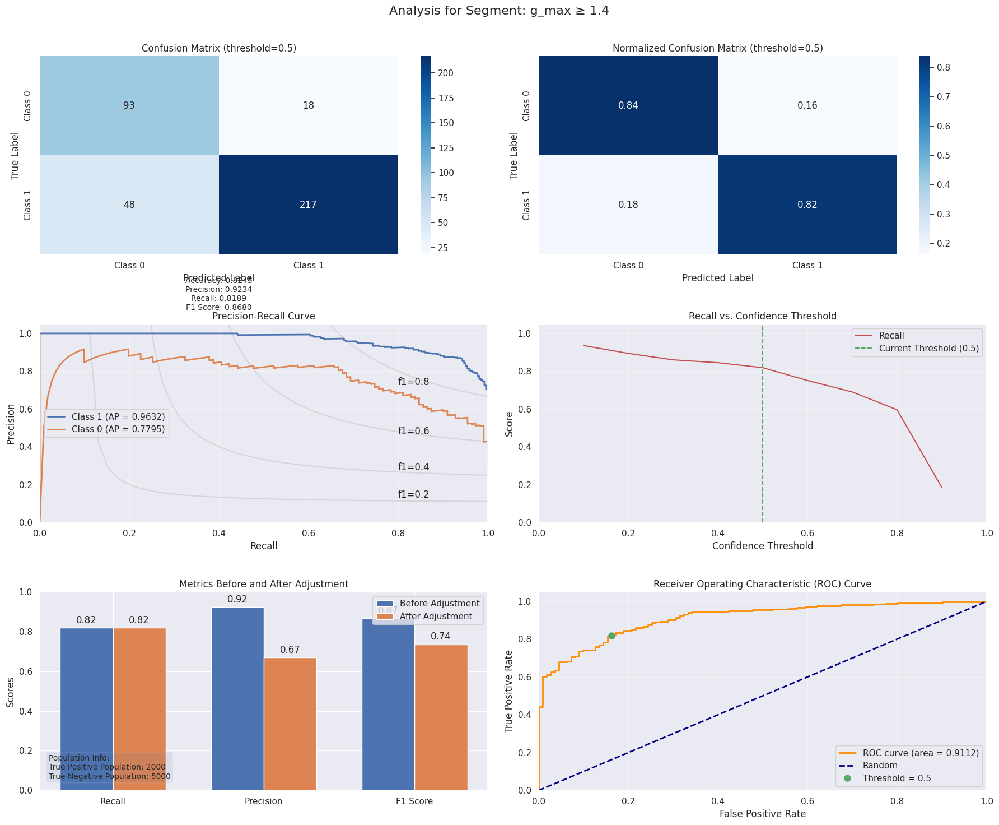


Segment: g_max ≥ 1.4
True Positive Population: 2000
True Negative Population: 5000
Samples: 376
TN: 93
FP: 18
FN: 48
TP: 217
Recall: 0.8189
Precision: 0.9234
F1: 0.8680
ROC_AUC: 0.9112
Precision_adj: 0.6689
F1_adj: 0.7363
Pop_TP: 2000
Pop_TN: 5000

=== Analyzing Segment: All Data ===
Segment size: 4928 samples


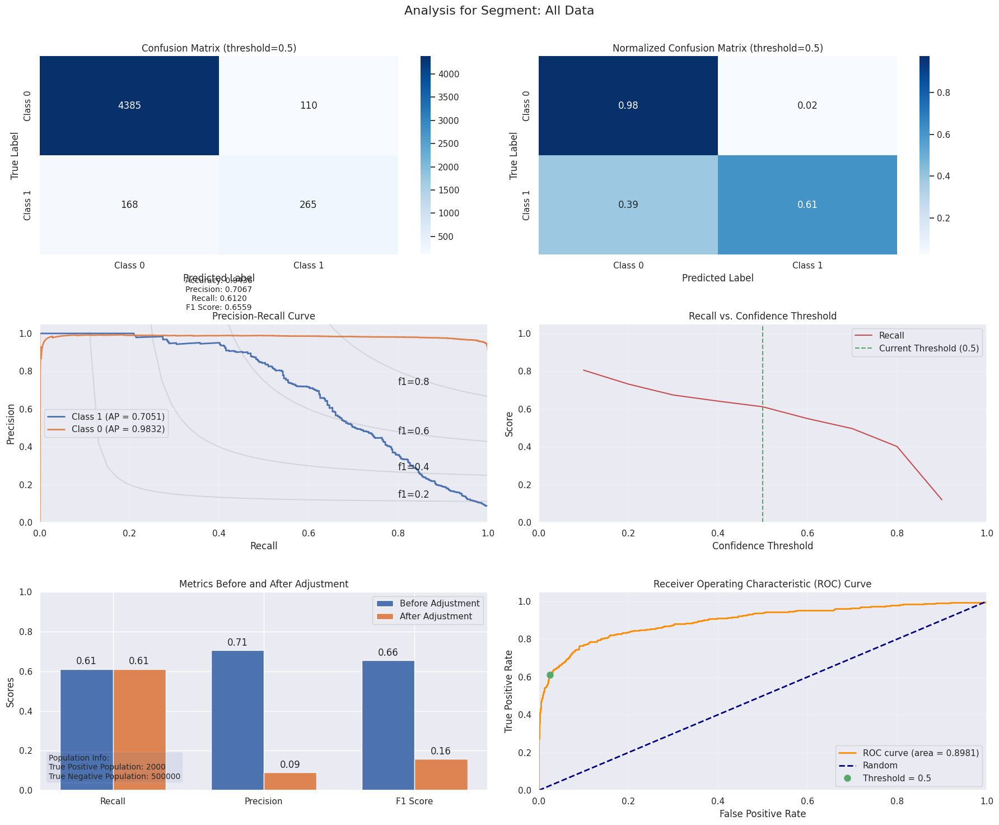


Segment: All Data
True Positive Population: 2000
True Negative Population: 500000
Samples: 4928
TN: 4385
FP: 110
FN: 168
TP: 265
Recall: 0.6120
Precision: 0.7067
F1: 0.6559
ROC_AUC: 0.8981
Precision_adj: 0.0909
F1_adj: 0.1583
Pop_TP: 2000
Pop_TN: 500000


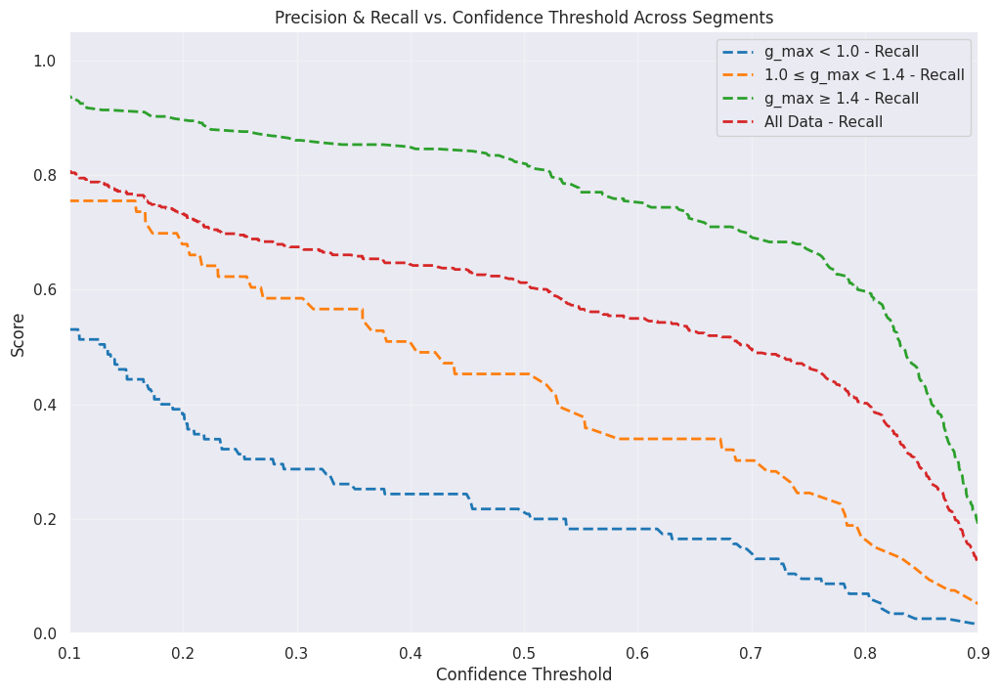

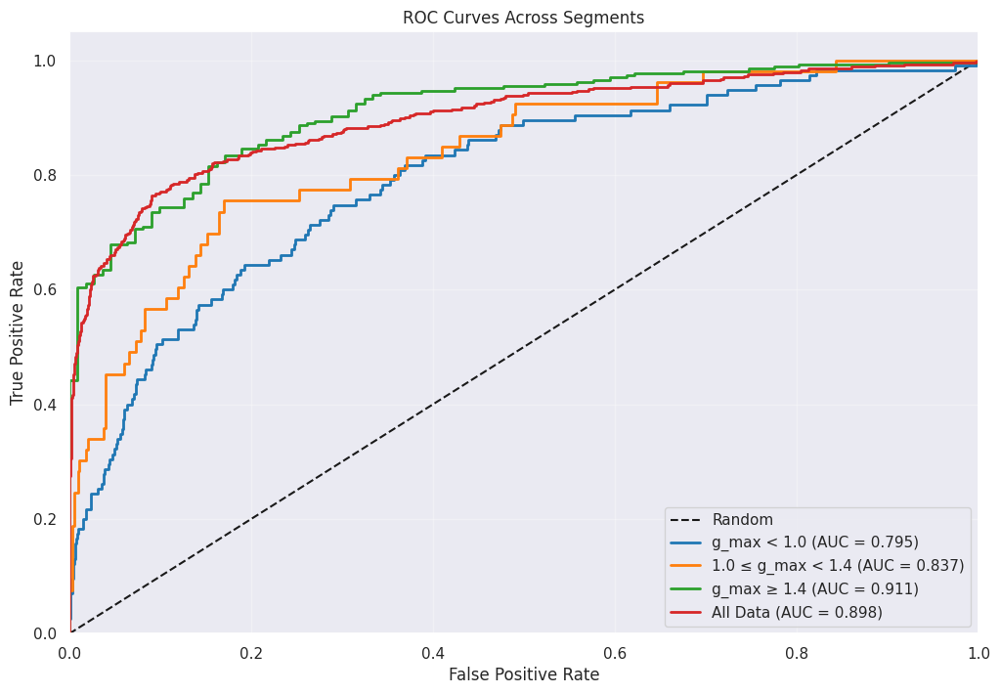

In [75]:
from simpml.tabular.all import *

indexsplitter = IndexSplitter(
    split_sets = {
            Dataset.Train: train_ids, Dataset.Valid: test_ids
        }
)

data_manager = SupervisedTabularDataManager(
    data = df_audio,
    target = 'label',
    prediction_type = PredictionType.BinaryClassification,
    splitter = indexsplitter
)


data_manager.build_pipeline(
    remove_special_json_characters=False,
    step_params = {'encoding_dict': {'normal':0,'collision':1}},
    smote=False
)

exp_mang = ExperimentManager(data_manager, optimize_metric = MetricName.AUC)
exp_mang.remove_models(['LightGBM', 'Support Vector Classifier','AdaBoost Classifier','Decision Tree','Gradient Boosting'])
exp_mang.run_experiment(metrics_kwargs = {'pos_label': 1})

best_model = exp_mang.get_best_model()
#best_model.export('best_model_imu_fi.pkl')

X, y = data_manager.get_validation_data()

y_pred = best_model.model.predict(X)
y_prob = best_model.model.predict_proba(X)

preds = pd.DataFrame({
    'id': X.index,
    'y_pred': y_pred,
    'y_true': y,
    'y_prob_0': y_prob[:, 0],
    'y_prob_1': y_prob[:, 1]
})

preds = preds.merge(meta_df[['id', 'g_max']], on='id', how='left')

analyzer = SegmentAnalyzer(preds, 'g_max')
analyzer.add_segment(None, 1.0, true_pos_population=2000, true_neg_population=500000)
analyzer.add_segment(1.0, 1.4, true_pos_population=2000, true_neg_population=50000)
analyzer.add_segment(1.4, None, true_pos_population=2000, true_neg_population=5000)
analyzer.add_segment(None, None, true_pos_population=2000, true_neg_population=500000)

results = analyzer.analyze(y_true_col='y_true', y_prob_cols=['y_prob_0', 'y_prob_1'])
summary_df = analyzer.summary()

metrics_fig, pop_fig, data_points_audio = analyzer.plot_segment_comparisons(
    y_true_col='y_true',
    y_prob_cols=['y_prob_0', 'y_prob_1'],
    metric_type='recall'
)

In [77]:
data_points_audio.keys()

dict_keys(['g_max < 1.0_recall', 'g_max < 1.0_roc', '1.0 ≤ g_max < 1.4_recall', '1.0 ≤ g_max < 1.4_roc', 'g_max ≥ 1.4_recall', 'g_max ≥ 1.4_roc', 'All Data_recall', 'All Data_roc'])

In [80]:
data_points_audio['g_max < 1.0_recall'].keys()

dict_keys(['thresholds', 'values'])

In [83]:
data_points_audio['g_max < 1.0_recall']['values'][:10]

[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.991304347826087]

In [102]:
import matplotlib.pyplot as plt
import numpy as np
from typing import Dict, List, Tuple, Any

def plot_metrics(data_points_dict: Dict[str, Dict[str, Dict[str, Any]]], 
                 output_filename: str = None,
                 figsize: Tuple[int, int] = (14, 8),
                 dpi: int = 300,
                 plot_background: bool = True,
                 first_model_dashed: bool = True):
    """
    Plot recall and ROC curves for multiple data dictionaries, with colors based on g_max categories.
    
    Args:
        data_points_dict: Dictionary where keys are model names and values are data dictionaries
        output_filename: If provided, save the figure to this filename
        figsize: Size of the figure (width, height)
        dpi: Resolution of the figure
        plot_background: Whether to plot light gray background
    
    Returns:
        Tuple containing:
            - recall_fig: Figure object for recall vs threshold
            - roc_fig: Figure object for ROC curves
    """
    # Define g_max categories and their labels
    g_max_categories = [
        "g_max < 1.0",
        "1.0 ≤ g_max < 1.4",
        "g_max ≥ 1.4",
        #"All Data"
    ]
    
    # Define colors for g_max categories
    colors = {
        "g_max < 1.0": "blue",
        "1.0 ≤ g_max < 1.4": "orange",
        "g_max ≥ 1.4": "green",
        #"All Data": "red"
    }
    
    # Create separate figures with gray background if requested
    recall_fig, ax_recall = plt.subplots(figsize=figsize)
    roc_fig, ax_roc = plt.subplots(figsize=figsize)
    
    if plot_background:
        ax_recall.set_facecolor('#f0f0f0')
        ax_roc.set_facecolor('#f0f0f0')
    
    # Add diagonal reference line for ROC plot
    ax_roc.plot([0, 1], [0, 1], 'k--', label='Random', alpha=0.7)
    
    # Line styles for different models
    model_line_styles = {
        0: '--' if first_model_dashed else '-',  # First model line style
        1: '-' if first_model_dashed else '--',  # Second model line style
    }
    
    # Process each g_max category to match the image style
    for g_max_cat in g_max_categories:
        # Process for the recall plot
        recall_key = f"{g_max_cat}_recall"
        category_color = colors[g_max_cat]
        
        for dict_idx, (dict_name, data_dict) in enumerate(data_points_dict.items()):
            if recall_key in data_dict:
                if "thresholds" not in data_dict[recall_key] or "values" not in data_dict[recall_key]:
                    continue
                
                thresholds = data_dict[recall_key]['thresholds']
                recall_values = data_dict[recall_key]['values']
                
                # Sort thresholds and values together
                points = sorted(zip(thresholds, recall_values))
                if points:
                    thresholds_sorted, recall_values_sorted = zip(*points)
                    
                    # Use appropriate line style based on model index
                    line_style = model_line_styles.get(dict_idx, '--' if dict_idx % 2 == 0 else '-')
                    label = f"{dict_name} - {g_max_cat} - Recall"
                    
                    ax_recall.plot(thresholds_sorted, recall_values_sorted, 
                                  linestyle=line_style,
                                  color=category_color,
                                  label=label,
                                  linewidth=1.5,
                                  alpha=0.9)
        
        # Process for the ROC plot
        roc_key = f"{g_max_cat}_roc"
        
        for dict_idx, (dict_name, data_dict) in enumerate(data_points_dict.items()):
            if roc_key in data_dict:
                # Check if ROC data is in fpr/tpr format
                if "fpr" in data_dict[roc_key] and "tpr" in data_dict[roc_key]:
                    fpr = data_dict[roc_key]['fpr']
                    tpr = data_dict[roc_key]['tpr']
                    
                    # Calculate AUC if there are enough points
                    if len(fpr) > 1 and len(tpr) > 1:
                        try:
                            from sklearn.metrics import auc
                            roc_auc = auc(fpr, tpr)
                            auc_text = f" (AUC = {roc_auc:.3f})"
                        except:
                            auc_text = ""
                    else:
                        auc_text = ""
                    
                    # Sort by fpr to ensure proper line drawing
                    points = sorted(zip(fpr, tpr))
                    if points:
                        fpr_sorted, tpr_sorted = zip(*points)
                        
                        # Use appropriate line style based on model index
                        line_style = model_line_styles.get(dict_idx, '--' if dict_idx % 2 == 0 else '-')
                        label = f"{dict_name} - {g_max_cat}{auc_text}"
                        
                        ax_roc.plot(fpr_sorted, tpr_sorted, 
                                    linestyle=line_style,
                                    color=category_color,
                                    label=label,
                                    linewidth=1.5,
                                    alpha=0.9)
                
                # Check if ROC data is in thresholds/values format
                elif "thresholds" in data_dict[roc_key] and "values" in data_dict[roc_key]:
                    thresholds = data_dict[roc_key]['thresholds']
                    values = data_dict[roc_key]['values']
                    
                    # Sort thresholds and values together
                    points = sorted(zip(thresholds, values))
                    if points:
                        thresholds_sorted, values_sorted = zip(*points)
                        
                                                        # Use appropriate line style based on model index
                        line_style = model_line_styles.get(dict_idx, '--' if dict_idx % 2 == 0 else '-')
                        label = f"{dict_name} - {g_max_cat}"
                            
                        ax_roc.plot(thresholds_sorted, values_sorted, 
                                    linestyle=line_style,
                                    color=category_color,
                                    label=label,
                                    linewidth=1.5,
                                    alpha=0.9)
    
    # Finalize recall plot
    ax_recall.set_xlabel('Confidence Threshold', fontsize=12)
    ax_recall.set_ylabel('Score', fontsize=12)
    ax_recall.set_title('Precision & Recall vs. Confidence Threshold Across Segments', fontsize=14)
    ax_recall.set_xlim([0.1, 0.9])
    ax_recall.set_ylim([0.0, 1.05])
    ax_recall.grid(alpha=0.3)
    ax_recall.legend(loc='lower left', fontsize=9, framealpha=0.9)
    
    # Finalize ROC plot
    ax_roc.set_xlabel('False Positive Rate', fontsize=12)
    ax_roc.set_ylabel('True Positive Rate', fontsize=12)
    ax_roc.set_title('ROC Curves Across Segments', fontsize=14)
    ax_roc.set_xlim([0.0, 1.0])
    ax_roc.set_ylim([0.0, 1.05])
    ax_roc.grid(alpha=0.3)
    ax_roc.legend(loc='lower right', fontsize=9, framealpha=0.9)
    
    # Apply tight layout
    recall_fig.tight_layout()
    roc_fig.tight_layout()
    
    # Save figures if output_filename is provided
    if output_filename:
        recall_fig.savefig(f"{output_filename}_recall.png", dpi=dpi, bbox_inches='tight')
        roc_fig.savefig(f"{output_filename}_roc.png", dpi=dpi, bbox_inches='tight')
    
    return recall_fig, roc_fig

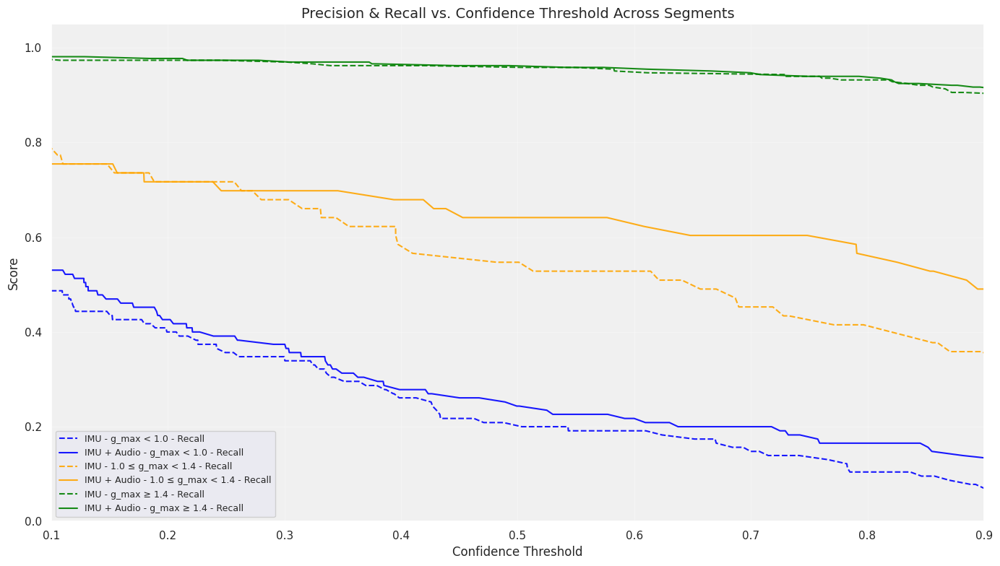

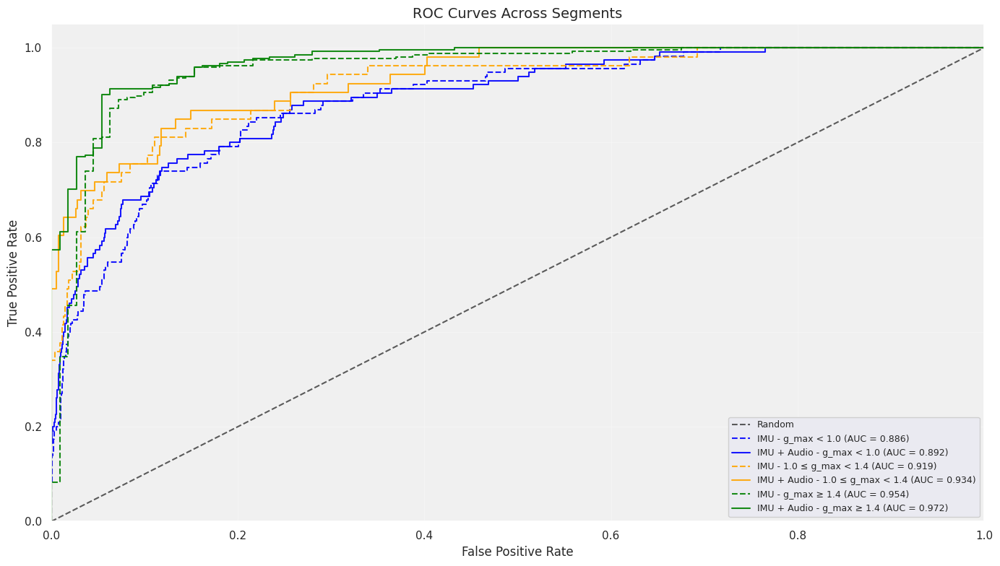

In [103]:
all_data = {
    "IMU": data_points_imu,
    "IMU + Audio": data_points_imu_audio
}

# Plot metrics
fig, axes = plot_metrics(all_data, output_filename="metrics_comparison.png")
plt.show()